# Comparying CSHT between resolutions

How does progressively solving the eddy dynamics on Antarctic Margins can alter the total poleward heat transport towards the Antarctic Shelf, as well as its seasonality,and variability across different timescales? We can compare the 3 resolutions of panan to understand that a little better

In [1]:
import cosima_cookbook as cc
import matplotlib.pyplot as plt
import cmocean as cm
import numpy as np
from dask.distributed import Client
from scipy.interpolate import interp1d

import xarray as xr
import cf_xarray as cfxr

In [2]:
client = Client(threads_per_worker = 1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 48
Total threads: 48,Total memory: 1.44 TiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:32955,Workers: 48
Dashboard: /proxy/8787/status,Total threads: 48
Started: Just now,Total memory: 1.44 TiB
Comm: tcp://127.0.0.1:33279,Total threads: 1
Dashboard: /proxy/43253/status,Memory: 30.62 GiB
Nanny: tcp://127.0.0.1:38407,


ERROR:sqlalchemy.pool.impl.NullPool:Exception during reset or similar
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.07/lib/python3.10/site-packages/sqlalchemy/pool/base.py", line 763, in _finalize_fairy
    fairy._reset(pool, transaction_was_reset)
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.07/lib/python3.10/site-packages/sqlalchemy/pool/base.py", line 1038, in _reset
    pool._dialect.do_rollback(self)
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.07/lib/python3.10/site-packages/sqlalchemy/engine/default.py", line 683, in do_rollback
    dbapi_connection.rollback()
sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 22476021728256 and this is thread id 22474708506368.
ERROR:sqlalchemy.pool.impl.NullPool:Exception closing connection <sqlite3.Connection object at 0x146e55240740>
Traceback (most recent call last):
  File "/g

In [6]:
#panan sessions
session_p01 = cc.database.create_session('/home/156/wf4500/databases/access/panan01_HTsigma.db') #panan01
session_p005 = cc.database.create_session('/home/156/wf4500/databases/access/panan005_rerun.db') #panan005
session_p0025 = cc.database.create_session('/home/156/wf4500/databases/access/panan0025_rerun.db') #panan005

#let's also import the mass transports
Mass_transports_dir  = '/g/data/e14/cs6673/PanAntarctic_AABW/data_analysis/'

filenamebase = 'vol_transp_across_1000m_isobath_panan'

start_time = '1999-01-01'
end_time = '2001-01-01'
time_slice=slice(start_time, end_time)

#importing volume transports
p01_MT = xr.open_mfdataset(Mass_transports_dir + filenamebase +'_01deg_ryf_1m_****.nc').sel(time=time_slice).compute()
p005_MT = xr.open_mfdataset(Mass_transports_dir + filenamebase + '_005deg_ryf_1m_*.nc').sel(time=time_slice).compute()
p0025_MT = xr.open_mfdataset(Mass_transports_dir + filenamebase + '_0025deg_ryf_1m_*.nc').sel(time=time_slice).compute()



In [7]:
lat_slice  = slice(-83,-59)

figdir = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/figs/'

In [8]:
# #lets import the the density to see how it changes along isobaths
# #σ
# σ01_montlhy_mean = cc.querying.getvar('panan01_yr2000_HTsigma','rhopot2',session_p01,frequency='1 monthly',ncfile = '%ocean_month_z.nc',\
#                             start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yh=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()
# σ005_montlhy_mean = cc.querying.getvar('panan_005deg_jra55_ryf_2024_12_14','rhopot2',session_p005,frequency='1 monthly',ncfile = '%ocean_month_z.nc',\
#                             start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yh=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()
# σ0025_montlhy_mean = cc.querying.getvar('mom6-panan','rhopot2',session_p0025,frequency='1 monthly',ncfile = '%ocean_month_z.nc',\
#                             start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yh=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()

# #saving these average density fields
# base_savedir = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/'
# σ01_montlhy_mean.to_netcdf(base_savedir + 'panan01_rerun/EKE_along_contour/mean_rho_xyzt_1999_2001_panan01.nc')
# σ005_montlhy_mean.to_netcdf(base_savedir + 'panan005_rerun/EKE_along_contour/mean_rho_xyzt_1999_2001_panan005.nc')
# σ0025_montlhy_mean.to_netcdf(base_savedir + 'panan0025_rerun/EKE_along_contour/mean_rho_xyzt_1999_2001_panan0025.nc')

In [9]:
#loading these average density fields
base_savedir = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/'
σ01_montlhy_mean = xr.open_dataset(base_savedir + 'panan01_rerun/EKE_along_contour/mean_rho_xyzt_1999_2001_panan01.nc').rhopot2.compute()
σ005_montlhy_mean = xr.open_dataset(base_savedir + 'panan005_rerun/EKE_along_contour/mean_rho_xyzt_1999_2001_panan005.nc').rhopot2.compute()
σ0025_montlhy_mean = xr.open_dataset(base_savedir + 'panan0025_rerun/EKE_along_contour/mean_rho_xyzt_1999_2001_panan0025.nc').rhopot2.compute()



In [142]:
## Importing the cross-slope heat transport ....
#panan01 daily as f(z,time)
src_p01 = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/panan01_rerun/CSHT_month_rhoonline/*'
#panan005 daily as f(z,time)
src_p005 = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/panan005_rerun/CSHT_month_rhoonline/*'
#panan0025 daily as f(z,time)
src_p0025 = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/panan0025_rerun/CSHT_month_rhoonline/*'

# ... across the 1000m isobath ################################################################################################################

#importing panan01
import glob
gl =glob.glob(src_p01 + '1000m*')
gl=sorted(gl)
print("%i netcdf data files"%len(gl))
p01_HT = xr.open_mfdataset(gl, concat_dim='time', combine='nested')

#importing panan005
gl =glob.glob(src_p005 + '1000m*')
gl=sorted(gl)
print("%i netcdf data files"%len(gl))
p005_HT = xr.open_mfdataset(gl, concat_dim='time', combine='nested')

#importing panan0025
gl =glob.glob(src_p0025 + '1000m*')
gl=sorted(gl)
print("%i netcdf data files"%len(gl))
p0025_HT=xr.open_mfdataset(gl, concat_dim='time', combine='nested')
#matching time  for climatological means
p0025_HT['time']=np.array(p0025_HT.time)

# ... across the 700m isobath ################################################################################################################
gl =glob.glob(src_p01 + '700m*')
gl=sorted(gl)
print("%i netcdf data files"%len(gl))
p01_HT_700m = xr.open_mfdataset(gl, concat_dim='time', combine='nested')


#importing panan005
gl =glob.glob(src_p005 + '700m*')
gl=sorted(gl)
print("%i netcdf data files"%len(gl))
p005_HT_700m = xr.open_mfdataset(gl, concat_dim='time', combine='nested')


#importing panan0025
gl =glob.glob(src_p0025 + '700m*')
gl=sorted(gl)
print("%i netcdf data files"%len(gl))
p0025_HT_700m=xr.open_mfdataset(gl, concat_dim='time', combine='nested')
#matching time  for climatological means
p0025_HT_700m['time']=np.array(p0025_HT_700m.time)


# ... across the 2000m isobath ################################################################################################################
gl =glob.glob(src_p01 + '2000m*')
gl=sorted(gl)
print("%i netcdf data files"%len(gl))
p01_HT_2000m = xr.open_mfdataset(gl, concat_dim='time', combine='nested')


#importing panan005
gl =glob.glob(src_p005 + '2000m*')
gl=sorted(gl)
print("%i netcdf data files"%len(gl))
p005_HT_2000m = xr.open_mfdataset(gl, concat_dim='time', combine='nested')


#importing panan0025
gl =glob.glob(src_p0025 + '2000m*')
gl=sorted(gl)
print("%i netcdf data files"%len(gl))
p0025_HT_2000m=xr.open_mfdataset(gl, concat_dim='time', combine='nested')
#matching time  for climatological means
p0025_HT_2000m['time']=np.array(p0025_HT_2000m.time)


36 netcdf data files
36 netcdf data files
36 netcdf data files
36 netcdf data files
36 netcdf data files
36 netcdf data files
36 netcdf data files
36 netcdf data files
36 netcdf data files


In [143]:
#Calculating the time averages #################

#1000 m isobath
p01_HTmean=p01_HT.mean('time')
p005_HTmean=p005_HT.mean('time')
p0025_HTmean=p0025_HT.mean('time')

#700 m isobath
p01_HTmean_700m=p01_HT_700m.mean('time')
p005_HTmean_700m=p005_HT_700m.mean('time')
p0025_HTmean_700m=p0025_HT_700m.mean('time')

#2000 m isobath
p01_HTmean_2000m=p01_HT_2000m.mean('time')
p005_HTmean_2000m=p005_HT_2000m.mean('time')
p0025_HTmean_2000m=p0025_HT_2000m.mean('time')


### Vertically integrating panan

In [144]:
#1000 m isobath
P01_unbinned_HT=p01_HT.unbinned_heat_transp_across_contour.sum('rho2_l')
P01_binned_CSHT=p01_HT.binned_cross_slope_heat_trans.sum('rho2_l')
P01_binned_ZC=p01_HT.zonal_convergence.sum('rho2_l')

P005_unbinned_HT=p005_HT.unbinned_heat_transp_across_contour.sum('rho2_l')
P005_binned_CSHT=p005_HT.binned_cross_slope_heat_trans.sum('rho2_l')
P005_binned_ZC=p005_HT.zonal_convergence.sum('rho2_l')

P0025_unbinned_HT=p0025_HT.unbinned_heat_transp_across_contour.sum('rho2_l')
P0025_binned_CSHT=p0025_HT.binned_cross_slope_heat_trans.sum('rho2_l')
P0025_binned_ZC=p0025_HT.zonal_convergence.sum('rho2_l')

#700 m isobath
P01_unbinned_HT_700m=p01_HT_700m.unbinned_heat_transp_across_contour.sum('rho2_l')
P01_binned_CSHT_700m=p01_HT_700m.binned_cross_slope_heat_trans.sum('rho2_l')
P01_binned_ZC_700m=p01_HT_700m.zonal_convergence.sum('rho2_l')

P005_unbinned_HT_700m=p005_HT_700m.unbinned_heat_transp_across_contour.sum('rho2_l')
P005_binned_CSHT_700m=p005_HT_700m.binned_cross_slope_heat_trans.sum('rho2_l')
P005_binned_ZC_700m=p005_HT_700m.zonal_convergence.sum('rho2_l')

P0025_unbinned_HT_700m=p0025_HT_700m.unbinned_heat_transp_across_contour.sum('rho2_l')
P0025_binned_CSHT_700m=p0025_HT_700m.binned_cross_slope_heat_trans.sum('rho2_l')
P0025_binned_ZC_700m=p0025_HT_700m.zonal_convergence.sum('rho2_l')

#2000 m isobath
P01_unbinned_HT_2000m=p01_HT_2000m.unbinned_heat_transp_across_contour.sum('rho2_l')
P01_binned_CSHT_2000m=p01_HT_2000m.binned_cross_slope_heat_trans.sum('rho2_l')
P01_binned_ZC_2000m=p01_HT_2000m.zonal_convergence.sum('rho2_l')

P005_unbinned_HT_2000m=p005_HT_2000m.unbinned_heat_transp_across_contour.sum('rho2_l')
P005_binned_CSHT_2000m=p005_HT_2000m.binned_cross_slope_heat_trans.sum('rho2_l')
P005_binned_ZC_2000m=p005_HT_2000m.zonal_convergence.sum('rho2_l')

P0025_unbinned_HT_2000m=p0025_HT_2000m.unbinned_heat_transp_across_contour.sum('rho2_l')
P0025_binned_CSHT_2000m=p0025_HT_2000m.binned_cross_slope_heat_trans.sum('rho2_l')
P0025_binned_ZC_2000m=p0025_HT_2000m.zonal_convergence.sum('rho2_l')

In [145]:
# longs and lats in 1000 m isobath

#panan-01
P01_unbinned_lon=p01_HT.isel(time=0).lon_along_contour
P01_binned_lon=p01_HT.isel(time=0).lon_bin_midpoints
P01_unbinned_lat=p01_HT.isel(time=0).lat_along_contour
P01_binned_lat=p01_HT.isel(time=0).lat_bin_midpoints
#panan-005
P005_unbinned_lon=p005_HT.isel(time=0).lon_along_contour
P005_binned_lon=p005_HT.isel(time=0).lon_bin_midpoints
P005_unbinned_lat=p005_HT.isel(time=0).lat_along_contour
P005_binned_lat=p005_HT.isel(time=0).lat_bin_midpoints
#panan-005
P0025_unbinned_lon=p0025_HT.isel(time=0).lon_along_contour
P0025_binned_lon=p0025_HT.isel(time=0).lon_bin_midpoints
P0025_unbinned_lat=p0025_HT.isel(time=0).lat_along_contour
P0025_binned_lat=p0025_HT.isel(time=0).lat_bin_midpoints

# longs and lats in 700 m isobath

#panan-01
P01_unbinned_lon_700m=p01_HT_700m.isel(time=0).lon_along_contour
P01_binned_lon_700m=p01_HT_700m.isel(time=0).lon_bin_midpoints
P01_unbinned_lat_700m=p01_HT_700m.isel(time=0).lat_along_contour
P01_binned_lat_700m=p01_HT_700m.isel(time=0).lat_bin_midpoints
#panan-005
P005_unbinned_lon_700m=p005_HT_700m.isel(time=0).lon_along_contour
P005_binned_lon_700m=p005_HT_700m.isel(time=0).lon_bin_midpoints
P005_unbinned_lat_700m=p005_HT_700m.isel(time=0).lat_along_contour
P005_binned_lat_700m=p005_HT_700m.isel(time=0).lat_bin_midpoints
#panan-005
P0025_unbinned_lon_700m=p0025_HT_700m.isel(time=0).lon_along_contour
P0025_binned_lon_700m=p0025_HT_700m.isel(time=0).lon_bin_midpoints
P0025_unbinned_lat_700m=p0025_HT_700m.isel(time=0).lat_along_contour
P0025_binned_lat_700m=p0025_HT_700m.isel(time=0).lat_bin_midpoints

# longs and lats in 2000 m isobath

#panan-01
P01_unbinned_lon_2000m=p01_HT_2000m.isel(time=0).lon_along_contour
P01_binned_lon_2000m=p01_HT_2000m.isel(time=0).lon_bin_midpoints
P01_unbinned_lat_2000m=p01_HT_2000m.isel(time=0).lat_along_contour
P01_binned_lat_2000m=p01_HT_2000m.isel(time=0).lat_bin_midpoints
#panan-005
P005_unbinned_lon_2000m=p005_HT_2000m.isel(time=0).lon_along_contour
P005_binned_lon_2000m=p005_HT_2000m.isel(time=0).lon_bin_midpoints
P005_unbinned_lat_2000m=p005_HT_2000m.isel(time=0).lat_along_contour
P005_binned_lat_2000m=p005_HT_2000m.isel(time=0).lat_bin_midpoints
#panan-005
P0025_unbinned_lon_2000m=p0025_HT_2000m.isel(time=0).lon_along_contour
P0025_binned_lon_2000m=p0025_HT_2000m.isel(time=0).lon_bin_midpoints
P0025_unbinned_lat_2000m=p0025_HT_2000m.isel(time=0).lat_along_contour
P0025_binned_lat_2000m=p0025_HT_2000m.isel(time=0).lat_bin_midpoints


In [146]:
#temporal means in the 1000 m isobath
#for panan01
P01_unbinned_HT_mean=P01_unbinned_HT.mean('time').load()
P01_binned_CSHT_mean=P01_binned_CSHT.mean('time').load()
P01_binned_ZC_mean=P01_binned_ZC.mean('time').load()
#for panan005
P005_unbinned_HT_mean=P005_unbinned_HT.mean('time').load()
P005_binned_CSHT_mean=P005_binned_CSHT.mean('time').load()
P005_binned_ZC_mean=P005_binned_ZC.mean('time').load()
#for panan0025
P0025_unbinned_HT_mean=P0025_unbinned_HT.mean('time').load()
P0025_binned_CSHT_mean=P0025_binned_CSHT.mean('time').load()
P0025_binned_ZC_mean=P0025_binned_ZC.mean('time').load()

#temporal means in the 700 m isobath
#for panan01
P01_unbinned_HT_mean_700m=P01_unbinned_HT_700m.mean('time').load()
P01_binned_CSHT_mean_700m=P01_binned_CSHT_700m.mean('time').load()
P01_binned_ZC_mean_700m=P01_binned_ZC_700m.mean('time').load()
#for panan005
P005_unbinned_HT_mean_700m=P005_unbinned_HT_700m.mean('time').load()
P005_binned_CSHT_mean_700m=P005_binned_CSHT_700m.mean('time').load()
P005_binned_ZC_mean_700m=P005_binned_ZC_700m.mean('time').load()
#for panan0025
P0025_unbinned_HT_mean_700m=P0025_unbinned_HT_700m.mean('time').load()
P0025_binned_CSHT_mean_700m=P0025_binned_CSHT_700m.mean('time').load()
P0025_binned_ZC_mean_700m=P0025_binned_ZC_700m.mean('time').load()

#temporal means in the 2000 m isobath
#for panan01
P01_unbinned_HT_mean_2000m=P01_unbinned_HT_2000m.mean('time').load()
P01_binned_CSHT_mean_2000m=P01_binned_CSHT_2000m.mean('time').load()
P01_binned_ZC_mean_2000m=P01_binned_ZC_2000m.mean('time').load()
#for panan005
P005_unbinned_HT_mean_2000m=P005_unbinned_HT_2000m.mean('time').load()
P005_binned_CSHT_mean_2000m=P005_binned_CSHT_2000m.mean('time').load()
P005_binned_ZC_mean_2000m=P005_binned_ZC_2000m.mean('time').load()
#for panan0025
P0025_unbinned_HT_mean_2000m=P0025_unbinned_HT_2000m.mean('time').load()
P0025_binned_CSHT_mean_2000m=P0025_binned_CSHT_2000m.mean('time').load()
P0025_binned_ZC_mean_2000m=P0025_binned_ZC_2000m.mean('time').load()

Scaling factors

In [147]:
#factors for 1000m isobath
p01_factor=P01_unbinned_HT_mean.sum()/(P01_binned_CSHT_mean+P01_binned_ZC_mean).sum()
p005_factor=P005_unbinned_HT_mean.sum()/(P005_binned_CSHT_mean+P005_binned_ZC_mean).sum()
p0025_factor=P0025_unbinned_HT_mean.sum()/(P0025_binned_CSHT_mean+P0025_binned_ZC_mean).sum()

#factors for 700m isobath
p01_factor_700m=P01_unbinned_HT_mean_700m.sum()/(P01_binned_CSHT_mean_700m+P01_binned_ZC_mean_700m).sum()
p005_factor_700m=P005_unbinned_HT_mean_700m.sum()/(P005_binned_CSHT_mean_700m+P005_binned_ZC_mean_700m).sum()
p0025_factor_700m=P0025_unbinned_HT_mean_700m.sum()/(P0025_binned_CSHT_mean_700m+P0025_binned_ZC_mean_700m).sum()


#factors for 2000m isobath
p01_factor_2000m=P01_unbinned_HT_mean_2000m.sum()/(P01_binned_CSHT_mean_2000m+P01_binned_ZC_mean_2000m).sum()
p005_factor_2000m=P005_unbinned_HT_mean_2000m.sum()/(P005_binned_CSHT_mean_2000m+P005_binned_ZC_mean_2000m).sum()
p0025_factor_2000m=P0025_unbinned_HT_mean_2000m.sum()/(P0025_binned_CSHT_mean_2000m+P0025_binned_ZC_mean_2000m).sum()


## Mean cross-slope heat transport across different isobaths

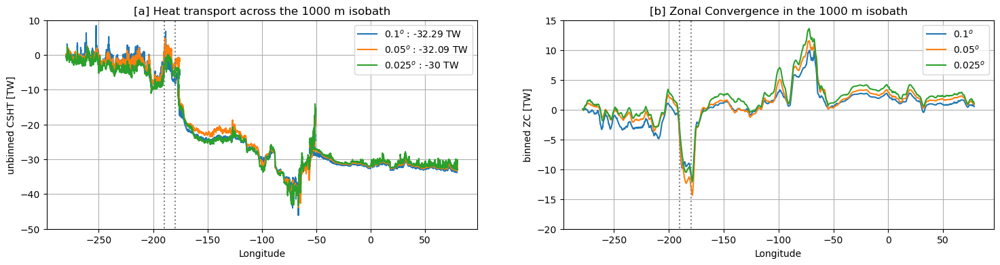

In [149]:
p01_total= np.round(P01_unbinned_HT_mean.sum().values/1e12,2)
p005_total= np.round(P005_unbinned_HT_mean.sum().values/1e12,2)
p0025_total= int(P0025_unbinned_HT_mean.sum().values/1e12)
fig = plt.figure(figsize=(18,4))

plt.subplot(1,2,1)
plt.plot(P01_unbinned_lon,P01_unbinned_HT_mean.cumsum()/1e12,label=r"0.1$^{o}$ : " + str(p01_total) + " TW")
plt.plot(P005_unbinned_lon,P005_unbinned_HT_mean.cumsum()/1e12,color="tab:orange",label=r"0.05$^{o}$ : " + str(p005_total) + " TW")
plt.plot(P0025_unbinned_lon,P0025_unbinned_HT_mean.cumsum()/1e12,color="tab:green",label=r"0.025$^{o}$ : " + str(p0025_total) + " TW")
plt.xlabel('Longitude'); plt.ylabel('unbinned CSHT [TW]'); plt.title('Annual mean (no ZC)')
plt.grid()
plt.plot([-190,-190],[-70,50],':',color='grey')
plt.plot([-180,-180],[-70,50],':',color='grey')
plt.ylim(-50,10)
plt.legend()
plt.title('[a] Heat transport across the 1000 m isobath')

plt.subplot(1,2,2)
plt.plot(P01_binned_lon,P01_binned_ZC_mean.cumsum()*p01_factor/1e12,label=r"0.1$^{o}$")
plt.plot(P005_binned_lon,P005_binned_ZC_mean.cumsum()*p005_factor/1e12,color="tab:orange",label=r"0.05$^{o}$")
plt.plot(P0025_binned_lon,P0025_binned_ZC_mean.cumsum()*p0025_factor/1e12,color="tab:green",label=r"0.025$^{o}$")
plt.xlabel('Longitude'); plt.ylabel('binned ZC [TW]'); plt.title('Annual mean of Zonal convergence')
plt.grid()
plt.plot([-190,-190],[-70,50],':',color='grey')
plt.plot([-180,-180],[-70,50],':',color='grey')
plt.ylim(-20,15)
plt.legend()
plt.title('[b] Zonal Convergence in the 1000 m isobath')
plt.savefig(figdir+'RESCOMP_unbinned_HT_cumsum_Annual_mean.png',dpi=300,bbox_inches='tight')

the plot above is more for sanity check

LEt's now look at the binned values, and along different isobaths

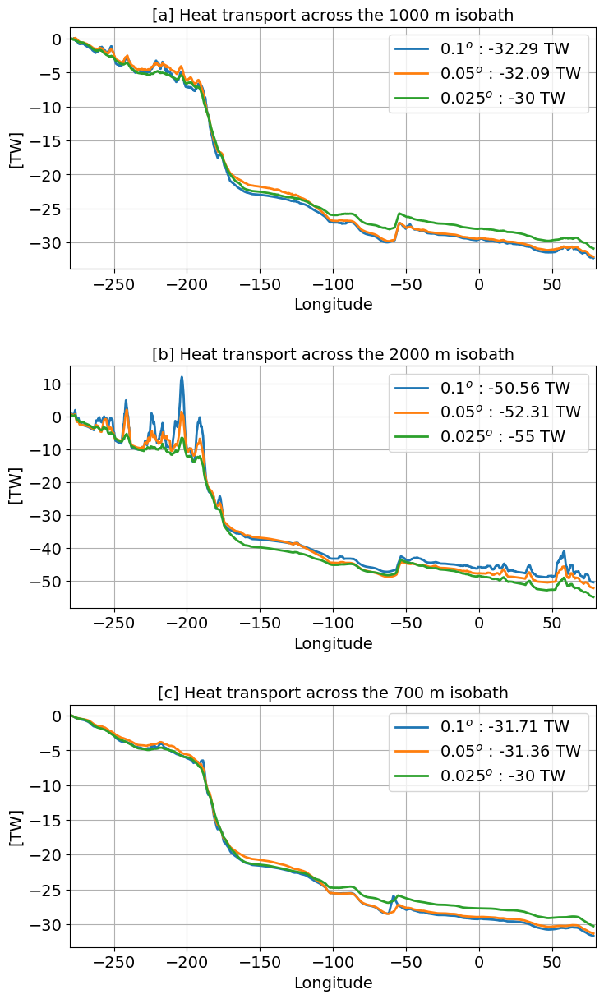

In [150]:
p01_total_700m= np.round(P01_unbinned_HT_mean_700m.sum().values/1e12,2)
p005_total_700m= np.round(P005_unbinned_HT_mean_700m.sum().values/1e12,2)
p0025_total_700m= int(P0025_unbinned_HT_mean_700m.sum().values/1e12)
p01_total_2000m= np.round(P01_unbinned_HT_mean_2000m.sum().values/1e12,2)
p005_total_2000m= np.round(P005_unbinned_HT_mean_2000m.sum().values/1e12,2)
p0025_total_2000m= int(P0025_unbinned_HT_mean_2000m.sum().values/1e12)

#figure
fig = plt.figure(figsize=(8,14))
plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.07, hspace=0.4)

plt.subplot(3,1,1)
#Cumulative sum of heat transports
plt.plot(P01_binned_lon,(P01_binned_CSHT_mean+P01_binned_ZC_mean).cumsum()*p01_factor/1e12,linewidth=2,color="tab:blue",label=r"0.1$^{o}$ : " + str(p01_total) + " TW")
plt.plot(P005_binned_lon,(P005_binned_CSHT_mean+P005_binned_ZC_mean).cumsum()*p005_factor/1e12,linewidth=2,color="tab:orange",label=r"0.05$^{o}$ : " + str(p005_total) + " TW")
plt.plot(P0025_binned_lon,(P0025_binned_CSHT_mean+P0025_binned_ZC_mean).cumsum()*p0025_factor/1e12,linewidth=2,color="tab:green",label=r"0.025$^{o}$ : " + str(p0025_total) + " TW")
plt.xlabel('Longitude',fontsize=14); plt.ylabel('[TW]',fontsize=14)
plt.grid()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.legend(fontsize=14)
plt.xlim(-280,80)
plt.title(r'[a] Heat transport across the 1000 m isobath',fontsize=14)



plt.subplot(3,1,2)
#Cumulative sum of heat transports
plt.plot(P01_binned_lon_2000m,(P01_binned_CSHT_mean_2000m+P01_binned_ZC_mean_2000m).cumsum()*p01_factor_2000m/1e12,linewidth=2,color="tab:blue",label=r"0.1$^{o}$ : " + str(p01_total_2000m) + " TW")
plt.plot(P005_binned_lon_2000m,(P005_binned_CSHT_mean_2000m+P005_binned_ZC_mean_2000m).cumsum()*p005_factor_2000m/1e12,linewidth=2,color="tab:orange",label=r"0.05$^{o}$ : " + str(p005_total_2000m) + " TW")
plt.plot(P0025_binned_lon_2000m,(P0025_binned_CSHT_mean_2000m+P0025_binned_ZC_mean_2000m).cumsum()*p0025_factor_2000m/1e12,linewidth=2,color="tab:green",label=r"0.025$^{o}$ : " + str(p0025_total_2000m) + " TW")
plt.xlabel('Longitude',fontsize=14); plt.ylabel(' [TW]',fontsize=14)
plt.grid()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.legend(fontsize=14)
plt.xlim(-280,80)
plt.title(r'[b] Heat transport across the 2000 m isobath',fontsize=14)


plt.subplot(3,1,3)
#Cumulative sum of heat transports
plt.plot(P01_binned_lon_700m,(P01_binned_CSHT_mean_700m+P01_binned_ZC_mean_700m).cumsum()*p01_factor_700m/1e12,linewidth=2,color="tab:blue",label=r"0.1$^{o}$ : " + str(p01_total_700m) + " TW")
plt.plot(P005_binned_lon_700m,(P005_binned_CSHT_mean_700m+P005_binned_ZC_mean_700m).cumsum()*p005_factor_700m/1e12,linewidth=2,color="tab:orange",label=r"0.05$^{o}$ : " + str(p005_total_700m) + " TW")
plt.plot(P0025_binned_lon_700m,(P0025_binned_CSHT_mean_700m+P0025_binned_ZC_mean_700m).cumsum()*p0025_factor_700m/1e12,linewidth=2,color="tab:green",label=r"0.025$^{o}$ : " + str(p0025_total_700m) + " TW")
plt.xlabel('Longitude',fontsize=14); plt.ylabel('[TW]',fontsize=14)
plt.grid()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.legend(fontsize=14)
plt.xlim(-280,80)
plt.title(r'[c] Heat transport across the 700 m isobath',fontsize=14)
plt.savefig(figdir+'cumsum_along_resolutions_and_isobaths.png',dpi=300,bbox_inches='tight')

The changes in heat transport are very similar and quite small in the 1000 m and 700 m ( and is not an increase with resolution). In the 200 m isobath tho there is an increase in CSHT with resolution, to still not that large. Let's see it in terms of HT from individual water masses

### Part 1 - TS diagram

In [151]:
from gsw import sigma0, sigma1, sigma2, CT_from_pt, SA_from_SP, p_from_z

We will use a TS diagram to separate the CDW upper layer from the AASW. So let's first import the Temperature and Salinity along the isobath

In [152]:
start_time,end_time

('1999-01-01', '2001-01-01')

In [153]:
session_p01_orig = cc.database.create_session('/home/156/wf4500/databases/access/panan01_original_ol01.db')

In [154]:
%%time

############# panan01  #######################

#Importing Potential temperature, Practical Salinity, age along isobath
T01= cc.querying.getvar('panant-01-zstar-ACCESSyr2','thetao',session_p01_orig,frequency='1 monthly',ncfile = '%ocean_month_z%',\
                            start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
T01_2000m = T01.interp(xh=p01_HT_2000m.lon_along_contour.mean('time'), yh=p01_HT_2000m.lat_along_contour.mean('time')).compute()
T01_700m = T01.interp(xh=p01_HT_700m.lon_along_contour.mean('time'), yh=p01_HT_700m.lat_along_contour.mean('time')).compute()
T01 = T01.interp(xh=p01_HT.lon_along_contour.mean('time'), yh=p01_HT.lat_along_contour.mean('time')).compute() #along 1000m isobath


S01= cc.querying.getvar('panant-01-zstar-ACCESSyr2','so',session_p01_orig,frequency='1 monthly',ncfile = '%ocean_month_z%',\
                            start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
S01_700m = S01.interp(xh=p01_HT_700m.lon_along_contour.mean('time'), yh=p01_HT_700m.lat_along_contour.mean('time')).compute()
S01_2000m = S01.interp(xh=p01_HT_2000m.lon_along_contour.mean('time'), yh=p01_HT_2000m.lat_along_contour.mean('time')).compute()
S01 = S01.interp(xh=p01_HT.lon_along_contour.mean('time'), yh=p01_HT.lat_along_contour.mean('time')).compute()


age01= cc.querying.getvar('panant-01-zstar-ACCESSyr2','agessc',session_p01_orig,frequency='1 monthly',ncfile = '%ocean_month_z%',\
                            start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
age01 = age01/age01.max()
age01_700m = age01.interp(xh=p01_HT_700m.lon_along_contour.mean('time'), yh=p01_HT_700m.lat_along_contour.mean('time')).compute()
age01_2000m = age01.interp(xh=p01_HT_2000m.lon_along_contour.mean('time'), yh=p01_HT_2000m.lat_along_contour.mean('time')).compute()
age01 = age01.interp(xh=p01_HT.lon_along_contour.mean('time'), yh=p01_HT.lat_along_contour.mean('time')).compute()
#normalizing age

#Calculating the pressure, required to convert the salinities and temperatures
P01 = p_from_z(((T01*0)-1) * T01.z_l,((T01*0)+1) * T01.yh)
P01_700m = p_from_z(((T01_700m*0)-1) * T01_700m.z_l,((T01_700m*0)+1) * T01_700m.yh)
P01_2000m = p_from_z(((T01_2000m*0)-1) * T01_2000m.z_l,((T01_2000m*0)+1) * T01_2000m.yh)
#Calculating Absolute Salinity from practical salinity
SA01 = SA_from_SP(S01,P01,((S01*0)+1) * S01.xh,((S01*0)+1) * S01.yh)
SA01_700m = SA_from_SP(S01_700m,P01_700m,((S01_700m*0)+1) * S01_700m.xh,((S01_700m*0)+1) * S01_700m.yh)
SA01_2000m = SA_from_SP(S01_2000m,P01_2000m,((S01_2000m*0)+1) * S01_2000m.xh,((S01_2000m*0)+1) * S01_2000m.yh)
#Calculating the conservative temperature from potential temperature
CT01 = CT_from_pt(SA01,T01)
CT01_700m = CT_from_pt(SA01_700m,T01_700m)
CT01_2000m = CT_from_pt(SA01_2000m,T01_2000m)

#finally, calculating sigma1
σ01 = sigma1(SA01,CT01)
σ01_700m = sigma1(SA01_700m,CT01_700m)
σ01_2000m = sigma1(SA01_2000m,CT01_2000m)

############# panan005  #######################

#Importing Potential temperature, Practical Salinity, age along isobath
T005= cc.querying.getvar('panant-005-zstar-ACCESSyr2','thetao',session_p005,frequency='1 monthly',ncfile = '%ocean_month_z%',\
                            start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
T005 = T005.interp(xh=p005_HT.lon_along_contour.mean('time'), yh=p005_HT.lat_along_contour.mean('time')).compute()

S005= cc.querying.getvar('panant-005-zstar-ACCESSyr2','so',session_p005,frequency='1 monthly',ncfile = '%ocean_month_z%',\
                            start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
S005 = S005.interp(xh=p005_HT.lon_along_contour.mean('time'), yh=p005_HT.lat_along_contour.mean('time')).compute()

age005= cc.querying.getvar('panant-005-zstar-ACCESSyr2','agessc',session_p005,frequency='1 monthly',ncfile = '%ocean_month_z%',\
                            start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
age005 = age005.interp(xh=p005_HT.lon_along_contour.mean('time'), yh=p005_HT.lat_along_contour.mean('time')).compute()
#normalizing age
age005 = age005/age005.max()


#Calculating the pressure, required to convert the salinities and temperatures
P005 = p_from_z(((T005*0)-1) * T005.z_l,((T005*0)+1) * T005.yh)
#Calculating Absolute Salinity from practical salinity
SA005 = SA_from_SP(S005,P005,((S005*0)+1) * S005.xh,((S005*0)+1) * S005.yh)
#Calculating the conservative temperature from potential temperature
CT005 = CT_from_pt(SA005,T005)
#finally, calculating sigma1
σ005 = sigma1(SA005,CT005)


This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(

This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(

This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(



CPU times: user 8min 46s, sys: 42.8 s, total: 9min 29s
Wall time: 9min 52s


In [155]:
#creating the contours we want for sigma1 in the TS diagram
Srange  = np.linspace(33,35,105)
Trange  = np.linspace(-2,2,105)
Srangemesh,Trangemesh = np.meshgrid(Srange ,Trange)
σ1_contour = sigma1(Srangemesh,Trangemesh)
σ2_contour = sigma2(Srangemesh,Trangemesh)

Mean temperature along isobath in density layers

In [156]:
%%time

# ############# panan01  #######################

# #Importing Potential temperature, and volume along isobath for averaging - panan01

# #T
# T01_σ= cc.querying.getvar('panan01_yr2000_HTsigma','thetao',session_p01,frequency='1 monthly',ncfile = '%ocean_month_rho2.nc',\
#                             start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
# T01_σ = T01_σ.interp(xh=p01_HT.lon_along_contour.mean('time'), yh=p01_HT.lat_along_contour.mean('time')).compute()

# #Volcello
# V01_σ= cc.querying.getvar('panan01_yr2000_HTsigma','volcello',session_p01,frequency='1 monthly',ncfile = '%ocean_month_rho2.nc',\
#                             start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
# V01_σ = V01_σ.interp(xh=p01_HT.lon_along_contour.mean('time'), yh=p01_HT.lat_along_contour.mean('time')).compute()

# #Averaging the temperature along the contour
# T01_σ = T01_σ.weighted(V01_σ.fillna(0)).mean('contour_index').compute()



# #Importing Potential temperature, and volume along isobath for averaging - panan005

# T005_σ= cc.querying.getvar('panant-005-zstar-ACCESSyr2','thetao',session_p005,frequency='1 monthly',ncfile = '%ocean_month_rho2.nc',\
#                             start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
# T005_σ = T005_σ.interp(xh=p005_HT.lon_along_contour.mean('time'), yh=p005_HT.lat_along_contour.mean('time')).compute()

# V005_σ= cc.querying.getvar('panant-005-zstar-ACCESSyr2','volcello',session_p005,frequency='1 monthly',ncfile = '%ocean_month_rho2.nc',\
#                             start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
# V005_σ = V005_σ.interp(xh=p005_HT.lon_along_contour.mean('time'), yh=p005_HT.lat_along_contour.mean('time')).compute()

# #Averaging the temperature along the contour
# T005_σ = T005_σ.weighted(V005_σ.fillna(0)).mean('contour_index').compute()


# #Importing Potential temperature, and volume along isobath for averaging - panan0025

# T0025_σ= cc.querying.getvar('mom6-panan','thetao',session_p0025,frequency='1 monthly',ncfile = '%ocean_month_rho2.nc',\
#                             start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
# T0025_σ = T0025_σ.interp(xh=p0025_HT.lon_along_contour.mean('time'), yh=p0025_HT.lat_along_contour.mean('time')).compute()

# V0025_σ= cc.querying.getvar('mom6-panan','volcello',session_p0025,frequency='1 monthly',ncfile = '%ocean_month_rho2.nc',\
#                             start_time=start_time,end_time=end_time,chunks={}).sel(time = slice( start_time, end_time)).mean('time')
# V0025_σ = V0025_σ.interp(xh=p0025_HT.lon_along_contour.mean('time'), yh=p0025_HT.lat_along_contour.mean('time')).compute()

# #Averaging the temperature along the contour
# T0025_σ = T0025_σ.weighted(V0025_σ.fillna(0)).mean('contour_index').compute()


# #saving these
# base_savedir = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/'
# T01_σ.to_netcdf(base_savedir + 'panan01_rerun/EKE_along_contour/T_along_isobath_panan01.nc')
# T005_σ.to_netcdf(base_savedir + 'panan005_rerun/EKE_along_contour/T_along_isobath_panan005.nc')
# T0025_σ.to_netcdf(base_savedir + 'panan0025_rerun/EKE_along_contour/T_along_isobath_panan0025.nc')


#loading the variables previously calculated above
T01_σ = xr.open_dataset(base_savedir + 'panan01_rerun/EKE_along_contour/T_along_isobath_panan01.nc')
T005_σ = xr.open_dataset(base_savedir + 'panan005_rerun/EKE_along_contour/T_along_isobath_panan005.nc')
T0025_σ = xr.open_dataset(base_savedir + 'panan0025_rerun/EKE_along_contour/T_along_isobath_panan0025.nc')


T01_σ  =T01_σ.thetao
T005_σ  =T005_σ.thetao
T0025_σ  =T0025_σ.thetao

#

CPU times: user 81 ms, sys: 5.08 ms, total: 86.1 ms
Wall time: 86.4 ms


As you can see we have mostly a progressive decrease in CSHT as we refine the models resolution

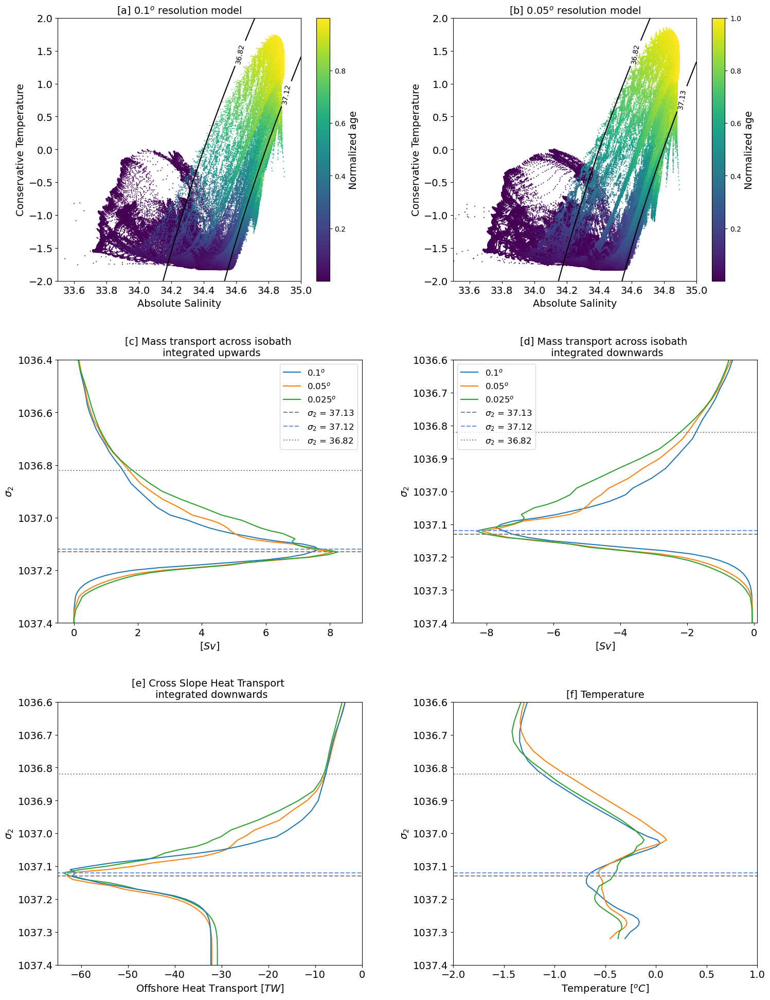

In [157]:
#previous plot
plt.figure(figsize=(17,23))
plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.3, hspace=0.3)

DSW_sigma = 1037.13
DSW_sigma01 = 1037.12
AASW_dense_limit = 1036.82
#mass transport integrated along the shelf in each simulation



#panan01 TS along isobath
plt.subplot(3,2,1)
σ2_levels_01 = [AASW_dense_limit-1000,DSW_sigma01-1000]
plt.scatter(SA01, CT01, c = age01, s=1, marker = '.')
TSage01_CBAR = plt.colorbar()
TSage01_CBAR.set_label('Normalized age', rotation=90, fontsize = 14)
σ2_contourPLOT01 = plt.contour(Srange,Trange,σ2_contour,levels = σ2_levels_01,colors='black')
plt.clabel(σ2_contourPLOT01)
plt.xlim(33.5,35)
plt.title(r'[a] $0.1^o$ resolution model',fontsize=14)
plt.xlabel(r'Absolute Salinity',fontsize=14)
plt.ylabel(r'Conservative Temperature',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)

#panan005 TS along isobath
plt.subplot(3,2,2)
σ2_levels_005 = [AASW_dense_limit-1000,DSW_sigma - 1000]
plt.scatter(SA005, CT005, c = age005, s=1, marker = '.')
TSage005_CBAR = plt.colorbar()
TSage005_CBAR.set_label('Normalized age', rotation=90, fontsize = 14)
σ2_contourPLOT005 = plt.contour(Srange,Trange,σ2_contour,levels = σ2_levels_005,colors='black')
plt.clabel(σ2_contourPLOT005)
plt.xlim(33.5,35)
plt.title(r'[b] $0.05^o$ resolution model',fontsize=14)
plt.xlabel(r'Absolute Salinity',fontsize=14)
plt.ylabel(r'Conservative Temperature',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)


plt.subplot(3,2,3)
#downward integrated mass, classic one for DSW definition
p01_MT.vol_trans_across_contour.sum('contour_index').mean('time')[::-1].cumsum().\
plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
p005_MT.vol_trans_across_contour.sum('contour_index').mean('time')[::-1].cumsum().\
plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
p0025_MT.vol_trans_across_contour.sum('contour_index').mean('time')[::-1].cumsum().\
plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
plt.plot([-9,9],[DSW_sigma,DSW_sigma],color='grey',linestyle='--',label=r"$\sigma_2$ = " + str(np.round(DSW_sigma-1000,2)))
plt.plot([-9,9],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--',label=r"$\sigma_2$ = " + str(np.round(DSW_sigma01-1000,2)))
plt.plot([-9,9],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':',label=r"$\sigma_2$ = " + str(np.round(AASW_dense_limit-1000,2)))
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.4)
plt.xlim(-0.5,9)
plt.xlabel(r'[$Sv$]',fontsize=14)
plt.legend(fontsize=12)
plt.title(r'[c] Mass transport across isobath' + ' \n integrated upwards',fontsize=14)




plt.subplot(3,2,4)

#downward integrated mass until AASW limit
p01_MT.vol_trans_across_contour.sum('contour_index').mean('time').cumsum().\
plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
p005_MT.vol_trans_across_contour.sum('contour_index').mean('time').cumsum().\
plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
p0025_MT.vol_trans_across_contour.sum('contour_index').mean('time').cumsum().\
plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
plt.plot([-9,9],[DSW_sigma,DSW_sigma],color='grey',linestyle='--',label=r"$\sigma_2$ = " + str(np.round(DSW_sigma-1000,2)))
plt.plot([-9,9],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--',label=r"$\sigma_2$ = " + str(np.round(DSW_sigma01-1000,2)))
plt.plot([-9,9],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':',label=r"$\sigma_2$ = " + str(np.round(AASW_dense_limit-1000,2)))
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.6)
plt.xlim(-9,0.1)
plt.xlabel(r'[$Sv$]',fontsize=14)
plt.legend(fontsize=12)
plt.title(r'[d] Mass transport across isobath' + ' \n integrated downwards',fontsize=14)



plt.subplot(3,2,5)
#downward integrated CSHT until CDW limit
(p005_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
(p0025_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
(p01_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-100,100],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.6)
plt.xlim(-65,0)
plt.title(r'[e] Cross Slope Heat Transport' + ' \n integrated downwards',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)


plt.subplot(3,2,6)
T01_σ.rolling(rho2_l=10, center=True).mean().plot(y='rho2_l')
T005_σ.rolling(rho2_l=10, center=True).mean().plot(y='rho2_l')
T0025_σ.rolling(rho2_l=10, center=True).mean().plot(y='rho2_l')
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-100,100],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.6)
plt.xlim(-2,1)
#plt.xlim(-20,20)
plt.title(r'[f] Temperature',fontsize=14)
plt.xlabel(r'Temperature [$^oC$]',fontsize=14)



plt.savefig(figdir+'TSdiagrams_define_watermasses.png',dpi=300,bbox_inches='tight')



We used the TS diagrams with normalized age to select the density treshold between CDW and AASW, as in Morrison et al (2020). The aim was to select most of the warmer, older waters along the isobath.
Now that we know the tresholds that we will use for each water mass, let's see how the heat transport changes in each water mass layer



In plots d,e , I reversed the direction of integration to be downwards, so it focuses on the Southward heat and amss fluxes, which is our main interest here.

It seems to be that the change in total CSHT is mostly due to the increase in DSW export. I.e., notice that by the beggining of the DSW layer in [e], the CSHT between the 3 models is basically the same. They will only present noteciable differences in the DSW layer, which probably has to do with the higher DSW export with resolution.



Comparing those plots, we see that the Southward mass transport (peak in d, ~1037.1) has a progressive and noteciable increase with resolution. However, total southward CSHT change ( peak in e, ~1037.1) is minimal. This negligible increase in CSHT-CDW with resolution, when we have an increase in CDW mass transport, is interesting by itself. Perhaps the the focus of the research should be to explain **why increasing the resolution causes insiginificant changes in the CSHT?**


H1 - Perhaps more mixing (EKE) offshore makes CDW isopycnals deeper, limiting the access of teh warmest waters to the shelf?

In [158]:
# defining density bins to calculate HT in individual water mass space
#lets group the MT and HT by different bins
densitybins = [1015,1036.82,1037.125,1037.5] #separating by water mass
#binning heat transports over the 1000m isobath
p01_HT_largebins = p01_HT.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p005_HT_largebins = p005_HT.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p0025_HT_largebins = p0025_HT.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
#binning heat transports over the 700m isobath
p01_HT_largebins_700m = p01_HT_700m.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p005_HT_largebins_700m = p005_HT_700m.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p0025_HT_largebins_700m = p0025_HT_700m.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
#binning heat transports over the 2000m isobath
p01_HT_largebins_2000m = p01_HT_2000m.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p005_HT_largebins_2000m = p005_HT_2000m.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p0025_HT_largebins_2000m = p0025_HT_2000m.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})


densitybins_mid = (np.array(densitybins[:-1]) + np.array(densitybins[1:]))/2
densitybins_mid[0] = 1036.6


widths_bars= np.linspace(0.1,0.03,np.shape(densitybins)[0]-1)
widths_bars[-1] = 0.1
widths_bars = (widths_bars*0) +0.2

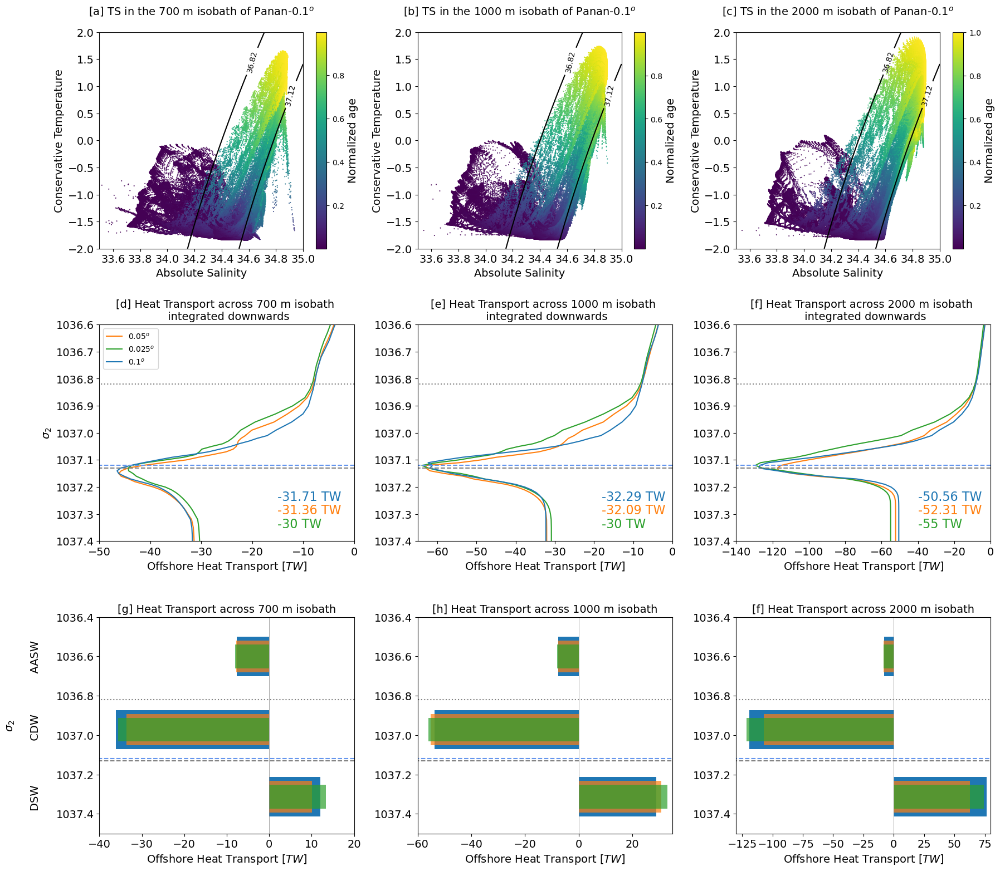

In [161]:
plt.figure(figsize=(20,18))
plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.25, hspace=0.35)

DSW_sigma = 1037.13
DSW_sigma01 = 1037.12
AASW_dense_limit = 1036.82
#mass transport integrated along the shelf in each simulation

#panan01 TS along 700 m isobath
plt.subplot(3,3,1)
σ2_levels_01_700m = [AASW_dense_limit-1000,DSW_sigma01-1000]
plt.scatter(SA01_700m , CT01_700m , c = age01_700m, s=1, marker = '.')
TSage01_CBAR_700m  = plt.colorbar()
TSage01_CBAR_700m .set_label('Normalized age', rotation=90, fontsize = 14)
σ2_contourPLOT01_700m  = plt.contour(Srange,Trange,σ2_contour,levels = σ2_levels_01_700m ,colors='black')
plt.clabel(σ2_contourPLOT01_700m )
plt.xlim(33.5,35)
plt.title(r'[a] TS in the 700 m isobath of Panan-$0.1^o$' + '\n',fontsize=14)
plt.xlabel(r'Absolute Salinity',fontsize=14)
plt.ylabel(r'Conservative Temperature',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)

#panan01 TS along 1000 m isobath
plt.subplot(3,3,2)
σ2_levels_01 = [AASW_dense_limit-1000,DSW_sigma01-1000]
plt.scatter(SA01, CT01, c = age01, s=1, marker = '.')
TSage01_CBAR = plt.colorbar()
TSage01_CBAR.set_label('Normalized age', rotation=90, fontsize = 14)
σ2_contourPLOT01 = plt.contour(Srange,Trange,σ2_contour,levels = σ2_levels_01,colors='black')
plt.clabel(σ2_contourPLOT01)
plt.xlim(33.5,35)
plt.title(r'[b] TS in the 1000 m isobath of Panan-$0.1^o$' + '\n',fontsize=14)
plt.xlabel(r'Absolute Salinity',fontsize=14)
plt.ylabel(r'Conservative Temperature',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)

plt.subplot(3,3,3)
σ2_levels_01_2000m = [AASW_dense_limit-1000,DSW_sigma01-1000]
plt.scatter(SA01_2000m, CT01_2000m, c = age01_2000m, s=1, marker = '.')
TSage01_CBAR_2000m = plt.colorbar()
TSage01_CBAR_2000m.set_label('Normalized age', rotation=90, fontsize = 14)
σ2_contourPLOT01_2000m = plt.contour(Srange,Trange,σ2_contour,levels = σ2_levels_01_2000m,colors='black')
plt.clabel(σ2_contourPLOT01_2000m)
plt.xlim(33.5,35)
plt.title(r'[c] TS in the 2000 m isobath of Panan-$0.1^o$' + '\n',fontsize=14)
plt.xlabel(r'Absolute Salinity',fontsize=14)
plt.ylabel(r'Conservative Temperature',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)

plt.subplot(3,3,4)
#downward integrated CSHT until CDW limit
(p005_HT_700m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
(p0025_HT_700m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
(p01_HT_700m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-100,100],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.text(-15,1037.25,str(p01_total_700m) + " TW",color='tab:blue' ,fontsize=16)
plt.text(-15,1037.3,str(p005_total_700m) + " TW",color='tab:orange' ,fontsize=16)
plt.text(-15,1037.35,str(p0025_total_700m) + " TW",color='tab:green' ,fontsize=16)
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.6)
plt.xlim(-50,0)
plt.legend()
plt.title(r'[d] Heat Transport across 700 m isobath' + ' \n integrated downwards',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)


plt.subplot(3,3,5)
#downward integrated CSHT until CDW limit
(p005_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
(p0025_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
(p01_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-100,100],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.text(-18,1037.25,str(p01_total) + " TW",color='tab:blue' ,fontsize=16)
plt.text(-18,1037.3,str(p005_total) + " TW",color='tab:orange' ,fontsize=16)
plt.text(-18,1037.35,str(p0025_total) + " TW",color='tab:green' ,fontsize=16)
plt.ylabel(r'',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.6)
plt.xlim(-65,0)
plt.title(r'[e] Heat Transport across 1000 m isobath' + ' \n integrated downwards',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)


plt.subplot(3,3,6)
#downward integrated CSHT until CDW limit
(p005_HT_2000m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
(p0025_HT_2000m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
(p01_HT_2000m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
plt.plot([-300,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-300,100],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-300,100],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.text(-40,1037.25,str(p01_total_2000m) + " TW",color='tab:blue' ,fontsize=16)
plt.text(-40,1037.3,str(p005_total_2000m) + " TW",color='tab:orange' ,fontsize=16)
plt.text(-40,1037.35,str(p0025_total_2000m) + " TW",color='tab:green' ,fontsize=16)
plt.ylabel(r'',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.6)
plt.xlim(-140,0)
plt.title(r'[f] Heat Transport across 2000 m isobath' + ' \n integrated downwards',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)

#    Water mass bins!
plt.subplot(3,3,7)
plt.barh(densitybins_mid,p01_HT_largebins_700m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=widths_bars,label=r"0.1$^{o}$ ",color='tab:blue')
plt.barh(densitybins_mid,p005_HT_largebins_700m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=0.8*widths_bars,label=r"0.05$^{o}$ ",color='tab:orange',alpha=0.7)
plt.barh(densitybins_mid,p0025_HT_largebins_700m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=0.6*widths_bars,label=r"0.025$^{o}$ ",color='tab:green',alpha=0.7)
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-100,100],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.plot([0,0],[999,1040],color='grey',linewidth=0.5)
plt.ylabel(r'$\sigma_2$'+ '\n \n DSW             CDW            AASW \n',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.5,1036.4)
plt.xlim(-40,20)
plt.title(r'[g] Heat Transport across 700 m isobath',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)

plt.subplot(3,3,8)
plt.barh(densitybins_mid,p01_HT_largebins.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=widths_bars,label=r"0.1$^{o}$ ",color='tab:blue')
plt.barh(densitybins_mid,p005_HT_largebins.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=0.8*widths_bars,label=r"0.05$^{o}$ ",color='tab:orange',alpha=0.7)
plt.barh(densitybins_mid,p0025_HT_largebins.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=0.6*widths_bars,label=r"0.025$^{o}$ ",color='tab:green',alpha=0.7)
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-100,100],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.plot([0,0],[999,1040],color='grey',linewidth=0.5)
plt.ylabel(r'',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.5,1036.4)
plt.xlim(-60,35)
plt.title(r'[h] Heat Transport across 1000 m isobath',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)


plt.subplot(3,3,9)
plt.barh(densitybins_mid,p01_HT_largebins_2000m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=widths_bars,label=r"0.1$^{o}$ ",color='tab:blue')
plt.barh(densitybins_mid,p005_HT_largebins_2000m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=0.8*widths_bars,label=r"0.05$^{o}$ ",color='tab:orange',alpha=0.7)
plt.barh(densitybins_mid,p0025_HT_largebins_2000m.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=0.6*widths_bars,label=r"0.025$^{o}$ ",color='tab:green',alpha=0.7)
plt.plot([-300,300],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-300,300],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-300,300],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.plot([0,0],[999,1040],color='grey',linewidth=0.5)
plt.ylabel(r'',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.5,1036.4)
plt.xlim(-130,80)
plt.title(r'[f] Heat Transport across 2000 m isobath',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)


plt.savefig(figdir+'TSdiagrams_define_watermasses_in_three_isobaths.png',dpi=300,bbox_inches='tight')

[a-c] - TS diagrams dont change that much between isobaths except by much colder and denser DSW in the 700 m isobath, so I tink I can priarily maintain the same density definitions for simplicity

[d-f] - We get a decrease in total CSHT with resolution in the isobaths shallower than 1000m, but the opposite in the 2000 m isobath

[e-f] - When we separate the CSHT per water mass we can see that the results are not very clean tho. AASW seem to not change CSHT with resolution. DSW and CDW do change the heat transport, but the change is relatively small compared to their mean values + they are directionally different in each isobath


What about the seasonal variability in the total heat transport... does it change?

Text(0.5, 1.0, '[c] Heat transport across the 2000 m isobath')

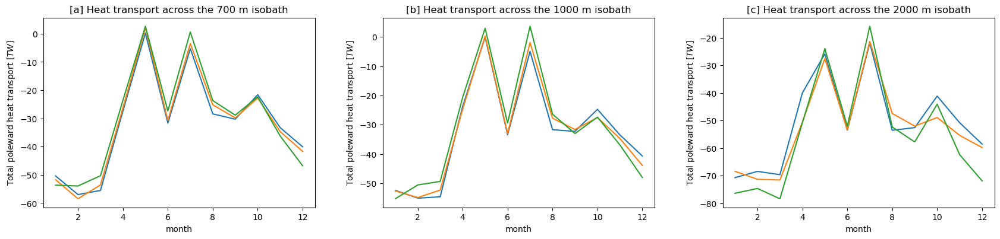

In [174]:
plt.figure(figsize=(20,4))
plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.25, hspace=0.35)

plt.subplot(1,3,1)
(1e-12 * p01_HT_700m.unbinned_heat_transp_across_contour.sum('contour_index').sum('rho2_l').groupby('time.month').mean()).plot()
(1e-12 * p005_HT_700m.unbinned_heat_transp_across_contour.sum('contour_index').sum('rho2_l').groupby('time.month').mean()).plot()
(1e-12 * p0025_HT_700m.unbinned_heat_transp_across_contour.sum('contour_index').sum('rho2_l').groupby('time.month').mean()).plot()
plt.ylabel('Total poleward heat transport [$TW$]')
plt.title('[a] Heat transport across the 700 m isobath')

plt.subplot(1,3,2)
(1e-12 * p01_HT.unbinned_heat_transp_across_contour.sum('contour_index').sum('rho2_l').groupby('time.month').mean()).plot()
(1e-12 * p005_HT.unbinned_heat_transp_across_contour.sum('contour_index').sum('rho2_l').groupby('time.month').mean()).plot()
(1e-12 * p0025_HT.unbinned_heat_transp_across_contour.sum('contour_index').sum('rho2_l').groupby('time.month').mean()).plot()
plt.ylabel('Total poleward heat transport [$TW$]')
plt.title('[b] Heat transport across the 1000 m isobath')


plt.subplot(1,3,3)
(1e-12 * p01_HT_2000m.unbinned_heat_transp_across_contour.sum('contour_index').sum('rho2_l').groupby('time.month').mean()).plot()
(1e-12 * p005_HT_2000m.unbinned_heat_transp_across_contour.sum('contour_index').sum('rho2_l').groupby('time.month').mean()).plot()
(1e-12 * p0025_HT_2000m.unbinned_heat_transp_across_contour.sum('contour_index').sum('rho2_l').groupby('time.month').mean()).plot()
plt.ylabel('Total poleward heat transport [$TW$]')
plt.title('[c] Heat transport across the 2000 m isobath')

We do have some seasonal changes but they are very smalll too.

### EKE and Isobath displacement

It might be useful to check up by by which isobath and or latitude we see EKE increasing in the model. Just to check up if that increase reaches the 1000 m isobath

In [31]:
EKE_saveddir = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/'

#panan01
EKE_01_surf = xr.open_dataset(EKE_saveddir+ 'panan01_rerun/EKE_along_contour/EKE_xyt_panan01.nc')\
.__xarray_dataarray_variable__.isel(time=slice(0,1095))
EKE_01_surf_mean = EKE_01_surf.mean('time').compute()

In [32]:
del EKE_01_surf
#panan0025
EKE_005_surf = xr.open_dataset(EKE_saveddir+ 'panan005_rerun/EKE_along_contour/EKE_xyt_panan005.nc')\
.__xarray_dataarray_variable__.isel(time=slice(0,1095))
EKE_005_surf_mean = EKE_005_surf.isel(time=slice(0,1095)).mean('time').compute()

In [33]:
del EKE_005_surf
#panan0025 - This has to be updated with new year 2001 run
EKE_0025_surf = xr.open_mfdataset(EKE_saveddir+ 'panan0025_rerun/EKE_along_contour/EKE_xyt_*.nc').__xarray_dataarray_variable__
EKE_0025_surf_mean = EKE_0025_surf.mean('time').compute()

In [34]:
del EKE_0025_surf

In [35]:

session_panan0025_current = cc.database.create_session('/home/156/wf4500/databases/access/panan0025_final_ol01.db')

In [36]:
from xhistogram.xarray import histogram
#lets import the bottom topography so we can bin the data along the isobaths, and change coordinates to be on xq points
areacello_bu005 = cc.querying.getvar('panant-005-zstar-ACCESSyr2','areacello_bu',session_p005,n=1).compute()
areacello_005 = cc.querying.getvar('panant-005-zstar-ACCESSyr2','areacello',session_p005,n=1).compute()
areacello_cv005 = cc.querying.getvar('panant-005-zstar-ACCESSyr2','areacello_cv',session_p005,n=1).compute()
depth005 = cc.querying.getvar('panant-005-zstar-ACCESSyr2','deptho',session_p005,n=1).compute()
depth005_281 = depth005.isel(xh=-1); depth005_281['xh'] = depth005.xh.isel(xh=0) - 0.05 #creating halo edges west
depth005_81 = depth005.isel(xh=0); depth005_81['xh'] = depth005.xh.isel(xh=-1) + 0.05  #creating halo edges east
depth005_qpoint = xr.concat((depth005_281,depth005,depth005_81),dim='xh') #creating a halo
depth005_qpoint  = depth005_qpoint.interp(xh=EKE_005_surf_mean.xq,yh=EKE_005_surf_mean.yq).drop(('xh','yh')) #interpolatinh matrix with halos to avoind nan on the edges
depth005_cv = depth005.interp(yh = areacello_cv005.yq).drop('yh')

#Panan01 'panant-01-zstar-ACCESSyr2',session_p01_orig
areacello_bu01 = cc.querying.getvar('panant-01-zstar-ACCESSyr2','areacello_bu',session_p01_orig,n=1).compute()
areacello_01 = cc.querying.getvar('panant-01-zstar-ACCESSyr2','areacello',session_p01_orig,n=1).compute()
areacello_cv01 = cc.querying.getvar('panant-01-zstar-ACCESSyr2','areacello_cv',session_p01_orig,n=1).compute()
depth01 = cc.querying.getvar('panant-01-zstar-ACCESSyr2','deptho',session_p01_orig,n=1).compute().compute()
depth01_281 = depth01.isel(xh=-1); depth01_281['xh'] = depth01.xh.isel(xh=0) - 0.1 #creating halo edges west
depth01_81 = depth01.isel(xh=0); depth01_81['xh'] = depth01.xh.isel(xh=-1) + 0.1  #creating halo edges east
depth01_qpoint = xr.concat((depth01_281,depth01,depth01_81),dim='xh') #creating a halo
depth01_qpoint  = depth01_qpoint.interp(xh=EKE_01_surf_mean.xq,yh=EKE_01_surf_mean.yq).drop(('xh','yh')) #interpolatinh matrix with halos to avoind nan on the edges
depth01_cv = depth01.interp(yh = areacello_cv01.yq).drop('yh')




#Panan0025
areacello_bu0025 = cc.querying.getvar('panant-0025-zstar-ACCESSyr2','areacello_bu',session_panan0025_current ,n=1).compute()
areacello_0025 = cc.querying.getvar('panant-0025-zstar-ACCESSyr2','areacello',session_panan0025_current ,n=1).compute()
areacello_cv0025 = cc.querying.getvar('panant-0025-zstar-ACCESSyr2','areacello_cv',session_panan0025_current ,n=1).compute()
depth0025 = cc.querying.getvar('panant-0025-zstar-ACCESSyr2','deptho',session_panan0025_current ,n=1).compute()
depth0025_281 = depth0025.isel(xh=-1); depth0025_281['xh'] = depth0025.xh.isel(xh=0) - 0.025 #creating halo edges west
depth0025_81 = depth0025.isel(xh=0); depth0025_81['xh'] = depth0025.xh.isel(xh=-1) + 0.025  #creating halo edges east
depth0025_qpoint = xr.concat((depth0025_281,depth0025,depth0025_81),dim='xh') #creating a halo
depth0025_qpoint  = depth0025_qpoint.interp(xh=EKE_0025_surf_mean.xq,yh=EKE_0025_surf_mean.yq).drop(('xh','yh'))
depth0025_cv = depth0025.interp(yh = areacello_cv0025.yq).drop('yh')





  depth005_qpoint  = depth005_qpoint.interp(xh=EKE_005_surf_mean.xq,yh=EKE_005_surf_mean.yq).drop(('xh','yh')) #interpolatinh matrix with halos to avoind nan on the edges

  depth005_cv = depth005.interp(yh = areacello_cv005.yq).drop('yh')

  depth01_qpoint  = depth01_qpoint.interp(xh=EKE_01_surf_mean.xq,yh=EKE_01_surf_mean.yq).drop(('xh','yh')) #interpolatinh matrix with halos to avoind nan on the edges

  depth01_cv = depth01.interp(yh = areacello_cv01.yq).drop('yh')

  depth0025_qpoint  = depth0025_qpoint.interp(xh=EKE_0025_surf_mean.xq,yh=EKE_0025_surf_mean.yq).drop(('xh','yh'))

  depth0025_cv = depth0025.interp(yh = areacello_cv0025.yq).drop('yh')



In [37]:
# Doing a version without the Antarctic peninsula for the density too
#panan01
σ01_montlhy_mean_noAP = σ01_montlhy_mean.where(σ01_montlhy_mean.xh<-90)
σ01_montlhy_mean_noAP = σ01_montlhy_mean.where(σ01_montlhy_mean.xh>-50).fillna(0) + σ01_montlhy_mean_noAP.fillna(0)
σ01_montlhy_mean_noAP = σ01_montlhy_mean_noAP.where(σ01_montlhy_mean_noAP!=0)

#panan005
σ005_montlhy_mean_noAP = σ005_montlhy_mean.where(σ005_montlhy_mean.xh<-90)
σ005_montlhy_mean_noAP = σ005_montlhy_mean.where(σ005_montlhy_mean.xh>-50).fillna(0) + σ005_montlhy_mean_noAP.fillna(0)
σ005_montlhy_mean_noAP = σ005_montlhy_mean_noAP.where(σ005_montlhy_mean_noAP!=0)

#panan0025
σ0025_montlhy_mean_noAP = σ0025_montlhy_mean.where(σ0025_montlhy_mean.xh<-90)
σ0025_montlhy_mean_noAP = σ0025_montlhy_mean.where(σ0025_montlhy_mean.xh>-50).fillna(0) + σ0025_montlhy_mean_noAP.fillna(0)
σ0025_montlhy_mean_noAP = σ0025_montlhy_mean_noAP.where(σ0025_montlhy_mean_noAP!=0)

Text(0.5, 1.0, 'Without Antarctic Peninsula')

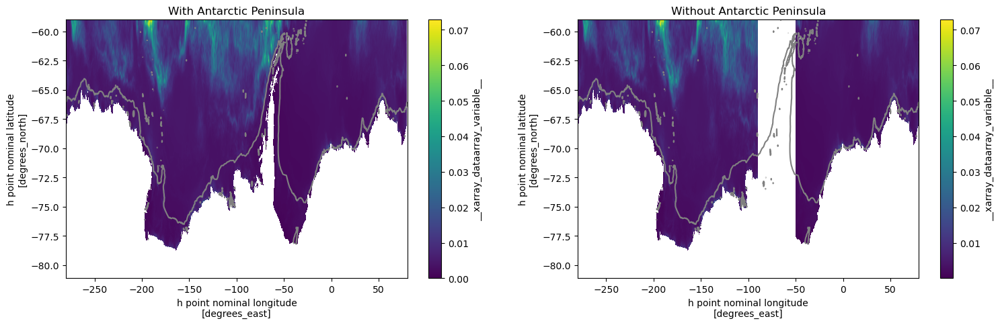

In [38]:
lat_slice_2=slice(-83,-59)

plt.figure(figsize=(18,5))

plt.subplot(1,2,1)
EKE_005_surf_mean.sel(yq=lat_slice_2).plot()
depth005.plot.contour(levels=[1000,],colors=['grey'])
plt.title('With Antarctic Peninsula')


plt.subplot(1,2,2)

EKE_01_surf_mean_noAP = EKE_01_surf_mean.where(EKE_01_surf_mean.xq<-90)
EKE_01_surf_mean_noAP = EKE_01_surf_mean.where(EKE_01_surf_mean.xq>-50).fillna(0) + EKE_01_surf_mean_noAP.fillna(0)
EKE_01_surf_mean_noAP = EKE_01_surf_mean_noAP.where(EKE_01_surf_mean_noAP!=0)

EKE_005_surf_mean_noAP = EKE_005_surf_mean.where(EKE_005_surf_mean.xq<-90)
EKE_005_surf_mean_noAP = EKE_005_surf_mean.where(EKE_005_surf_mean.xq>-50).fillna(0) + EKE_005_surf_mean_noAP.fillna(0)
EKE_005_surf_mean_noAP = EKE_005_surf_mean_noAP.where(EKE_005_surf_mean_noAP!=0)


EKE_0025_surf_mean_noAP = EKE_0025_surf_mean.where(EKE_0025_surf_mean.xq<-90)
EKE_0025_surf_mean_noAP = EKE_0025_surf_mean.where(EKE_0025_surf_mean.xq>-50).fillna(0) + EKE_0025_surf_mean_noAP.fillna(0)
EKE_0025_surf_mean_noAP = EKE_0025_surf_mean_noAP.where(EKE_0025_surf_mean_noAP!=0)


EKE_005_surf_mean_noAP.sel(yq=lat_slice_2).plot()
depth005.plot.contour(levels=[1000,],colors=['grey'])
plt.title('Without Antarctic Peninsula')

Lets also import the temperature to see a little the temperature anomalies

In [39]:
lat_slice  = slice(-83,-59)

#lets import the the density to see how it changes along isobaths
T01_montlhy_mean = cc.querying.getvar('panant-01-zstar-ACCESSyr2','thetao',session_p01_orig,frequency='1 monthly',ncfile = '%ocean_month_z.nc',\
                            start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yh=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()
T005_montlhy_mean = cc.querying.getvar('panant-005-zstar-ACCESSyr2','thetao',session_p005,frequency='1 monthly',ncfile = '%ocean_month_z.nc',\
                            start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yh=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()
T0025_montlhy_mean = cc.querying.getvar('panant-0025-zstar-ACCESSyr2','thetao',session_panan0025_current,frequency='1 monthly',ncfile = '%ocean_month_z.nc',\
                            start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yh=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()


Also importing meridional velocities $V$ to show the direction of flow

In [40]:
lat_slice  = slice(-83,-59)

#lets import the the density to see how it changes along isobaths
V01_montlhy_mean = cc.querying.getvar('panant-01-zstar-ACCESSyr2','vo',session_p01_orig,frequency='1 monthly',ncfile = '%ocean_month_z.nc',\
                            start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yq=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()
V005_montlhy_mean = cc.querying.getvar('panant-005-zstar-ACCESSyr2','vo',session_p005,frequency='1 monthly',ncfile = '%ocean_month_z.nc',\
                            start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yq=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()
V0025_montlhy_mean = cc.querying.getvar('panant-0025-zstar-ACCESSyr2','vo',session_panan0025_current,frequency='1 monthly',ncfile = '%ocean_month_z.nc',\
                            start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yq=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()


And $vmo$ for the overturning

In [41]:
#lets import the the density to see how it changes along isobaths
Vmo01_montlhy_mean = cc.querying.getvar('panant-01-zstar-ACCESSyr2','vmo',session_p01_orig,frequency='1 monthly',ncfile = '%ocean_month_rho2.nc',\
                            start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yq=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()
Vmo005_montlhy_mean = cc.querying.getvar('panant-005-zstar-ACCESSyr2','vmo',session_p005,frequency='1 monthly',ncfile = '%ocean_month_rho2.nc',\
                            start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yq=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()
Vmo0025_montlhy_mean = cc.querying.getvar('panant-0025-zstar-ACCESSyr2','vmo',session_panan0025_current,frequency='1 monthly',ncfile = '%ocean_month_rho2.nc',\
                            start_time=start_time,end_time=end_time,chunks={'xh':'400gb'}).sel(yq=lat_slice).sel(time = slice( start_time, end_time)).mean('time').compute()


In [42]:
# Doing a version without the Antarctic peninsula for the density too
#panan01
T01_montlhy_mean_noAP = T01_montlhy_mean.where(T01_montlhy_mean.xh<-90)
T01_montlhy_mean_noAP = T01_montlhy_mean.where(T01_montlhy_mean.xh>-50).fillna(0) + T01_montlhy_mean_noAP.fillna(0)
T01_montlhy_mean_noAP = T01_montlhy_mean_noAP.where(T01_montlhy_mean_noAP!=0)

#panan005
T005_montlhy_mean_noAP = T005_montlhy_mean.where(T005_montlhy_mean.xh<-90)
T005_montlhy_mean_noAP = T005_montlhy_mean.where(T005_montlhy_mean.xh>-50).fillna(0) + T005_montlhy_mean_noAP.fillna(0)
T005_montlhy_mean_noAP = T005_montlhy_mean_noAP.where(T005_montlhy_mean_noAP!=0)

#panan0025
T0025_montlhy_mean_noAP = T0025_montlhy_mean.where(T0025_montlhy_mean.xh<-90)
T0025_montlhy_mean_noAP = T0025_montlhy_mean.where(T0025_montlhy_mean.xh>-50).fillna(0) + T0025_montlhy_mean_noAP.fillna(0)
T0025_montlhy_mean_noAP = T0025_montlhy_mean_noAP.where(T0025_montlhy_mean_noAP!=0)

In [43]:
isobath_bins=np.arange(0,3000,50)

In [44]:
#bin-averaging the EKE along the isobath
EKE_01_along_isobath = histogram(depth01_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (EKE_01_surf_mean * areacello_bu01).sel(yq=lat_slice_2).fillna(0)).mean('xq') / \
histogram(depth01_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (areacello_bu01.sel(yq=lat_slice_2)).fillna(0)).mean('xq') 

#bin-averaging the EKE along the isobath
EKE_005_along_isobath = histogram(depth005_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (EKE_005_surf_mean * areacello_bu005).sel(yq=lat_slice_2).fillna(0)).mean('xq') / \
histogram(depth005_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (areacello_bu005.sel(yq=lat_slice_2)).fillna(0)).mean('xq') 



#Without the peninsula

EKE_01_along_isobath_noAP = histogram(depth01_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (EKE_01_surf_mean_noAP * areacello_bu01).sel(yq=lat_slice_2).fillna(0)).mean('xq') / \
histogram(depth01_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = ((EKE_01_surf_mean_noAP *0+1) * areacello_bu01.sel(yq=lat_slice_2)).fillna(0)).mean('xq') 

#bin-averaging the EKE along the isobath
EKE_005_along_isobath_noAP = histogram(depth005_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                           weights = (EKE_005_surf_mean_noAP * areacello_bu005).sel(yq=lat_slice_2).fillna(0)).mean('xq') / \
histogram(depth005_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = ((EKE_005_surf_mean_noAP *0+1) * areacello_bu005.sel(yq=lat_slice_2)).fillna(0)).mean('xq')


In [45]:
#bin-averaging the EKE along the isobath
EKE_0025_along_isobath = histogram(depth0025_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (EKE_0025_surf_mean * areacello_bu0025).sel(yq=lat_slice_2).fillna(0)).mean('xq') / \
histogram(depth0025_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (areacello_bu0025.sel(yq=lat_slice_2)).fillna(0)).mean('xq') 




#bin-averaging the EKE along the isobath
EKE_0025_along_isobath_noAP = histogram(depth0025_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (EKE_0025_surf_mean_noAP * areacello_bu0025).sel(yq=lat_slice_2).fillna(0)).mean('xq') / \
histogram(depth0025_qpoint.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = ((EKE_0025_surf_mean_noAP *0+1) * areacello_bu0025.sel(yq=lat_slice_2)).fillna(0)).mean('xq') 

In [46]:

# we will do 2 binnings, one with the Antarctic Peninsula and one without it


#panan01
σ_01_along_isobath = histogram(depth01.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (σ01_montlhy_mean * areacello_01).sel(yh=lat_slice_2).fillna(0)).mean('xh') / \
histogram(depth01.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (areacello_01.sel(yh=lat_slice_2)).fillna(0)).mean('xh') 
σ_01_along_isobath['z_l'] = σ01_montlhy_mean.z_l
σ_01_along_isobath = σ_01_along_isobath.where(σ_01_along_isobath>=1000)


#panan005
σ_005_along_isobath = histogram(depth005.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (σ005_montlhy_mean * areacello_005).sel(yh=lat_slice_2).fillna(0)).mean('xh') / \
histogram(depth005.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (areacello_005.sel(yh=lat_slice_2)).fillna(0)).mean('xh') 
σ_005_along_isobath['z_l'] = σ005_montlhy_mean.z_l
σ_005_along_isobath = σ_005_along_isobath.where(σ_005_along_isobath>=1000)


#panan0025
σ_0025_along_isobath = histogram(depth0025.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (σ0025_montlhy_mean * areacello_0025).sel(yh=lat_slice_2).fillna(0)).mean('xh') / \
histogram(depth0025.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (areacello_0025.sel(yh=lat_slice_2)).fillna(0)).mean('xh') 
σ_0025_along_isobath['z_l'] = σ0025_montlhy_mean.z_l
σ_0025_along_isobath = σ_0025_along_isobath.where(σ_0025_along_isobath>=1000)

now for $V$ and $T$

In [47]:
#same for temperatures too now
# we will do 2 binnings, one with the Antarctic Peninsula and one without it

#panan01
V_01_along_isobath = histogram(depth01_cv.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (V01_montlhy_mean * areacello_cv01).sel(yq=lat_slice_2).fillna(0)).mean('xh') / \
histogram(depth01_cv.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (areacello_cv01.sel(yq=lat_slice_2)).fillna(0)).mean('xh') 
V_01_along_isobath['z_l'] = V01_montlhy_mean.z_l
V_01_along_isobath = V_01_along_isobath.where(σ_01_along_isobath>0) #masking NaN bins

#panan005
V_005_along_isobath = histogram(depth005_cv.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (V005_montlhy_mean * areacello_cv005).sel(yq=lat_slice_2).fillna(0)).mean('xh') / \
histogram(depth005_cv.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (areacello_cv005.sel(yq=lat_slice_2)).fillna(0)).mean('xh') 
V_005_along_isobath['z_l'] = V005_montlhy_mean.z_l
V_005_along_isobath = V_005_along_isobath.where(σ_005_along_isobath>0) #masking NaN bins


#panan0025
V_0025_along_isobath = histogram(depth0025_cv.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (V0025_montlhy_mean * areacello_cv0025).sel(yq=lat_slice_2).fillna(0)).mean('xh') / \
histogram(depth0025_cv.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (areacello_cv0025.sel(yq=lat_slice_2)).fillna(0)).mean('xh') 
V_0025_along_isobath['z_l'] = V0025_montlhy_mean.z_l
V_0025_along_isobath = V_0025_along_isobath.where(σ_0025_along_isobath>0) #masking NaN bins





$vmo$

In [48]:
#  Calculating the overturning on this siobath space
Vmo_01_along_isobath = histogram(depth01_cv.sel(yq=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yq'],
                          weights = (Vmo01_montlhy_mean).sel(yq=lat_slice_2).fillna(0)).mean('xh')

Vmo_01_along_isobath['rho2_l'] = Vmo01_montlhy_mean.rho2_l
Overturning_01_along_isobath = (1e-6*Vmo_01_along_isobath[::-1,:].cumsum('rho2_l')[::-1,:])



In [49]:
Vmo_01_along_isobathZ = σ_01_along_isobath.copy()*0
for n in range(58):
    Sigma_fz_thisbin = σ_01_along_isobath.isel(deptho_bin=n)
    Sigma_fz_thisbin = Sigma_fz_thisbin.where(Sigma_fz_thisbin>1020)
    mass_fsigma_thisbin = Vmo_01_along_isobath.isel(deptho_bin=n)
    Sigma_fz_thisbin_edges = Sigma_fz_thisbin.rolling(z_l=2).mean() #density edges fo z bins
    Sigma_fz_thisbin_edges[0] = 0
    Sigma_fz_thisbin_edges = Sigma_fz_thisbin_edges.dropna('z_l')
    z_thisbin = Sigma_fz_thisbin_edges.z_l
    Sigma_fz_thisbin_edges = np.append(Sigma_fz_thisbin_edges,1080)
    mass_z = mass_fsigma_thisbin.groupby_bins('rho2_l',bins =Sigma_fz_thisbin_edges).sum().rename({'rho2_l_bins':'z_l'})
    mass_z['z_l']=z_thisbin.values
    Vmo_01_along_isobathZ[:z_thisbin.size,n]=mass_z.values
Overturning_01_along_isobathZ = Vmo_01_along_isobathZ[::-1,:].cumsum('z_l')[::-1,:]*1e-6



(0.0, 2000.0)

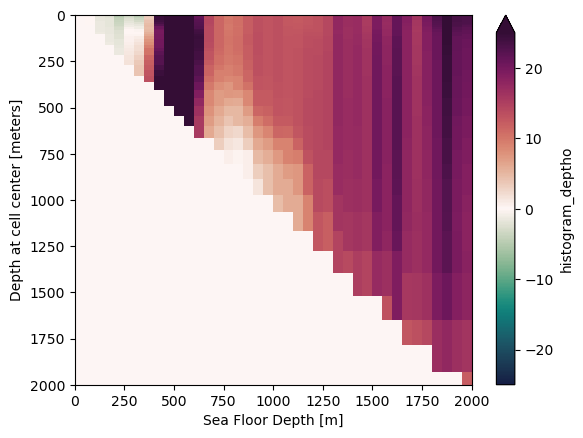

In [50]:
Overturning_01_along_isobathZ.plot.pcolormesh(y='z_l',vmin=-25,vmax=25,cmap=cm.cm.curl)
plt.ylim(2000,0); plt.xlim(0,2000)

In [51]:
#same for temperatures too now
# we will do 2 binnings, one with the Antarctic Peninsula and one without it

#With the antarctic peninsula
isobath_bins=np.arange(0,3000,50)
#panan01
T_01_along_isobath = histogram(depth01.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (T01_montlhy_mean * areacello_01).sel(yh=lat_slice_2).fillna(0)).mean('xh') / \
histogram(depth01.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (areacello_01.sel(yh=lat_slice_2)).fillna(0)).mean('xh') 
T_01_along_isobath['z_l'] = T01_montlhy_mean.z_l
T_01_along_isobath = T_01_along_isobath.where(σ_01_along_isobath>0) #masking NaN bins

#panan005
T_005_along_isobath = histogram(depth005.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (T005_montlhy_mean * areacello_005).sel(yh=lat_slice_2).fillna(0)).mean('xh') / \
histogram(depth005.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (areacello_005.sel(yh=lat_slice_2)).fillna(0)).mean('xh') 
T_005_along_isobath['z_l'] = T005_montlhy_mean.z_l
T_005_along_isobath = T_005_along_isobath.where(σ_005_along_isobath>0) #masking NaN bins


#panan0025
T_0025_along_isobath = histogram(depth0025.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (T0025_montlhy_mean * areacello_0025).sel(yh=lat_slice_2).fillna(0)).mean('xh') / \
histogram(depth0025.sel(yh=lat_slice_2) , 
                          bins = isobath_bins, 
                          dim = ['yh'],
                          weights = (areacello_0025.sel(yh=lat_slice_2)).fillna(0)).mean('xh') 
T_0025_along_isobath['z_l'] = T0025_montlhy_mean.z_l
T_0025_along_isobath = T_0025_along_isobath.where(σ_0025_along_isobath>0) #masking NaN bins





It seems to me that EKE increases even before we reach the 1000 m isobath. Which possibly tells me

Text(0.5, 0, 'Offshore Heat Transport [$TW]$')

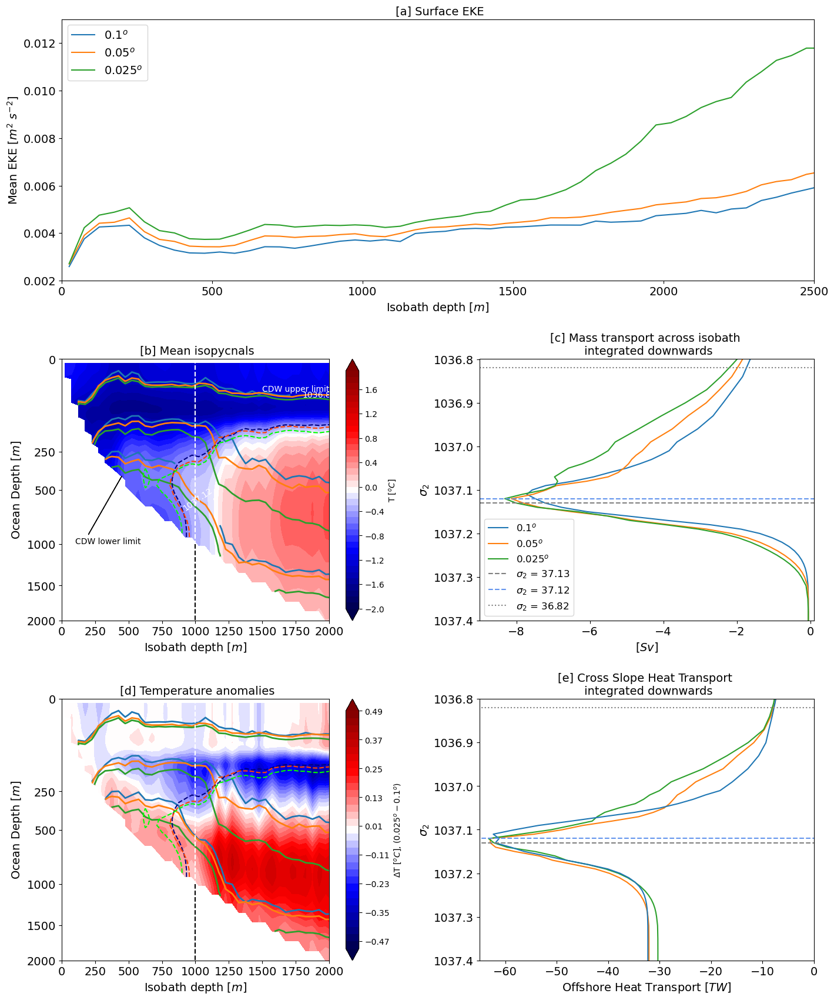

In [52]:
def forward(x):
    return x**(1/2)


def inverse(x):
    return x**2


plt.figure(figsize=(16,20))

plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.25, hspace=0.3)



plt.subplot(3,1,1)
EKE_01_along_isobath.plot(label=r"0.1$^{o}$ ",color='tab:blue')
EKE_005_along_isobath.plot(label=r"0.05$^{o}$ ",color='tab:orange')
EKE_0025_along_isobath.plot(label=r"0.025$^{o}$ ",color='tab:green')
plt.ylabel(r'Mean EKE [$m^2 \ s^{-2}$]',fontsize = 14)
plt.legend(fontsize = 14)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel(r'Isobath depth [$m$]',fontsize = 14)
plt.ylim(0.002,0.013)
plt.xlim(0,2500)
plt.title(' [a] Surface EKE', fontsize = 14)


density_levels=[1036.82,1037.05,1037.12]
temp_levels=np.round(np.arange(-2,2,.1),2)
temp_levels_diff=np.round(np.arange(-.5,.5,.03),2)
temperature_line_level = [-0.5,]


ax3 = plt.subplot(3,2,3)
Temp01 = ax3.contourf(T_01_along_isobath.deptho_bin,T_01_along_isobath.z_l,\
             T_01_along_isobath,levels=temp_levels,cmap='seismic',extend='both')
plt.colorbar(Temp01, label = r'T [$^oC$]' )
σ_01_plot = ax3.contour(σ_01_along_isobath.deptho_bin,σ_01_along_isobath.z_l,σ_01_along_isobath,levels=density_levels, colors='tab:blue',linewidths=2)
ax3.contour(σ_005_along_isobath.deptho_bin,σ_005_along_isobath.z_l,σ_005_along_isobath,levels=density_levels, colors='tab:orange',linewidths=2)
ax3.contour(σ_0025_along_isobath.deptho_bin,σ_0025_along_isobath.z_l,σ_0025_along_isobath,levels=density_levels, colors='tab:green',linewidths=2)
plt.clabel(σ_01_plot,levels = density_levels,\
           colors = 'white', fontsize = 10)
ax3.plot([1000,1000],[0,2000],color='white',linestyle='--')
ax3.plot([1000,1000],[1000,2000],color='black',linestyle='--')
ax3.contour(T_01_along_isobath.deptho_bin,T_01_along_isobath.z_l,\
            T_01_along_isobath, levels=temperature_line_level,colors='navy')
ax3.contour(T_005_along_isobath.deptho_bin,T_005_along_isobath.z_l,\
            T_005_along_isobath,levels=temperature_line_level,colors='orangered')
ax3.contour(T_0025_along_isobath.deptho_bin,T_0025_along_isobath.z_l,\
            T_0025_along_isobath,levels=temperature_line_level,colors='lime')
ax3.text(1500,30,'CDW upper limit',color='White')
ax3.text(100,1000,'CDW lower limit',color='black')
ax3.arrow(200,900,250,-500,color='black')
plt.ylim(2000,0)
plt.xlim(0,2000)
ax3.set_yscale('function', functions=(forward, inverse))
plt.xticks(fontsize = 14)
plt.yticks(ticks = [0, 250, 500, 1000, 1500, 2000],fontsize = 14)
plt.xlabel(r'Isobath depth [$m$]',fontsize = 14)
plt.ylabel(r'Ocean Depth [$m$]',fontsize = 14)
plt.title(' [b] Mean isopycnals', fontsize = 14)

plt.subplot(3,2,4)
#downward integrated mass until AASW limit
p01_MT.vol_trans_across_contour.sum('contour_index').mean('time').cumsum().\
plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
p005_MT.vol_trans_across_contour.sum('contour_index').mean('time').cumsum().\
plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
p0025_MT.vol_trans_across_contour.sum('contour_index').mean('time').cumsum().\
plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
plt.plot([-9,9],[DSW_sigma,DSW_sigma],color='grey',linestyle='--',label=r"$\sigma_2$ = " + str(np.round(DSW_sigma-1000,2)))
plt.plot([-9,9],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--',label=r"$\sigma_2$ = " + str(np.round(DSW_sigma01-1000,2)))
plt.plot([-9,9],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':',label=r"$\sigma_2$ = " + str(np.round(AASW_dense_limit-1000,2)))
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.8)
plt.xlim(-9,0.1)
plt.xlabel(r'[$Sv$]',fontsize=14)
plt.legend(fontsize=12)
plt.title(r'[c] Mass transport across isobath' + ' \n integrated downwards',fontsize=14)




ax4 = plt.subplot(3,2,5)
Temp_diff = ax4.contourf(T_01_along_isobath.deptho_bin,T_01_along_isobath.z_l,\
             T_0025_along_isobath - T_01_along_isobath,levels=temp_levels_diff,\
                         antialiased  = False ,cmap='seismic',extend='both')
plt.colorbar(Temp_diff, label = r'$\Delta$T [$^oC$], ($0.025^o - 0.1^o$)')
ax4.contour(σ_01_along_isobath.deptho_bin,σ_01_along_isobath.z_l,σ_01_along_isobath,levels=density_levels, colors='tab:blue',linewidths=2)
ax4.contour(σ_005_along_isobath.deptho_bin,σ_005_along_isobath.z_l,σ_005_along_isobath,levels=density_levels, colors='tab:orange',linewidths=2)
ax4.contour(σ_0025_along_isobath.deptho_bin,σ_0025_along_isobath.z_l,σ_0025_along_isobath,levels=density_levels, colors='tab:green',linewidths=2)
ax4.plot([1000,1000],[0,2000],color='white',linestyle='--')
ax4.plot([1000,1000],[1000,2000],color='black',linestyle='--')
ax4.contour(T_01_along_isobath.deptho_bin,T_01_along_isobath.z_l,\
            T_01_along_isobath, levels=temperature_line_level,colors='navy')
ax4.contour(T_005_along_isobath.deptho_bin,T_005_along_isobath.z_l,\
            T_005_along_isobath,levels=temperature_line_level,colors='orangered')
ax4.contour(T_0025_along_isobath.deptho_bin,T_0025_along_isobath.z_l,\
            T_0025_along_isobath,levels=temperature_line_level,colors='lime')

plt.ylim(2000,0)
plt.xlim(0,2000)
ax4.set_yscale('function', functions=(forward, inverse))
plt.xticks(fontsize = 14)
plt.yticks(ticks = [0, 250, 500, 1000, 1500, 2000],fontsize = 14)
plt.title(' [d] Temperature anomalies', fontsize = 14)
plt.xlabel(r'Isobath depth [$m$]',fontsize = 14)
plt.ylabel(r'Ocean Depth [$m$]',fontsize = 14)



plt.subplot(3,2,6)
#downward integrated CSHT until CDW limit
(p005_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
(p0025_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
(p01_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
.plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-100,100],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.8)
plt.xlim(-65,0)
plt.title(r'[e] Cross Slope Heat Transport' + ' \n integrated downwards',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)



# plt.savefig(figdir+'EKE_and_sigma_along_isobath.png',dpi=300,bbox_inches='tight')

In [53]:
#lets group the MT and HT by different bins
densitybins = [1015,1036.82,1037.125,1037.5] #separating by water mass
#densitybins = [999,1036.82,1036.94,1037.05,1037.12,1037.2,1037.5] # 2 to 3 classes per water mass
#densitybins = [999,1036.82,1037.05,1037.125,1037.5] # 1 for AASW, 2 for CDW, and 1 for DSW
#binning mass transports
p01_MT_largebins = p01_MT.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p005_MT_largebins = p005_MT.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p0025_MT_largebins = p0025_MT.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
#binning heat transports
p01_HT_largebins = p01_HT.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p005_HT_largebins = p005_HT.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
p0025_HT_largebins = p0025_HT.groupby_bins('rho2_l',bins=densitybins).sum().rename({'rho2_l_bins':'rho2_l'})
densitybins_mid = (np.array(densitybins[:-1]) + np.array(densitybins[1:]))/2
densitybins_mid[0] = 1036.6


widths_bars= np.linspace(0.1,0.03,np.shape(densitybins)[0]-1)
widths_bars[-1] = 0.1
widths_bars = (widths_bars*0) +0.2

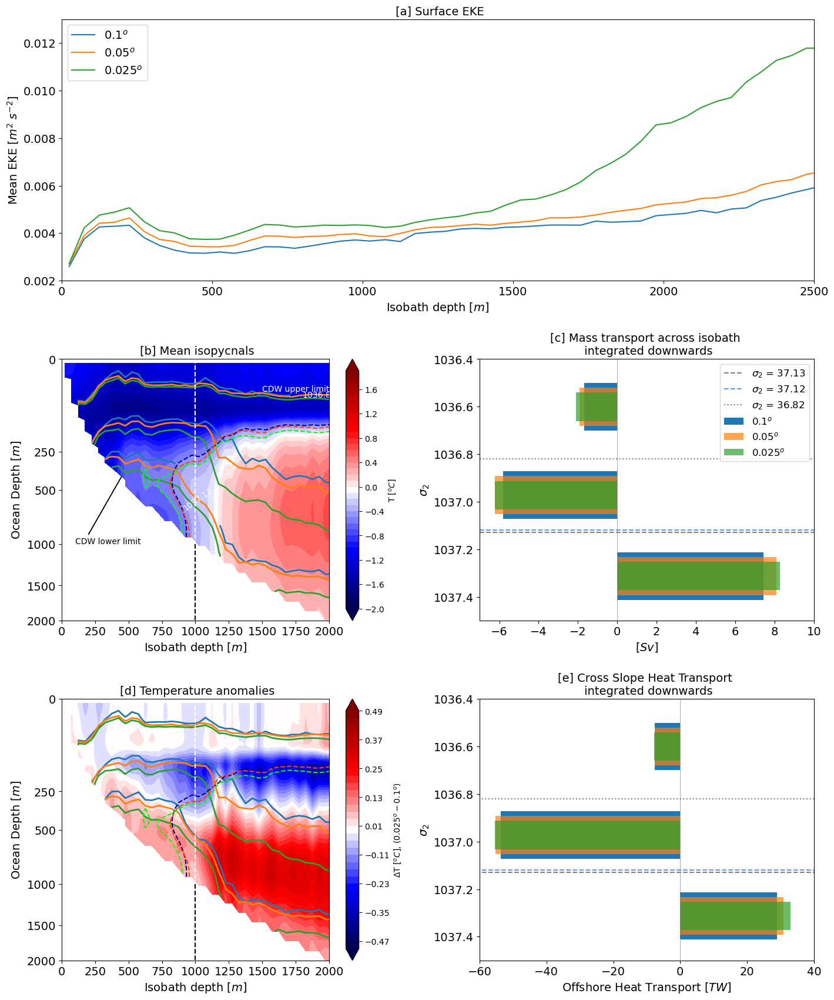

In [58]:
def forward(x):
    return x**(1/2)


def inverse(x):
    return x**2


plt.figure(figsize=(16,20))

plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.25, hspace=0.3)



plt.subplot(3,1,1)
EKE_01_along_isobath.plot(label=r"0.1$^{o}$ ",color='tab:blue')
EKE_005_along_isobath.plot(label=r"0.05$^{o}$ ",color='tab:orange')
EKE_0025_along_isobath.plot(label=r"0.025$^{o}$ ",color='tab:green')
plt.ylabel(r'Mean EKE [$m^2 \ s^{-2}$]',fontsize = 14)
plt.legend(fontsize = 14)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel(r'Isobath depth [$m$]',fontsize = 14)
plt.ylim(0.002,0.013)
plt.xlim(0,2500)
plt.title(' [a] Surface EKE', fontsize = 14)


density_levels=[1036.82,1037.05,1037.12]
temp_levels=np.round(np.arange(-2,2,.1),2)
temp_levels_diff=np.round(np.arange(-.5,.5,.03),2)
temperature_line_level = [-0.5,]


ax3 = plt.subplot(3,2,3)
Temp01 = ax3.contourf(T_01_along_isobath.deptho_bin,T_01_along_isobath.z_l,\
             T_01_along_isobath,levels=temp_levels,cmap='seismic',extend='both')
plt.colorbar(Temp01, label = r'T [$^oC$]' )
σ_01_plot = ax3.contour(σ_01_along_isobath.deptho_bin,σ_01_along_isobath.z_l,σ_01_along_isobath,levels=density_levels, colors='tab:blue',linewidths=2)
ax3.contour(σ_005_along_isobath.deptho_bin,σ_005_along_isobath.z_l,σ_005_along_isobath,levels=density_levels, colors='tab:orange',linewidths=2)
ax3.contour(σ_0025_along_isobath.deptho_bin,σ_0025_along_isobath.z_l,σ_0025_along_isobath,levels=density_levels, colors='tab:green',linewidths=2)
plt.clabel(σ_01_plot,levels = density_levels,\
           colors = 'white', fontsize = 10)
ax3.plot([1000,1000],[0,2000],color='white',linestyle='--')
ax3.plot([1000,1000],[1000,2000],color='black',linestyle='--')
ax3.contour(T_01_along_isobath.deptho_bin,T_01_along_isobath.z_l,\
            T_01_along_isobath, levels=temperature_line_level,colors='navy')
ax3.contour(T_005_along_isobath.deptho_bin,T_005_along_isobath.z_l,\
            T_005_along_isobath,levels=temperature_line_level,colors='orangered')
ax3.contour(T_0025_along_isobath.deptho_bin,T_0025_along_isobath.z_l,\
            T_0025_along_isobath,levels=temperature_line_level,colors='lime')
ax3.text(1500,30,'CDW upper limit',color='White')
ax3.text(100,1000,'CDW lower limit',color='black')
ax3.arrow(200,900,250,-500,color='black')
plt.ylim(2000,0)
plt.xlim(0,2000)
ax3.set_yscale('function', functions=(forward, inverse))
plt.xticks(fontsize = 14)
plt.yticks(ticks = [0, 250, 500, 1000, 1500, 2000],fontsize = 14)
plt.xlabel(r'Isobath depth [$m$]',fontsize = 14)
plt.ylabel(r'Ocean Depth [$m$]',fontsize = 14)
plt.title(' [b] Mean isopycnals', fontsize = 14)

ax324 = plt.subplot(3,2,4)
#downward integrated mass until AASW limit
# p01_MT.vol_trans_across_contour.sum('contour_index').mean('time').\
# plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
plt.barh(densitybins_mid,p01_MT_largebins.vol_trans_across_contour.sum('contour_index').mean('time'),height=widths_bars,label=r"0.1$^{o}$ ",color='tab:blue')
plt.barh(densitybins_mid,p005_MT_largebins.vol_trans_across_contour.sum('contour_index').mean('time'),height=0.8*widths_bars,label=r"0.05$^{o}$ ",color='tab:orange',alpha=0.7)
plt.barh(densitybins_mid,p0025_MT_largebins.vol_trans_across_contour.sum('contour_index').mean('time'),height=0.6*widths_bars,label=r"0.025$^{o}$ ",color='tab:green',alpha=0.7)
#plt.barh(densitybins_mid,p0025_MT_largebins.vol_trans_across_contour.sum('contour_index').mean('time'),height=0.03,label=r"0.025$^{o}$ ",color='tab:green',alpha=0.7)
# p005_MT.vol_trans_across_contour.sum('contour_index').mean('time').cumsum().\
# plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
# p0025_MT.vol_trans_across_contour.sum('contour_index').mean('time').cumsum().\
# plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
plt.plot([0,0],[999,1040],color='grey',linewidth=0.5)
plt.plot([-90,90],[DSW_sigma,DSW_sigma],color='grey',linestyle='--',label=r"$\sigma_2$ = " + str(np.round(DSW_sigma-1000,2)))
plt.plot([-90,90],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--',label=r"$\sigma_2$ = " + str(np.round(DSW_sigma01-1000,2)))
plt.plot([-90,90],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':',label=r"$\sigma_2$ = " + str(np.round(AASW_dense_limit-1000,2)))
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.5,1036.4)
plt.xlim(-7,10)
plt.xlabel(r'[$Sv$]',fontsize=14)
plt.legend(fontsize=12)
#ax324.set_yscale('function', functions=(forward, inverse))
plt.title(r'[c] Mass transport across isobath' + ' \n integrated downwards',fontsize=14)




ax4 = plt.subplot(3,2,5)
Temp_diff = ax4.contourf(T_01_along_isobath.deptho_bin,T_01_along_isobath.z_l,\
             T_0025_along_isobath - T_01_along_isobath,levels=temp_levels_diff,\
                         antialiased  = False ,cmap='seismic',extend='both')
plt.colorbar(Temp_diff, label = r'$\Delta$T [$^oC$], ($0.025^o - 0.1^o$)')
ax4.contour(σ_01_along_isobath.deptho_bin,σ_01_along_isobath.z_l,σ_01_along_isobath,levels=density_levels, colors='tab:blue',linewidths=2)
ax4.contour(σ_005_along_isobath.deptho_bin,σ_005_along_isobath.z_l,σ_005_along_isobath,levels=density_levels, colors='tab:orange',linewidths=2)
ax4.contour(σ_0025_along_isobath.deptho_bin,σ_0025_along_isobath.z_l,σ_0025_along_isobath,levels=density_levels, colors='tab:green',linewidths=2)
ax4.plot([1000,1000],[0,2000],color='white',linestyle='--')
ax4.plot([1000,1000],[1000,2000],color='black',linestyle='--')
ax4.contour(T_01_along_isobath.deptho_bin,T_01_along_isobath.z_l,\
            T_01_along_isobath, levels=temperature_line_level,colors='navy')
ax4.contour(T_005_along_isobath.deptho_bin,T_005_along_isobath.z_l,\
            T_005_along_isobath,levels=temperature_line_level,colors='orangered')
ax4.contour(T_0025_along_isobath.deptho_bin,T_0025_along_isobath.z_l,\
            T_0025_along_isobath,levels=temperature_line_level,colors='lime')

plt.ylim(2000,0)
plt.xlim(0,2000)
ax4.set_yscale('function', functions=(forward, inverse))
plt.xticks(fontsize = 14)
plt.yticks(ticks = [0, 250, 500, 1000, 1500, 2000],fontsize = 14)
plt.title(' [d] Temperature anomalies', fontsize = 14)
plt.xlabel(r'Isobath depth [$m$]',fontsize = 14)
plt.ylabel(r'Ocean Depth [$m$]',fontsize = 14)



plt.subplot(3,2,6)
#downward integrated CSHT until CDW limit
# (p005_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
# .plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
# (p0025_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
# .plot(y='rho2_l',label=r"0.025$^{o}$ ",color='tab:green')
# (p01_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time').cumsum() * 1e-12)\
# .plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
plt.barh(densitybins_mid,p01_HT_largebins.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=widths_bars,label=r"0.1$^{o}$ ",color='tab:blue')
plt.barh(densitybins_mid,p005_HT_largebins.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=0.8*widths_bars,label=r"0.05$^{o}$ ",color='tab:orange',alpha=0.7)
plt.barh(densitybins_mid,p0025_HT_largebins.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')*1e-12,height=0.6*widths_bars,label=r"0.025$^{o}$ ",color='tab:green',alpha=0.7)
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[DSW_sigma01,DSW_sigma01],color='cornflowerblue',linestyle='--')
plt.plot([-100,100],[AASW_dense_limit,AASW_dense_limit],color='grey',linestyle=':')
plt.plot([0,0],[999,1040],color='grey',linewidth=0.5)
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.5,1036.4)
plt.xlim(-60,40)
plt.title(r'[e] Cross Slope Heat Transport' + ' \n integrated downwards',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)


plt.savefig(figdir+'EKE_and_sigma_along_isobath_WMbars.png',dpi=300,bbox_inches='tight')

Based on the plot above it seems the the CSHT change is very small, with the biggest change being in the DSW layer. That for the 1000 m isobath tho. If we look at the 2000 m isobath, we have much more EKE in it, so perhaps the changes in there should be much larger --- we should calculate the heat transport in at least more 2 isobaths (shalower, e.g. 650 m, and deeper, eg 2000 m) so to see if the increase happens mostly in the 2000 m isobath

In [258]:
# Finding depth of maxT for panan-01
T01_montlhy_mean_findT = T01_montlhy_mean.fillna(-9999).argmax('z_l', skipna=True)#index of minimum temperature
T01_montlhy_mean_findT = T01_montlhy_mean.z_l.isel(z_l=T01_montlhy_mean_findT) # depth of isotherm
T01_montlhy_mean_findT = T01_montlhy_mean_findT.where(T01_montlhy_mean_findT>0.6)
#panan005
T005_montlhy_mean_findT = T005_montlhy_mean.fillna(-9999).argmax('z_l', skipna=True)#index of minimum temperature
T005_montlhy_mean_findT = T005_montlhy_mean.z_l.isel(z_l=T005_montlhy_mean_findT) # depth of isotherm
T005_montlhy_mean_findT = T005_montlhy_mean_findT.where(T005_montlhy_mean_findT>0.6)
#panan0025
T0025_montlhy_mean_findT = T0025_montlhy_mean.fillna(-9999).argmax('z_l', skipna=True)#index of minimum temperature
T0025_montlhy_mean_findT = T0025_montlhy_mean.z_l.isel(z_l=T0025_montlhy_mean_findT) # depth of isotherm
T0025_montlhy_mean_findT = T0025_montlhy_mean_findT.where(T0025_montlhy_mean_findT>0.6)

Can we aslo pinpoint if this change in the depth of CDW can be seen in maps of density and temperature? let's see how the depth of the maximum temperature changes

In [264]:
#importing bathymetry
deptho_P01 = xr.open_dataset('/g/data/ol01/outputs/mom6-panan/panant-01-zstar-ACCESSyr2/output000/19910101.ocean_static.nc')\
.deptho.fillna(0).sel(yh=slice(-80,-60))


In [274]:
#interpolating coarse data into the high resolution for differences...
T01_montlhy_mean_findT_into0025 = T01_montlhy_mean_findT.interp(xh=T0025_montlhy_mean_findT.xh,yh=T0025_montlhy_mean_findT.yh)
T005_montlhy_mean_findT_into0025 = T005_montlhy_mean_findT.interp(xh=T0025_montlhy_mean_findT.xh,yh=T0025_montlhy_mean_findT.yh)

lets add surface EKE too!

In [319]:
EKE_01_surf_mean_into0025 = EKE_01_surf_mean.interp(xq = EKE_0025_surf_mean.xq,yq = EKE_0025_surf_mean.yq)
EKE_005_surf_mean_into0025 = EKE_005_surf_mean.interp(xq = EKE_0025_surf_mean.xq,yq = EKE_0025_surf_mean.yq)

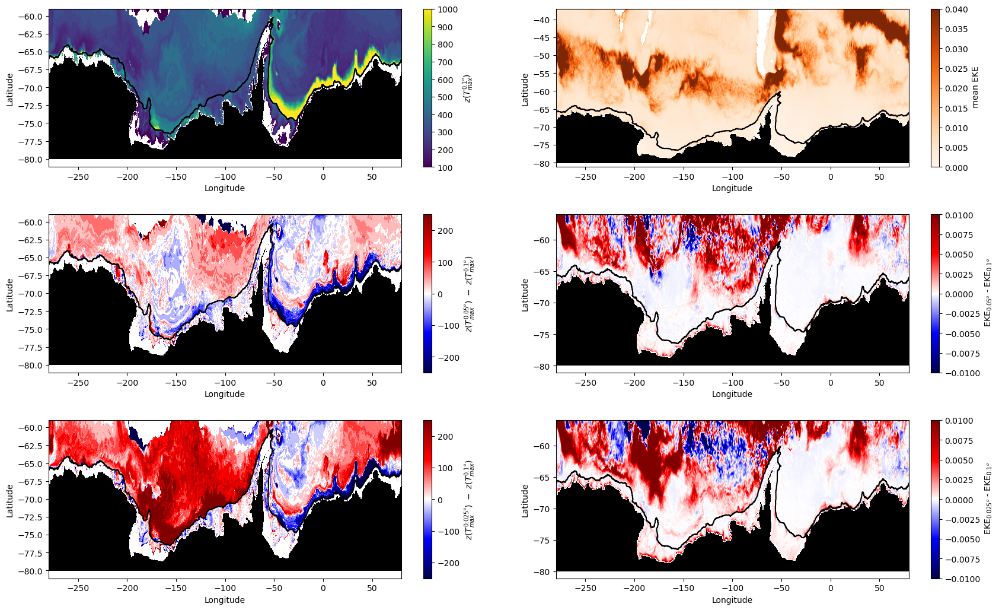

In [323]:
plt.figure(figsize=(20,12))


plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.15, hspace=0.3)

#depth of Tmax plots!
plt.subplot(3,2,1)
Tmax01_fields = T01_montlhy_mean_findT.plot.pcolormesh(vmin=100,vmax=1000,add_colorbar=False)
#deptho_P01.plot.contour(levels=[1,],colors='black',zorder=-1)
deptho_P01.plot.contourf(levels=[0,1],cmap='Greys_r',zorder=0,add_colorbar=False)
plt.plot(p005_HTmean.lon_along_contour,p005_HTmean.lat_along_contour,zorder=10,color='k')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
cbar = plt.colorbar(Tmax01_fields,label = '$z(T_{max}^{0.1^o})$');

plt.subplot(3,2,3)
Tdiff005_fields = (T005_montlhy_mean_findT_into0025-T01_montlhy_mean_findT_into0025).plot.pcolormesh(vmin=-250,vmax=250,cmap='seismic',add_colorbar=False)
#deptho_P01.plot.contour(levels=[1,],colors='black',zorder=-1)
deptho_P01.plot.contourf(levels=[0,1],cmap='Greys_r',zorder=0,add_colorbar=False)
plt.plot(p005_HTmean.lon_along_contour,p005_HTmean.lat_along_contour,zorder=10,color='k')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
cbar = plt.colorbar(Tdiff005_fields,label = '$z(T_{max}^{0.05^o})\ -\ z(T_{max}^{0.1^o})$');

plt.subplot(3,2,5)
Tdiff0025_fields = (T0025_montlhy_mean_findT-T01_montlhy_mean_findT_into0025).plot.pcolormesh(vmin=-250,vmax=250,cmap='seismic',add_colorbar=False)
#deptho_P01.plot.contour(levels=[1,],colors='black',zorder=-1)
deptho_P01.plot.contourf(levels=[0,1],cmap='Greys_r',zorder=0,add_colorbar=False)
plt.plot(p005_HTmean.lon_along_contour,p005_HTmean.lat_along_contour,zorder=10,color='k')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
cbar = plt.colorbar(Tdiff0025_fields,label = '$z(T_{max}^{0.025^o})\ -\ z(T_{max}^{0.1^o})$');



#depth of EKE difference plots
plt.subplot(3,2,2)
EKE01_surfplot = EKE_01_surf_mean.plot.pcolormesh(vmin=0,vmax=0.04,cmap='Oranges',add_colorbar=False)
deptho_P01.plot.contourf(levels=[0,1],cmap='Greys_r',zorder=0,add_colorbar=False)
plt.plot(p005_HTmean.lon_along_contour,p005_HTmean.lat_along_contour,zorder=10,color='k')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
cbar = plt.colorbar(EKE01_surfplot,label = ' mean EKE');

plt.subplot(3,2,4)
EKE005_surfplot = (EKE_005_surf_mean_into0025 - EKE_01_surf_mean_into0025).plot.pcolormesh(vmin=-0.01,vmax=+0.01,cmap='seismic',add_colorbar=False)
deptho_P01.plot.contourf(levels=[0,1],cmap='Greys_r',zorder=0,add_colorbar=False)
plt.plot(p005_HTmean.lon_along_contour,p005_HTmean.lat_along_contour,zorder=10,color='k')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
cbar = plt.colorbar(EKE005_surfplot,label = ' EKE$_{0.05^o}$ - EKE$_{0.1^o}$');

plt.subplot(3,2,6)
EKE0025_surfplot = (EKE_0025_surf_mean - EKE_01_surf_mean_into0025).plot.pcolormesh(vmin=-0.01,vmax=+0.01,cmap='seismic',add_colorbar=False)
deptho_P01.plot.contourf(levels=[0,1],cmap='Greys_r',zorder=0,add_colorbar=False)
plt.plot(p005_HTmean.lon_along_contour,p005_HTmean.lat_along_contour,zorder=10,color='k')
plt.xlabel('Longitude'); plt.ylabel('Latitude')
cbar = plt.colorbar(EKE0025_surfplot,label = ' EKE$_{0.025^o}$ - EKE$_{0.1^o}$');

We see that the depth of maximum temperature seem to move further down the water columnIT is hard to see the relatioship with EKE tho, probably becasue taht one is at surface

In [ ]:

#importing surface EKE.
#First we will need to make a time-dependent CSW CSHT matrix
p01_CDW_HT_time = ((p01_HT.binned_cross_slope_heat_trans + p01_HT.zonal_convergence)*p01_factor*1e-12).sel(rho2_l=CDW_density_slice).sum('rho2_l').compute()
p005_CDW_HT_time = ((p005_HT.binned_cross_slope_heat_trans + p005_HT.zonal_convergence)*p005_factor*1e-12).sel(rho2_l=CDW_density_slice).sum('rho2_l').compute()


#setting the bin spacing
EKE_bins=np.linspace(0,0.8,301)


#binning CSHT according to EKE bins - panan01
HT_P01_CDW_EKEbins = histogram(EKE01_Surface.EKE_binned_m2s2.fillna(0), 
                          bins = EKE_bins, 
                          dim = ['lon_bin_midpoints'],
                          weights = p01_CDW_HT_time.fillna(0)).mean('time').compute()

#binning CSHT according to EKE bins - panan005
HT_P005_CDW_EKEbins = histogram(EKE005_Surface.EKE_binned_m2s2.fillna(0), 
                          bins = EKE_bins, 
                          dim = ['lon_bin_midpoints'],
                          weights = p005_CDW_HT_time.fillna(0)).mean('time').compute()


__________

In [135]:
#Tresholds are
CDW_density_slice = slice(AASW_dense_limit,DSW_sigma)
CDW_density_slice01 = slice(AASW_dense_limit,DSW_sigma01)


#AASW heat transport is
p01_AASW_HT = ((p01_HT.binned_cross_slope_heat_trans + p01_HT.zonal_convergence)*p01_factor*1e-12)
p01_AASW_HT = p01_AASW_HT.where(p01_AASW_HT.rho2_l<AASW_dense_limit).fillna(0).sum('rho2_l').mean('time').compute()
p01_AASW_HT_value = np.round(p01_AASW_HT.sum().values,2)
p005_AASW_HT = ((p005_HT.binned_cross_slope_heat_trans + p005_HT.zonal_convergence)*p005_factor*1e-12)
p005_AASW_HT = p005_AASW_HT.where(p005_AASW_HT.rho2_l<AASW_dense_limit).fillna(0).sum('rho2_l').mean('time').compute()
p005_AASW_HT_value = np.round(p005_AASW_HT.sum().values,2)
p0025_AASW_HT = ((p0025_HT.binned_cross_slope_heat_trans + p0025_HT.zonal_convergence)*p0025_factor*1e-12)
p0025_AASW_HT = p0025_AASW_HT.where(p0025_AASW_HT.rho2_l<AASW_dense_limit).fillna(0).sum('rho2_l').mean('time').compute()
p0025_AASW_HT_value = np.round(p0025_AASW_HT.sum().values,2)

#CDW heat transport is
p01_CDW_HT = ((p01_HT.binned_cross_slope_heat_trans + p01_HT.zonal_convergence)*p01_factor*1e-12).sel(rho2_l=CDW_density_slice01).sum('rho2_l').mean('time').compute()
p01_CDW_HT_value = np.round(p01_CDW_HT.sum().values,2)
p005_CDW_HT = ((p005_HT.binned_cross_slope_heat_trans + p005_HT.zonal_convergence)*p005_factor*1e-12).sel(rho2_l=CDW_density_slice).sum('rho2_l').mean('time').compute()
p005_CDW_HT_value = np.round(p005_CDW_HT.sum().values,2)
p0025_CDW_HT = ((p0025_HT.binned_cross_slope_heat_trans + p0025_HT.zonal_convergence)*p0025_factor*1e-12).sel(rho2_l=CDW_density_slice).sum('rho2_l').mean('time').compute()
p0025_CDW_HT_value = np.round(p0025_CDW_HT.sum().values,2)

## DSW heat transport is
p01_DSW_HT = ((p01_HT.binned_cross_slope_heat_trans + p01_HT.zonal_convergence)*p01_factor*1e-12)
p01_DSW_HT = p01_DSW_HT.where(p01_DSW_HT.rho2_l>=DSW_sigma01).fillna(0).sum('rho2_l').mean('time').compute()
p01_DSW_HT_value = np.round(p01_DSW_HT.sum().values,2)
p005_DSW_HT = ((p005_HT.binned_cross_slope_heat_trans + p005_HT.zonal_convergence)*p005_factor*1e-12)
p005_DSW_HT = p005_DSW_HT.where(p005_DSW_HT.rho2_l>=DSW_sigma).fillna(0).sum('rho2_l').mean('time').compute()
p005_DSW_HT_value = np.round(p005_DSW_HT.sum().values,2)
p0025_DSW_HT = ((p0025_HT.binned_cross_slope_heat_trans + p0025_HT.zonal_convergence)*p0025_factor*1e-12)
p0025_DSW_HT = p0025_DSW_HT.where(p0025_DSW_HT.rho2_l>=DSW_sigma).fillna(0).sum('rho2_l').mean('time').compute()
p0025_DSW_HT_value = np.round(p0025_DSW_HT.sum().values,2)


In [136]:
#lets do the same for the mass transport!
#AASW Mass transport is
p01_AASW_MT = p01_MT.vol_trans_across_contour
p01_AASW_MT =p01_AASW_MT.where(p01_AASW_MT.rho2_l<AASW_dense_limit).fillna(0).sum('rho2_l').mean('time').compute()
p01_AASW_MT_value = np.round(p01_AASW_MT.sum().values,2) #SV
p005_AASW_MT = p005_MT.vol_trans_across_contour
p005_AASW_MT =p005_AASW_MT.where(p005_AASW_MT.rho2_l<AASW_dense_limit).fillna(0).sum('rho2_l').mean('time').compute()
p005_AASW_MT_value = np.round(p005_AASW_MT.sum().values,2) #SV
p0025_AASW_MT = p0025_MT.vol_trans_across_contour
p0025_AASW_MT =p0025_AASW_MT.where(p0025_AASW_MT.rho2_l<AASW_dense_limit).fillna(0).sum('rho2_l').mean('time').compute()
p0025_AASW_MT_value = np.round(p0025_AASW_MT.sum().values,2) #SV

#CDW Mass transport is
p01_CDW_MT = p01_MT.vol_trans_across_contour.sel(rho2_l=CDW_density_slice01).sum('rho2_l').mean('time').compute()
p01_CDW_MT_value = np.round(p01_CDW_MT.sum().values,2)
p005_CDW_MT = p005_MT.vol_trans_across_contour.sel(rho2_l=CDW_density_slice).sum('rho2_l').mean('time').compute()
p005_CDW_MT_value = np.round(p005_CDW_MT.sum().values,2)
p0025_CDW_MT = p0025_MT.vol_trans_across_contour.sel(rho2_l=CDW_density_slice).sum('rho2_l').mean('time').compute()
p0025_CDW_MT_value = np.round(p0025_CDW_MT.sum().values,2)

#DSW mass transport is
p01_DSW_MT = p01_MT.vol_trans_across_contour
p01_DSW_MT = p01_DSW_MT.where(p01_DSW_MT.rho2_l>=DSW_sigma01).fillna(0).sum('rho2_l').mean('time').compute()
p01_DSW_MT_value = np.round(p01_DSW_MT.sum().values,2)
p005_DSW_MT = p005_MT.vol_trans_across_contour
p005_DSW_MT = p005_DSW_MT.where(p005_DSW_MT.rho2_l>=DSW_sigma).fillna(0).sum('rho2_l').mean('time').compute()
p005_DSW_MT_value = np.round(p005_DSW_MT.sum().values,2)
p0025_DSW_MT = p0025_MT.vol_trans_across_contour
p0025_DSW_MT = p0025_DSW_MT.where(p0025_DSW_MT.rho2_l>=DSW_sigma).fillna(0).sum('rho2_l').mean('time').compute()
p0025_DSW_MT_value = np.round(p0025_DSW_MT.sum().values,2)

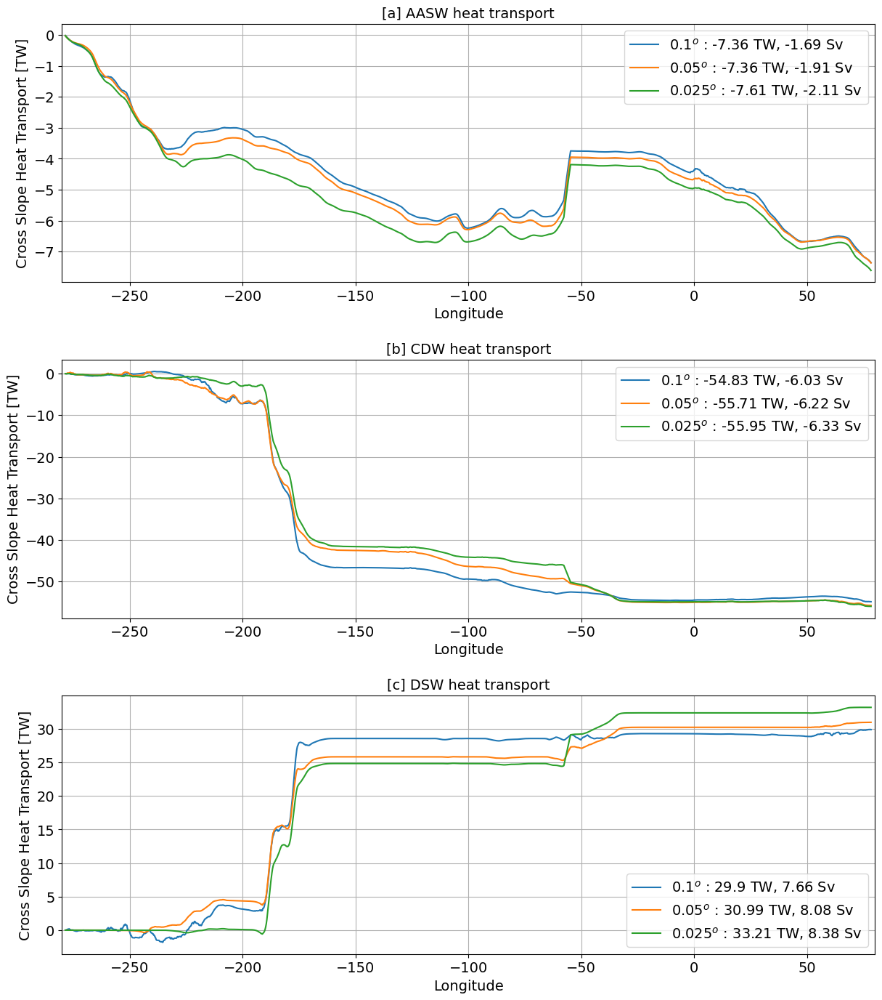

In [137]:
plt.figure(figsize=(14,16))
plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.3, hspace=0.3)

plt.subplot(3,1,1)
p01_AASW_HT.cumsum().plot(color='tab:blue',label=r"0.1$^{o}$ : " + str(p01_AASW_HT_value) + " TW, " +\
                         str(p01_AASW_MT_value) + " Sv")
p005_AASW_HT.cumsum().plot(color='tab:orange',label=r"0.05$^{o}$ : " + str(p005_AASW_HT_value) + " TW, "+ \
                          str(p005_AASW_MT_value) + " Sv")
p0025_AASW_HT.cumsum().plot(color='tab:green',label=r"0.025$^{o}$ : " + str(p0025_AASW_HT_value) + " TW, " + \
                           str(p0025_AASW_MT_value) + " Sv")
plt.grid()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.legend(fontsize=14)
plt.xlim(-280,80)
plt.xlabel('Longitude',fontsize=14); 
plt.ylabel('Cross Slope Heat Transport [TW]',fontsize=14)
plt.title(r'[a] AASW heat transport',fontsize=14)


plt.subplot(3,1,2)
p01_CDW_HT.cumsum().plot(color='tab:blue',label=r"0.1$^{o}$ : " + str(p01_CDW_HT_value) + " TW, "+ \
                        str(p01_CDW_MT_value) + " Sv")
p005_CDW_HT.cumsum().plot(color='tab:orange',label=r"0.05$^{o}$ : " + str(p005_CDW_HT_value) + " TW, " + \
                         str(p005_CDW_MT_value) + " Sv")
p0025_CDW_HT.cumsum().plot(color='tab:green',label=r"0.025$^{o}$ : " + str(p0025_CDW_HT_value) + " TW, " +\
                          str(p0025_CDW_MT_value) + " Sv")
plt.grid()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.legend(fontsize=14)
plt.xlim(-280,80)
plt.xlabel('Longitude',fontsize=14); 
plt.ylabel('Cross Slope Heat Transport [TW]',fontsize=14)
plt.title(r'[b] CDW heat transport',fontsize=14)



plt.subplot(3,1,3)
p01_DSW_HT.cumsum().plot(color='tab:blue',label=r"0.1$^{o}$ : " + str(p01_DSW_HT_value) + " TW, " + \
                        str(p01_DSW_MT_value) + " Sv")
p005_DSW_HT.cumsum().plot(color='tab:orange',label=r"0.05$^{o}$ : " + str(p005_DSW_HT_value) + " TW, " + \
                         str(p005_DSW_MT_value) + " Sv")
p0025_DSW_HT.cumsum().plot(color='tab:green',label=r"0.025$^{o}$ : " + str(p0025_DSW_HT_value) + " TW, " + \
                          str(p0025_DSW_MT_value) + " Sv")
plt.grid()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.legend(fontsize=14)
plt.xlim(-280,80)
plt.xlabel('Longitude',fontsize=14); 
plt.ylabel('Cross Slope Heat Transport [TW]',fontsize=14)
plt.title(r'[c] DSW heat transport',fontsize=14)
plt.savefig(figdir+'heat_transport_per_watermass.png',dpi=300,bbox_inches='tight')

_______

Let's bin the CSHT into large 10 degree bins to try to see regional differences on where the additional heat comes from in the model with higher resolution

In [43]:
#first, lets bin already vertically integrated data into the 10 degree bins
largebins = np.linspace(-280,80,37)
P005_HT_10degbins = ((P005_binned_CSHT_mean+P005_binned_ZC_mean)*p005_factor/1e12)\
.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
P0025_HT_10degbins = ((P0025_binned_CSHT_mean+P0025_binned_ZC_mean)*p0025_factor/1e12)\
.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
P01_HT_10degbins = ((P01_binned_CSHT_mean+P01_binned_ZC_mean)*p01_factor/1e12)\
.groupby_bins('lon_bin_midpoints',bins=largebins).sum()

INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'


In [44]:
#Now lets do the same for the data in eac water mass layer...
p01_AASW_HT_10degbins = p01_AASW_HT.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
p01_CDW_HT_10degbins = p01_CDW_HT.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
p01_DSW_HT_10degbins = p01_DSW_HT.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
#
p005_AASW_HT_10degbins = p005_AASW_HT.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
p005_CDW_HT_10degbins = p005_CDW_HT.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
p005_DSW_HT_10degbins = p005_DSW_HT.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
#
p0025_AASW_HT_10degbins = p0025_AASW_HT.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
p0025_CDW_HT_10degbins = p0025_CDW_HT.groupby_bins('lon_bin_midpoints',bins=largebins).sum()
p0025_DSW_HT_10degbins = p0025_DSW_HT.groupby_bins('lon_bin_midpoints',bins=largebins).sum()

INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:Entering _va

In [45]:
#importing bathymetry
deptho_P01 = xr.open_dataset('/g/data/ik11/outputs/mom6-panan/panant-01-zstar-ACCESSyr2/output000/19910101.ocean_static.nc')\
.deptho.fillna(0).sel(yh=slice(-80,-60))


  return np.abs(x)**(1/2) * (x/np.abs(x))

  return np.abs(x)**(1/2) * (x/np.abs(x))



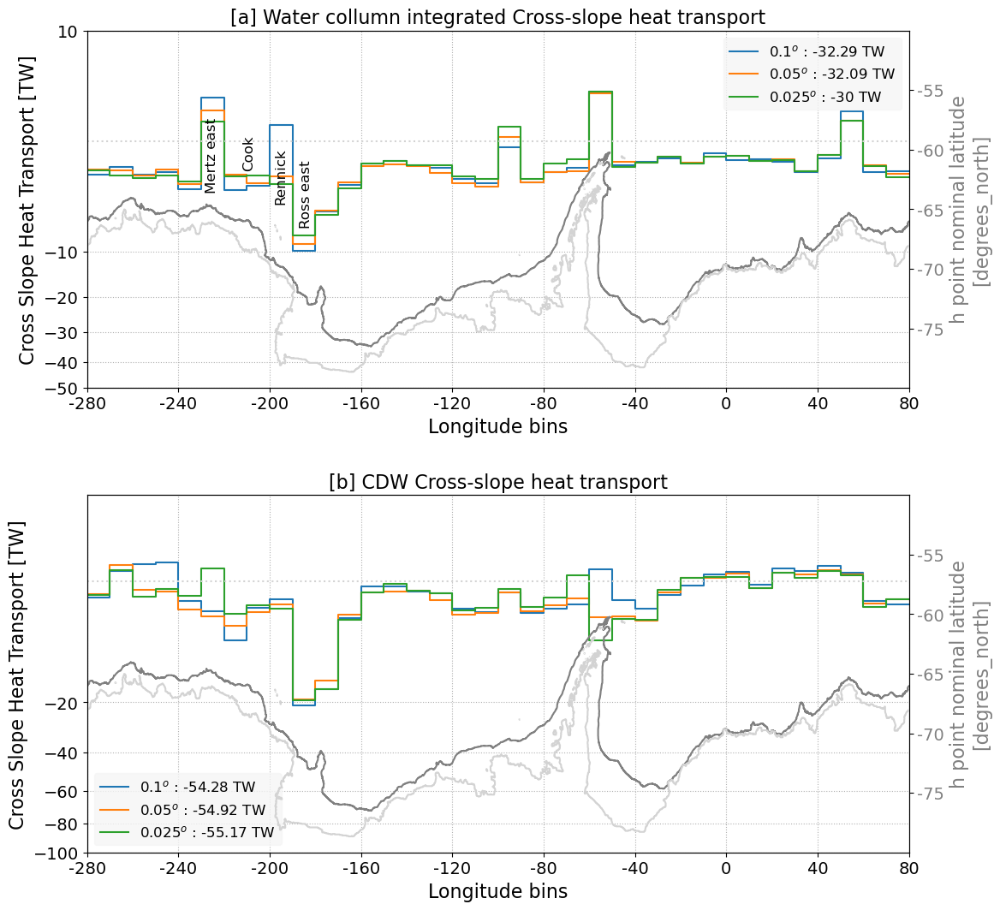

In [46]:
# Function x**(1/2)
def forward(x):
    return np.abs(x)**(1/2) * (x/np.abs(x))


def inverse(x):
    return x**2

fig = plt.figure(figsize=(12,12))
plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.3, hspace=0.3)

ax = plt.subplot(2,1,1)
P01_HT_10degbins.plot.step(color='tab:blue',label=r"0.1$^{o}$ : " + str(p01_total) + " TW")
P005_HT_10degbins.plot.step(color='tab:orange',label=r"0.05$^{o}$ : " + str(p005_total) + " TW")
P0025_HT_10degbins.plot.step(color='tab:green',label=r"0.025$^{o}$ : " + str(p0025_total) + " TW")
plt.plot([-280,80],[1e-20,1e-20],color='lightgrey',linestyle=':')
plt.xlabel('Longitude bins',fontsize = 16); 
plt.ylabel(r'Cross Slope Heat Transport [TW]',fontsize = 16); 
plt.title('[a] Water collumn integrated Cross-slope heat transport',fontsize = 16)
plt.grid(linestyle=':')
legend = plt.legend(fontsize=12)
frame = legend.get_frame()
frame.set_color('whitesmoke')
plt.xlim(-280,80)
plt.xticks(ticks=np.linspace(-280,80,10),labels=np.linspace(-280,80,10).astype('int'),fontsize=14)
plt.yticks(fontsize=14)
plt.text(-187,-5.8,'Ross east',fontsize=12, rotation=90)
plt.text(-198,-3,'Rennick',fontsize=12, rotation=90)
plt.text(-212,-0.6,'Cook',fontsize=12, rotation=90)
plt.text(-228,-2,'Mertz east',fontsize=12, rotation=90)
ax.set_yscale('function', functions=(forward,inverse))
plt.ylim(-50,10)
#creating the twin
axtwin=ax.twinx()
axtwin.plot(p005_HTmean.lon_along_contour,p005_HTmean.lat_along_contour,zorder=0,color='grey')
plt.xlim(-280,80)
axtwin.set_ylim(-80,-50)
plt.yticks(ticks = np.arange(-75,-50,5), labels = np.arange(-75,-50,5),fontsize=14,color='grey')
axtwin.set_ylabel(r'Latitude [$^oN$]',fontsize = 16,color='grey')

deptho_P01.plot.contour(levels=[1,],colors='lightgrey',zorder=0)


ax2 = plt.subplot(2,1,2)
p01_CDW_HT_10degbins.plot.step(color='tab:blue',label=r"0.1$^{o}$ : " + str(p01_CDW_HT_value) + " TW")
p005_CDW_HT_10degbins.plot.step(color='tab:orange',label=r"0.05$^{o}$ : " + str(p005_CDW_HT_value) + " TW")
p0025_CDW_HT_10degbins.plot.step(color='tab:green',label=r"0.025$^{o}$ : " + str(p0025_CDW_HT_value) + " TW")

plt.plot([-280,80],[1e-20,1e-20],color='lightgrey',linestyle=':')
plt.xlabel('Longitude bins',fontsize = 16); 
plt.ylabel(r'Cross Slope Heat Transport [TW]',fontsize = 16); 
plt.title('[b] CDW Cross-slope heat transport',fontsize = 16)
plt.grid(linestyle=':')
legend = plt.legend(fontsize=12)
frame = legend.get_frame()
frame.set_color('whitesmoke')
plt.xlim(-280,80)
plt.xticks(ticks=np.linspace(-280,80,10),labels=np.linspace(-280,80,10).astype('int'),fontsize=14)
ax2.set_yscale('function', functions=(forward,inverse))
plt.ylim(-100,10)
plt.yticks(fontsize=14)
# plt.text(-187,-5.8,'Ross east',fontsize=12, rotation=90)
# plt.text(-198,-3,'Rennick',fontsize=12, rotation=90)
# plt.text(-212,-0.6,'Cook',fontsize=12, rotation=90)
# plt.text(-228,-2,'Mertz east',fontsize=12, rotation=90)

#creating the twin
axtwin2=ax2.twinx()
axtwin2.plot(p005_HTmean.lon_along_contour,p005_HTmean.lat_along_contour,zorder=0,color='grey')
plt.xlim(-280,80)
axtwin2.set_ylim(-80,-50)
plt.yticks(ticks = np.arange(-75,-50,5), labels = np.arange(-75,-50,5),fontsize=14,color='grey')
axtwin2.set_ylabel(r'Latitude [$^oN$]',fontsize = 16,color='grey')

deptho_P01.plot.contour(levels=[1,],colors='lightgrey',zorder=0)

plt.savefig(figdir+'ResolutionComparisson_10deg_bins.png',dpi=300,bbox_inches='tight')

#### Full collumn CSHT

We can see in this plot the comparisson of the CSHT patterns between resolutions, in 10 degree bins.

**Ross Sea bin:**  One big difference we see is the reduction in incoming CSHT in the western Ross sea, close to the Drygalski trough (~$-170^o$ West, $1.2\ TW$ reduction). That reduction it is interesting, because we seem to have more DSW formation in the $0.05^o$ model in the Ross sea according to Christina's calculations. Perhaps what we have here is the increase in DSW formation exports more heat out of the shelf.


**Rennick ice shelf bin:** Here we have that the $0.05^o$ now have incoming heat, reversing the direction of the heat transport compared to the $0.1^o$. This reversal acocounts for pretty much $1.2\ TW$ increase in cross slope transport in this shelf. So it seems to me that the heat transport total in these two bins above would be the same, but it is more spatially distributed in the $0.05^o$ than in the $0.1^o$



**Cook ice shelf bins:** Here the CSHT towards the shelf decreases as we refine the resolution, i.e., the $0.05^o$ again has less CSHT towards the shelf than the $0.01^o$

**Mertz ice shelf bin:** This bin seem to have lower northward HT in the higher resolution case $0.05^o$. This is consistent with Christina's findings agin, in which we have lower DSW formation in this region, which would implicate in lower Northward heat transport by the DSW. 



*To see if the changes we see in Mertz and Adelie are due to the DSW changes, lets see a profile of the heat transport in these bins... do we see changes in heat transport in the density bins that are attributed to the DSW?*

#### CDW CSHT

It is hard to highlight regionally where we have more heat incoming from the CDW. However, in some regions, the CSHT passes from being northward to Southward, which could likely ammount to the 2 TW increase between panan01 and panan005. Some of these regions are, west of -240 W, and by the west of the Antarctic peninsula.

One bin goes in the total opposite direction tho, i.e., the CDW-CSHE decreases with refined resolution. That happens along the East of Ross Sea, and it agrees with the changes seen in the full column CSHT


*Can we attribute the increase in CDW CSHT to more eddy activity? Let's bin the CSHT along the isobath in EKE bins, to try to answer that question*

In [47]:
from xhistogram.xarray import histogram
#importing surface EKE.

base_EKEdir = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/'

#monthly surface EKE, calculated from daily (summed not averaged,so it maintains daily signal)
EKE01_Surface = xr.open_dataset(base_EKEdir + 'panan01_rerun/EKE_along_contour/vorticity_EKE_binned_along_contour_panan01.nc').compute()
EKE005_Surface = xr.open_dataset(base_EKEdir + 'panan005_rerun/EKE_along_contour/vorticity_EKE_binned_along_contour_panan005.nc').compute()


binning the CSHT into EKE levels

In [48]:
#First we will need to make a time-dependent CSW CSHT matrix
p01_CDW_HT_time = ((p01_HT.binned_cross_slope_heat_trans + p01_HT.zonal_convergence)*p01_factor*1e-12).sel(rho2_l=CDW_density_slice).sum('rho2_l').compute()
p005_CDW_HT_time = ((p005_HT.binned_cross_slope_heat_trans + p005_HT.zonal_convergence)*p005_factor*1e-12).sel(rho2_l=CDW_density_slice).sum('rho2_l').compute()


#setting the bin spacing
EKE_bins=np.linspace(0,0.8,301)


#binning CSHT according to EKE bins - panan01
HT_P01_CDW_EKEbins = histogram(EKE01_Surface.EKE_binned_m2s2.fillna(0), 
                          bins = EKE_bins, 
                          dim = ['lon_bin_midpoints'],
                          weights = p01_CDW_HT_time.fillna(0)).mean('time').compute()

#binning CSHT according to EKE bins - panan005
HT_P005_CDW_EKEbins = histogram(EKE005_Surface.EKE_binned_m2s2.fillna(0), 
                          bins = EKE_bins, 
                          dim = ['lon_bin_midpoints'],
                          weights = p005_CDW_HT_time.fillna(0)).mean('time').compute()


  return np.abs(x)**(1/2) * (x/np.abs(x))



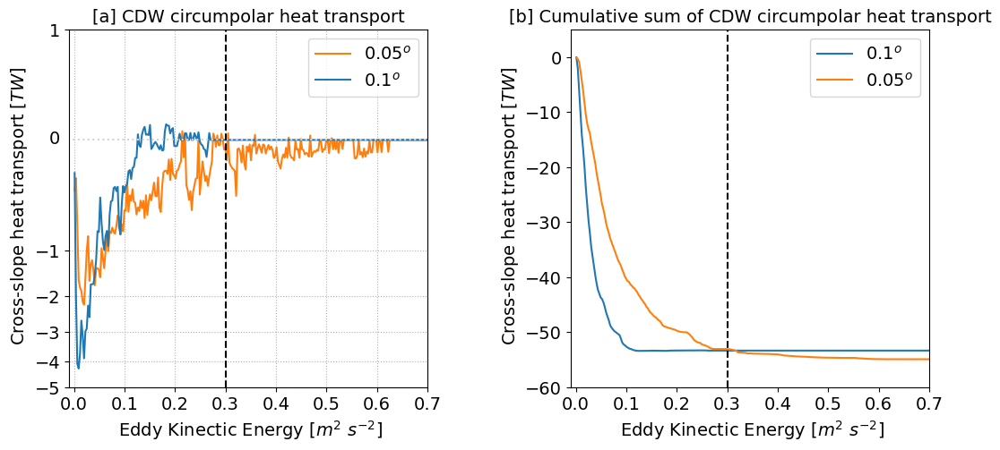

In [49]:
# Function x**(1/2)
def forward(x):
    return np.abs(x)**(1/2) * (x/np.abs(x))


def inverse(x):
    return x**2


plt.figure(figsize = (12,5))
plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.4, hspace=0.3)

#Notice that a plot manouver is done on top figure to represent the 0, that otherwise wouldnt appear due to the streched y axis
ax121 = plt.subplot(1,2,1)
HT_P005_CDW_EKEbins.where(HT_P005_CDW_EKEbins!=0).fillna(1e-20).plot(x='EKE_binned_m2s2_bin',label=r"0.05$^{o}$",color='tab:orange')
HT_P01_CDW_EKEbins.where(HT_P01_CDW_EKEbins!=0).fillna(1e-20).plot(x='EKE_binned_m2s2_bin',label=r"0.1$^{o}$",color='tab:blue')
plt.plot([-.1,.9],[1e-20,1e-20],color='lightgrey',linestyle=':')
plt.plot([.3,.3],[-5,1],color='black',linestyle='--')
plt.text(-.05,-1e-3,'0',color='black',fontsize = 14)
plt.yticks([-5,-4,-3,-2,-1,1e-20,1],labels= [-5,-4,-3,-2,-1,0,1],fontsize = 14)
plt.xticks(fontsize = 14)
plt.legend(fontsize = 14)
ax121.set_yscale('function', functions=(forward,inverse))
plt.xlabel(r' Eddy Kinectic Energy [$m^2 \ s^{-2}$]',fontsize = 14)
plt.ylabel(r' Cross-slope heat transport [$TW$]',fontsize = 14)
plt.title(r'[a] CDW circumpolar heat transport',fontsize = 14)
plt.xlim(-.01,.7)
plt.ylim(-5,1)
plt.grid(linestyle = ':')

ax122 = plt.subplot(1,2,2)
HT_P01_CDW_EKEbins.cumsum().plot(x='EKE_binned_m2s2_bin',label=r"0.1$^{o}$")
HT_P005_CDW_EKEbins.cumsum().plot(x='EKE_binned_m2s2_bin',label=r"0.05$^{o}$")
plt.plot([.3,.3],[-60,5],color='black',linestyle='--')
plt.yticks(fontsize = 14)
plt.xticks(fontsize = 14)
plt.legend(fontsize = 14)
plt.xlabel(r' Eddy Kinectic Energy [$m^2 \ s^{-2}$]',fontsize = 14)
plt.ylabel(r' Cross-slope heat transport [$TW$]',fontsize = 14)
plt.xlim(-.01,.7)
plt.ylim(-60,5)
plt.title(r'[b] Cumulative sum of CDW circumpolar heat transport',fontsize = 14)


plt.savefig(figdir+'EKE_VS_CDW_CSHT.png',dpi=300,bbox_inches='tight')

On the left, we see the CDW-CSHT binned into the surface EKE, while on the right we see the same, but summed from low to high EKE.


We can see that the $0.1^o$ model is unable to simulate high-EKE (EKE > 0.3 $m^2 \ s^{-2}$) eddy rich regimes, while the $0.05^o$ simulate EKE values up to 0.7 $m^2 \ s^{-2}$. By looking at the cumsummed values, we see that exactly in the higher EKE range, is where the CDW-CSHT from the $0.05^o$ model surpasses the one from $0.1^o$ model. 

*Likely, the more energetic Eddy field in the $0.05^o$  model (i.e., more eddies) is more efficient in bringing CDW heat toward the shelf*

# EKE changes in density space

The proportional increase in CDW and DSW CSHT ( of about 2 TW) suggests that the resolution increase allow for more eddies to be solved at the CDW/DSW layers, increase the cross shelf transport of heat. To test if that is the case we will calcualte the EKE along isopycnals in the simulations, and see if indeed such an increase is seen in those layers...



... Notice however that we only have monthly velocities in density layers, which is not ideal. So there will be some loss of total EKE here in the intra-month frequency. However, previous results show that even in the monthly timescalse, the model with higher resolution has more EKE than the one with lower resolution. So although not perfect, this monthly comparisson can still explored, as long as we have that caveat in mind.

In [37]:
#Importing EKE along isobath
EKE_indir = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data'

EKE01_σ = xr.open_mfdataset(EKE_indir + '/panan01_rerun/EKE_along_contour_rho/EKE_along*.nc')
EKE005_σ = xr.open_mfdataset(EKE_indir + '/panan005_rerun/EKE_along_contour_rho/EKE_along*.nc')



Profiles of accumulated EKE($\sigma$)

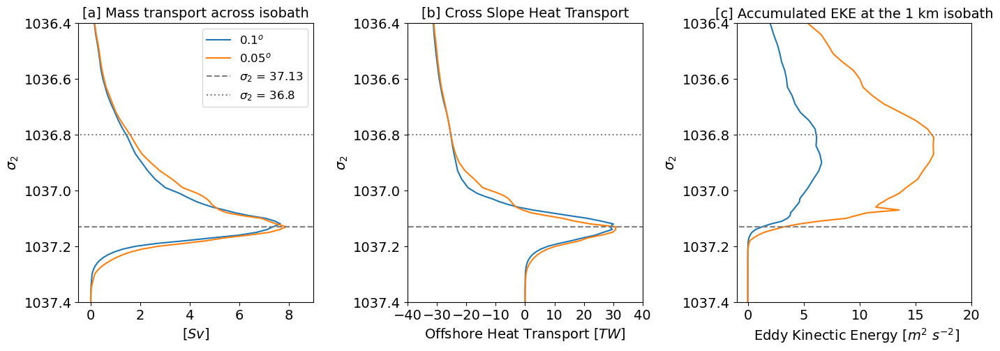

In [39]:
plt.figure(figsize=(16,5))
plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.4, hspace=0.4)

plt.subplot(1,3,1)
p01_MT.vol_trans_across_contour.sum('contour_index').mean('time')[::-1].cumsum().plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
p005_MT.vol_trans_across_contour.sum('contour_index').mean('time')[::-1].cumsum().plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
plt.plot([-9,9],[DSW_sigma,DSW_sigma],color='grey',linestyle='--',label=r"$\sigma_2$ = " + str(np.round(DSW_sigma-1000,2)))
plt.plot([-9,9],[1036.8,1036.8],color='grey',linestyle=':',label=r"$\sigma_2$ = " + str(np.round(1036.8-1000,2)))
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.4)
plt.xlim(-0.5,9)
#plt.xlim(-1,1.5)
plt.xlabel(r'[$Sv$]',fontsize=14)
plt.legend(fontsize=12)
plt.title(r'[a] Mass transport across isobath',fontsize=14)



plt.subplot(1,3,2)
(p01_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')[::-1].cumsum() * 1e-12).plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
(p005_HT.unbinned_heat_transp_across_contour.sum('contour_index').mean('time')[::-1].cumsum() * 1e-12).plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[1036.8,1036.8],color='grey',linestyle=':')
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.4)
plt.xlim(-40,40)
#plt.xlim(-6,6)
plt.title(r'[b] Cross Slope Heat Transport',fontsize=14)
plt.xlabel(r'Offshore Heat Transport [$TW]$',fontsize=14)

plt.subplot(1,3,3)
EKE01_σ.EKE_binned_m2s2.sum('lon_bin_midpoints').mean('time').plot(y='rho2_l',label=r"0.1$^{o}$ ",color='tab:blue')
EKE005_σ.EKE_binned_m2s2.sum('lon_bin_midpoints').mean('time').plot(y='rho2_l',label=r"0.05$^{o}$ ",color='tab:orange')
plt.plot([-100,100],[DSW_sigma,DSW_sigma],color='grey',linestyle='--')
plt.plot([-100,100],[1036.8,1036.8],color='grey',linestyle=':')
plt.ylabel(r'$\sigma_2$',fontsize=14)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.ylim(1037.4,1036.4)
plt.xlim(-1,20)
plt.xlabel(r' Eddy Kinectic Energy [$m^2 \ s^{-2}$]',fontsize = 14)
plt.title(r'[c] Accumulated EKE at the 1 km isobath',fontsize=14)

plt.savefig(figdir+'EKE_in_sigma_layers.png',dpi=300,bbox_inches='tight')


We indeed see a massive increase in EKE in the $\sigma_2$ layers attributed to the CDW, which then suggests that the higher heat transport we see in the CDW layer, could come from more eddies flowing across the isobath

Let's now bin the CDW heat transport into EKE bins... what does that show us?

In [116]:
#First we will need to make a time-dependent CSW CSHT matrix
p01_CDW_EKE_time = EKE01_σ.EKE_binned_m2s2.sel(rho2_l=CDW_density_slice).sum('rho2_l').compute()
p01_CDW_EKE_time['lon_bin_midpoints'] = p01_CDW_HT_time.lon_bin_midpoints
p01_CDW_EKE_time['time'] = p01_CDW_HT_time.time
p005_CDW_EKE_time = EKE005_σ.EKE_binned_m2s2.sel(rho2_l=CDW_density_slice).sum('rho2_l').compute()
p005_CDW_EKE_time['lon_bin_midpoints'] = p005_CDW_HT_time.lon_bin_midpoints
p005_CDW_EKE_time['time'] = p005_CDW_HT_time.time


EKE_bins_σ=np.linspace(0,10,601)


#binning CSHT according to EKE bins - panan01
HT_P01_CDW_EKEbins_σ = histogram(p01_CDW_EKE_time.fillna(0), 
                          bins = EKE_bins_σ, 
                          dim = ['lon_bin_midpoints'],
                          weights = p01_CDW_HT_time.fillna(0)).mean('time').compute()

#binning CSHT according to EKE bins - panan005
HT_P005_CDW_EKEbins_σ = histogram(p005_CDW_EKE_time.fillna(0), 
                          bins = EKE_bins_σ, 
                          dim = ['lon_bin_midpoints'],
                          weights = p005_CDW_HT_time.fillna(0)).mean('time').compute()


In [117]:
p01_CDW_HT_time.mean('time').sum(),HT_P01_CDW_EKEbins_σ.sum().values

(<xarray.DataArray ()> Size: 8B
 array(-54.34079188),
 array(-54.34079188))

In [118]:
p005_CDW_HT_time.mean('time').sum(),HT_P005_CDW_EKEbins_σ.sum().values

(<xarray.DataArray ()> Size: 8B
 array(-56.32915112),
 array(-56.32915112))

  return np.abs(x)**(1/2) * (x/np.abs(x))



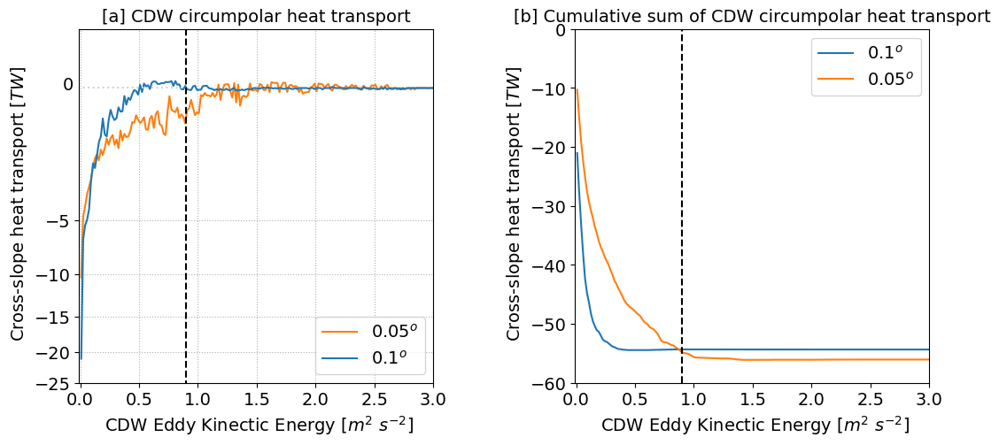

In [123]:


# Function x**(1/2)
def forward(x):
    return np.abs(x)**(1/2) * (x/np.abs(x))


def inverse(x):
    return x**2


plt.figure(figsize = (12,5))
plt.subplots_adjust(left=0.1, right=0.9, 
                    top=0.9, bottom=0.1, 
                    wspace=0.4, hspace=0.3)

#Notice that a plot manouver is done on top figure to represent the 0, that otherwise wouldnt appear due to the streched y axis
ax121 = plt.subplot(1,2,1)
HT_P005_CDW_EKEbins_σ.where(HT_P005_CDW_EKEbins_σ!=0).fillna(1e-20).plot(x='EKE_binned_m2s2_bin',label=r"0.05$^{o}$",color='tab:orange')
HT_P01_CDW_EKEbins_σ.where(HT_P01_CDW_EKEbins_σ!=0).fillna(1e-20).plot(x='EKE_binned_m2s2_bin',label=r"0.1$^{o}$",color='tab:blue')
plt.plot([-.1,.9],[1e-20,1e-20],color='lightgrey',linestyle=':')
plt.plot([0.9,0.9],[-40,1],color='black',linestyle='--')
plt.text(-.15,-1e-3,'0',color='black',fontsize = 14)
plt.yticks([-5,-4,-3,-2,-1,1e-20,1],labels= [-5,-4,-3,-2,-1,0,1],fontsize = 14)
plt.xticks(fontsize = 14)
plt.legend(fontsize = 14)
ax121.set_yscale('function', functions=(forward,inverse))
plt.xlabel(r' CDW Eddy Kinectic Energy [$m^2 \ s^{-2}$]',fontsize = 14)
plt.ylabel(r' Cross-slope heat transport [$TW$]',fontsize = 14)
plt.title(r'[a] CDW circumpolar heat transport',fontsize = 14)
plt.xlim(-.01,3)
plt.ylim(-25,1)
plt.grid(linestyle = ':')

ax122 = plt.subplot(1,2,2)
HT_P01_CDW_EKEbins_σ.cumsum().plot(x='EKE_binned_m2s2_bin',label=r"0.1$^{o}$")
HT_P005_CDW_EKEbins_σ.cumsum().plot(x='EKE_binned_m2s2_bin',label=r"0.05$^{o}$")
plt.plot([0.9,0.9],[-60,5],color='black',linestyle='--')
plt.yticks(fontsize = 14)
plt.xticks(fontsize = 14)
plt.legend(fontsize = 14)
plt.xlabel(r' CDW Eddy Kinectic Energy [$m^2 \ s^{-2}$]',fontsize = 14)
plt.ylabel(r' Cross-slope heat transport [$TW$]',fontsize = 14)
plt.xlim(-.01,3)
plt.ylim(-60,0)
plt.title(r'[b] Cumulative sum of CDW circumpolar heat transport',fontsize = 14)


plt.savefig(figdir+'EKECDWlayers_VS_CDW_CSHT.png',dpi=300,bbox_inches='tight')



The results only for the CDW layer seem to agree with theHypothesis that the higher resolution increase EKE activity in CDW layer, and the increase in CDW transport happes mostly in these higher energetic levels



CAn we explain that as a shift in the energetic spectrum? With higher resolution, we have more eddies, which leads (thermal) energy to dissipate into higher EKE levels. This better representation of the Energy cascate perhaps improve the estiamtes of CSHT towards the shelf by CDW

# Regional Analysis

In [33]:
#calculating the CSHT(rho) for panan01, in 10 degree bins
P01_binned_rho_10degbins=((p01_HT.binned_cross_slope_heat_trans + p01_HT.zonal_convergence)\
.mean('time')*p01_factor/1e12).groupby_bins('lon_bin_midpoints',bins=largebins).sum().compute()

P01_binned_rho_10degbins_noZC=((p01_HT.binned_cross_slope_heat_trans)\
.mean('time')*p01_factor/1e12).groupby_bins('lon_bin_midpoints',bins=largebins).sum().compute()

P01_binned_rho_10degbins_onlyZC=((p01_HT.zonal_convergence)\
.mean('time')*p01_factor/1e12).groupby_bins('lon_bin_midpoints',bins=largebins).sum().compute()

#calculating the CSHT(rho) for panan005, in 10 degree bins
P005_binned_rho_10degbins=((p005_HT.binned_cross_slope_heat_trans + p005_HT.zonal_convergence)\
.mean('time')*p005_factor/1e12).groupby_bins('lon_bin_midpoints',bins=largebins).sum().compute()

INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:_choose_method: method is None
INFO:flox:_choose_method: choosing preferred_method=blockwise
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: reindex is False
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:_choose_method: method is None
INFO:flox:_choose_method: choosing preferred_method=blockwise
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: reindex is False
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'flox'
INFO:flox:_choose_method: method is None
INFO:flox:_choose_method: choosing preferred_met

In [34]:
#mertz ice shelf
P01_binned_rho_Mertz = P01_binned_rho_10degbins.isel(lon_bin_midpoints_bins=5)
P005_binned_rho_Mertz = P005_binned_rho_10degbins.isel(lon_bin_midpoints_bins=5)

#cook ice shelf
P01_binned_rho_Cook = P01_binned_rho_10degbins.isel(lon_bin_midpoints_bins=slice(6,8)).sum('lon_bin_midpoints_bins')
P005_binned_rho_Cook = P005_binned_rho_10degbins.isel(lon_bin_midpoints_bins=slice(6,8)).sum('lon_bin_midpoints_bins')

#Rennick ice shelf
P01_binned_rho_Rennick = P01_binned_rho_10degbins.isel(lon_bin_midpoints_bins=8)
P005_binned_rho_Rennick = P005_binned_rho_10degbins.isel(lon_bin_midpoints_bins=8)

#Ross ice shelf
P01_binned_rho_Ross = P01_binned_rho_10degbins.isel(lon_bin_midpoints_bins=9)
P005_binned_rho_Ross = P005_binned_rho_10degbins.isel(lon_bin_midpoints_bins=9)

## Eastern Ross Sea

(1037.4, 1036.8)

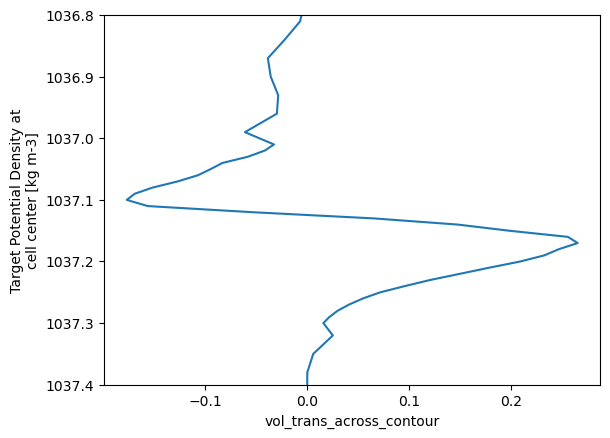

In [72]:
p01_MT.where(p01_MT.lon>= Ross_minlon).where(p01_MT.lon<= Ross_maxlon).vol_trans_across_contour.sum('contour_index').mean('time').plot(y='rho2_l')


plt.ylim(1037.4,1036.8)


### Ross East

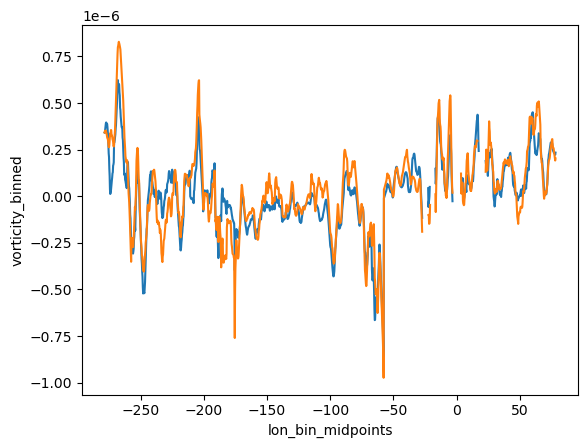

In [28]:
EKE01.vorticity_binned.mean('time').plot()
EKE005.vorticity_binned.mean('time').plot()

In [29]:
#edges of Ross bin
Ross_minlon=-190
Ross_maxlon=-180


In [74]:
# EKE in this Bin for panan01 ############################
#Getting the unbinned CSHT in Ross Bin, between -190, and -180
HT_P01_Ross = p01_HT.where(p01_HT.lon_bin_midpoints>Ross_minlon).where(p01_HT.lon_bin_midpoints<=Ross_maxlon)
HT_P01_Ross_noZC = (p01_factor*(HT_P01_Ross.binned_cross_slope_heat_trans))\
.compute().dropna('lon_bin_midpoints')
HT_P01_Ross_ZConly = (p01_factor*(HT_P01_Ross.zonal_convergence))\
.compute().dropna('lon_bin_midpoints')
HT_P01_Ross = (p01_factor*(HT_P01_Ross.binned_cross_slope_heat_trans+ HT_P01_Ross.zonal_convergence))\
.compute().dropna('lon_bin_midpoints')

#getting the mass transport in these density layers
p01_MT_ROSS = p01_MT.where(p01_MT.lon>= Ross_minlon).where(p01_MT.lon<= Ross_maxlon).vol_trans_across_contour.sum('contour_index').mean('time')


#Getting the EKE in Ross Bin, between -190, and -180
EKE_P01_Ross = EKE01
EKE_P01_Ross = EKE_P01_Ross.EKE_binned_m2s2.sel(lon_bin_midpoints=HT_P01_Ross.lon_bin_midpoints)

#binning CSHT according to EKE bins
EKE_bins=np.linspace(0,0.5,301)

HT_P01_Ross_EKEbins = histogram(EKE_P01_Ross.fillna(0), 
                          bins = EKE_bins, 
                          dim = ['rho2_l','lon_bin_midpoints'],
                          weights = HT_P01_Ross.fillna(0)).mean('time').compute()




# #panan005 ###################
HT_P005_Ross = p005_HT.where(p005_HT.lon_bin_midpoints>Ross_minlon).where(p005_HT.lon_bin_midpoints<=Ross_maxlon)
HT_P005_Ross_noZC = (p005_factor*(HT_P005_Ross.binned_cross_slope_heat_trans))\
.compute().dropna('lon_bin_midpoints')
HT_P005_Ross_ZConly = (p005_factor*(HT_P005_Ross.zonal_convergence))\
.compute().dropna('lon_bin_midpoints')

HT_P005_Ross = (p005_factor*(HT_P005_Ross.binned_cross_slope_heat_trans+ HT_P005_Ross.zonal_convergence))\
.compute().dropna('lon_bin_midpoints')

#getting the mass transport in these density layers
p005_MT_ROSS = p005_MT.where(p005_MT.lon>= Ross_minlon).where(p005_MT.lon<= Ross_maxlon).vol_trans_across_contour.sum('contour_index').mean('time')


#Getting the EKE in Ross Bin, between -190, and -180
EKE_P005_Ross = EKE005
EKE_P005_Ross = EKE_P005_Ross.EKE_binned_m2s2.sel(lon_bin_midpoints=HT_P005_Ross.lon_bin_midpoints)


#binning CSHT according to EKE bins
EKE_bins=np.linspace(0,0.5,301)

HT_P005_Ross_EKEbins = histogram(EKE_P005_Ross.fillna(0), 
                          bins = EKE_bins, 
                          dim = ['rho2_l','lon_bin_midpoints'],
                          weights = HT_P005_Ross.fillna(0)).mean('time').compute()


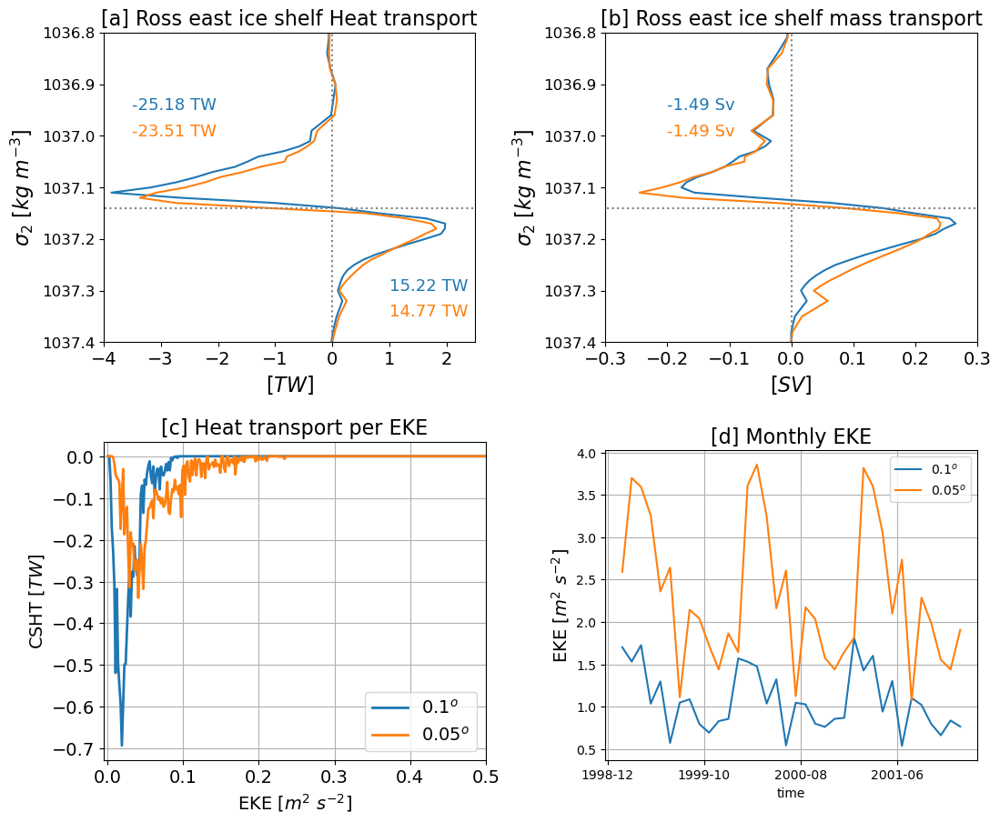

In [80]:
def forward(x):
    #return x**(1)
    return x**4


def inverse(x):
    return x**4



fig = plt.figure(figsize=(12,10))
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.35,
                    hspace=0.35)

# Ross
plt.subplot(2,2,1)
P01_binned_rho_Ross.plot(y='rho2_l')
P005_binned_rho_Ross.plot(y='rho2_l')
plt.plot([-30,20],[1037.14,1037.14],color='grey',linestyle=':')
plt.plot([0,0],[1030,1038],color='grey',linestyle=':')
plt.xlim(-4,2.5)

#total southward heat transports
P01_binned_rho_Ross_S = P01_binned_rho_Ross.where(P01_binned_rho_Ross<=0).sum().round(2).values
P005_binned_rho_Ross_S = P005_binned_rho_Ross.where(P005_binned_rho_Ross<=0).sum().round(2).values
P01_binned_rho_Ross_N = P01_binned_rho_Ross.where(P01_binned_rho_Ross>=0).sum().round(2).values
P005_binned_rho_Ross_N = P005_binned_rho_Ross.where(P005_binned_rho_Ross>=0).sum().round(2).values


plt.text(-3.5,1036.95,str(P01_binned_rho_Ross_S) + ' TW',color='tab:blue',fontsize=13)
plt.text(-3.5,1037,str(P005_binned_rho_Ross_S) + ' TW',color='tab:orange',fontsize=13)

plt.text(1,1037.3,str(P01_binned_rho_Ross_N) + ' TW',color='tab:blue',fontsize=13)
plt.text(1,1037.35,str(P005_binned_rho_Ross_N) + ' TW',color='tab:orange',fontsize=13)

plt.ylim(1037.4,1036.8)
plt.xlabel(r'[$TW$]',fontsize=16)
plt.ylabel(r'$\sigma_2$ [$kg\ m^{-3}$]',fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title(r'[a] Ross east ice shelf Heat transport',fontsize=16)

plt.subplot(2,2,2)
p01_MT_ROSS.plot(y='rho2_l',color='tab:blue')
p005_MT_ROSS.plot(y='rho2_l',color='tab:orange')


P01_binned_rho_Ross_MS = p01_MT_ROSS.where(p01_MT_ROSS<=0).sum().round(2).values
P005_binned_rho_Ross_MS = p01_MT_ROSS.where(p01_MT_ROSS<=0).sum().round(2).values


plt.text(-0.2,1036.95,str(P01_binned_rho_Ross_MS) + ' Sv',color='tab:blue',fontsize=13)
plt.text(-0.2,1037,str(P005_binned_rho_Ross_MS) + ' Sv',color='tab:orange',fontsize=13)



plt.ylim(1037.4,1036.8)
plt.plot([-30,20],[1037.14,1037.14],color='grey',linestyle=':')
plt.plot([0,0],[1030,1038],color='grey',linestyle=':')
plt.xlim(-.3,.3)
plt.xlabel(r'[$SV$]',fontsize=16)
plt.ylabel(r'$\sigma_2$ [$kg\ m^{-3}$]',fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title(r'[b] Ross east ice shelf mass transport',fontsize=16)


ax2 = fig.add_axes([0.1,0.1,0.35,0.35]) 

ax2.plot(HT_P01_Ross_EKEbins.EKE_binned_m2s2_bin,HT_P01_Ross_EKEbins/1e12,\
         linewidth=2,color='tab:blue',label=r'$0.1^{o}$')
ax2.plot(HT_P005_Ross_EKEbins.EKE_binned_m2s2_bin,HT_P005_Ross_EKEbins/1e12,\
         linewidth=2,color='tab:orange',label=r'$0.05^{o}$')
plt.xlim(-0.005,0.5)
plt.xlabel(r'EKE [$m^{2} \ s^{-2}$]',fontsize=14)
plt.ylabel(r'CSHT [$TW$]',fontsize=14)
plt.title(r'[c] Heat transport per EKE',fontsize=16)
plt.grid()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#ax2.set_yscale('function', functions=(forward, inverse))
plt.legend(fontsize=14)




plt.subplot(2,2,4)
EKE_P01_Ross.sum('lon_bin_midpoints').plot(color='tab:blue',label=r'$0.1^o$')
EKE_P005_Ross.sum('lon_bin_midpoints').plot(color='tab:orange',label=r'$0.05^o$')
plt.grid()
plt.ylabel(r'EKE [$m^{2} \ s^{-2}$]',fontsize=14)
plt.title(r'[d] Monthly EKE',fontsize=16)
plt.legend()


**Summary for lazy readers:**


It seems that the $0.05^o$ model has similar total southward mass transport in the region ( or perhaps even bigger SOuthward transport at CDW layer), but the heat transport is smaller in  the $0.05^o$ model. That is because waters crossing the isobath are just colder.

**EASTERN ROSS SEA BALANCE**

There is no cumsum in the plot [a] above for easier interpretation. in [a] the horizontal dotted line is the lightest density for DSW defined in Christina's results. The nortward transport in this bin is almost entirely contained in the densest layer, and in the DSW layer defined by Christina. 

Before, we found that the CSHT balance in the $0.05^o$ has $-1.2\ TW$ of incoming heat towards the shelf than the $0.1^o$ model. 




**DSW**: DSW seem to transport $0.44\ TW$ less heat out of the bin in the $0.05^o$, which would contribute to a CSHT sign opposite to what we find by the balance. However this change is very small compared to the Southward heat component (below)

**CDW and surface waters**: The transport heat to the shelf by this waters is much smaller on the $0.05^o$ simulation  (- Southward, $\sigma_2<34.14$, $-1.66\ TW$), entirely explaining the decrease poleward heat transport in this bin.

Nevertheless, DSW formation changes dont seem to explain most of the changes we see in the heat transport here.... We also have a reversed sign than expected, i.e., the simulation with higher resolution has less heat transport..... How can we begin to explain that? Maybe looking at EKE and CSHT together cpuld help me?

**EKE**


In terms of EKE, we can clearly see that the $0.05^o$ model has more EKE in this bin than the $0.1^o$ model. However, the heat transport distribution with EKE shows that the $0.05^o$  transpors heat in higher energetic levels, but at a lower heat transport. Perhaps that suggests that even tho we have more eddies on the $0.05^o$  model, the heat content of these eddies might be smaller. One way we can try to detangle that, it is to calculate the mass transport of eddies. If the total cross-slope mass transport increases with refined resolution, than the only way to explain the heat transport changes we find is by assuming that these eddies on the $0.05^o$  model are colder than the ones on the $0.1^o$ model.


Another way is to reproduce the plot C, but with heat content instead of heat transport... If the higher temperatures or heat content is concentrated in the lower parts of the EKE spectrum, then this spectral shift in the model would imply a lower heat transport towards the shelf.


______

Just out of curiosity, let's see how the SST changes between simulations, and the SS changes, for Christina

In [102]:
#panan sessions
session_p01 = cc.database.create_session('/home/156/wf4500/databases/access/panan01_HTsigma.db') #panan01
session_p005 = cc.database.create_session('/home/156/wf4500/databases/access/panan005_rerun.db') #panan00

In [103]:
%%time
#Calculating delta SSH in panan01
SST_01 = cc.querying.getvar('panan01_yr2000_HTsigma','thetao',session_p01,ncfile='%ocean_month_z%',\
                            start_time='1999-01-01',end_time='2001-12-31',chunks={}).isel(z_l=0).\
sel(yh=slice(-85,-55)).compute()
SST_01_mean = SST_01.mean('time')

SST_005 = cc.querying.getvar('panant-005-zstar-ACCESSyr2','thetao',session_p005,ncfile='%ocean_month_z%',\
                            start_time='1999-01-01',end_time='2001-12-31',chunks={}).isel(z_l=0).\
sel(yh=slice(-85,-55)).compute()
SST_005mean=SST_005.mean('time')



#SST01 into the 005 grid
SST_01_meaninto005 = SST_01_mean .interp(xh=SST_005mean.xh,yh=SST_005mean.yh)

CPU times: user 1min 8s, sys: 8.73 s, total: 1min 17s
Wall time: 1min 32s


In [104]:
%%time
#Calculating delta SSH in panan01
SSS_01 = cc.querying.getvar('panan01_yr2000_HTsigma','so',session_p01,ncfile='%ocean_month_z%',\
                            start_time='1999-01-01',end_time='2001-12-31',chunks={}).isel(z_l=0).\
sel(yh=slice(-85,-55)).compute()
SSS_01_mean = SSS_01.mean('time')

SSS_005 = cc.querying.getvar('panant-005-zstar-ACCESSyr2','so',session_p005,ncfile='%ocean_month_z%',\
                            start_time='1999-01-01',end_time='2001-12-31',chunks={}).isel(z_l=0).\
sel(yh=slice(-85,-55)).compute()
SSS_005mean=SSS_005.mean('time')



#SSS01 into the 005 grid
SSS_01_meaninto005 = SSS_01_mean .interp(xh=SSS_005mean.xh,yh=SSS_005mean.yh)


Exception ignored in: <function CachingFileManager.__del__ at 0x151b83918a60>
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 250, in __del__
    self.close(needs_lock=False)
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xarray/backends/file_manager.py", line 234, in close
    file.close()
  File "src/netCDF4/_netCDF4.pyx", line 2627, in netCDF4._netCDF4.Dataset.close
  File "src/netCDF4/_netCDF4.pyx", line 2590, in netCDF4._netCDF4.Dataset._close
  File "src/netCDF4/_netCDF4.pyx", line 2034, in netCDF4._netCDF4._ensure_nc_success
RuntimeError: NetCDF: Not a valid ID


CPU times: user 58.3 s, sys: 5.44 s, total: 1min 3s
Wall time: 1min 3s


Text(0.5, 1.0, '$\\Delta SST (0.05^{o} - 0.1^{o})$')

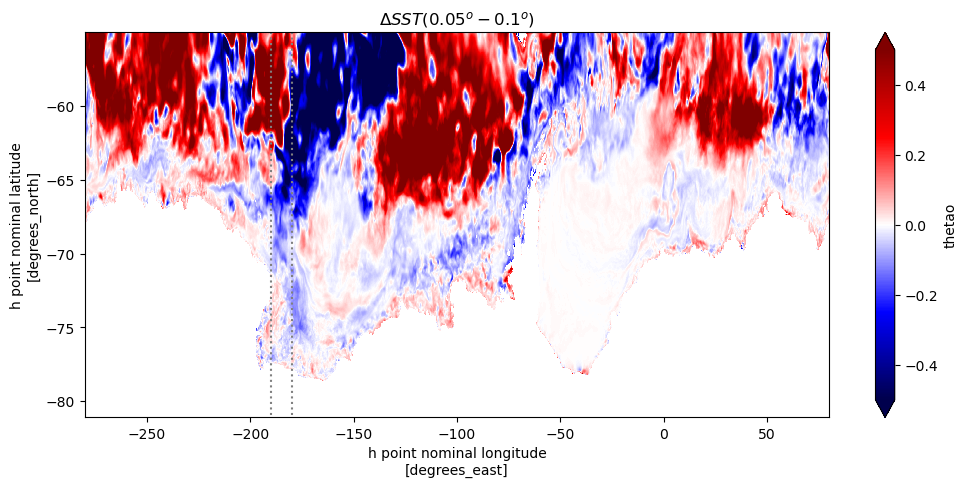

In [105]:
plt.figure(figsize=(12,5))
(SST_005mean - SST_01_meaninto005).plot(vmin=-0.5,vmax=0.5,cmap='seismic')
plt.plot([-190,-190],[-55,-85],linestyle=':',color='grey')
plt.plot([-180,-180],[-55,-85],linestyle=':',color='grey')
plt.title(r'$\Delta SST (0.05^{o} - 0.1^{o})$')

Text(0.5, 1.0, '$\\Delta SSS (0.05^{o} - 0.1^{o})$')

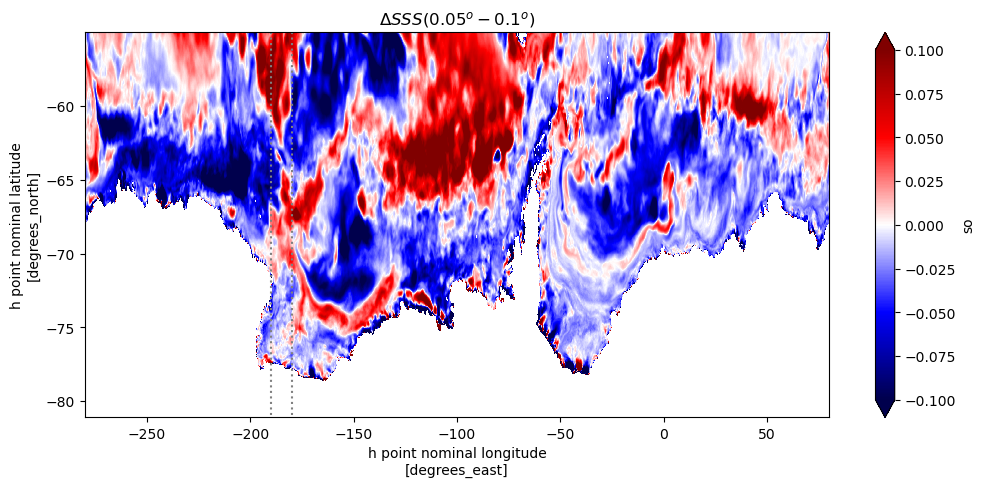

In [106]:
plt.figure(figsize=(12,5))
(SSS_005mean - SSS_01_meaninto005).plot(vmin=-0.1,vmax=0.1,cmap='seismic')
plt.plot([-190,-190],[-55,-85],linestyle=':',color='grey')
plt.plot([-180,-180],[-55,-85],linestyle=':',color='grey')
plt.title(r'$\Delta SSS (0.05^{o} - 0.1^{o})$')

Surface waters just off the shelf indeed seem to be colder in panan005


I think the direction I am going, and the results I am finding might not be publishable. Perhaps we will have to look at processes other than the CSHT

### Mertz East

### Stopped here

Text(0.5, 1.0, '[d] Ross ice shelf')

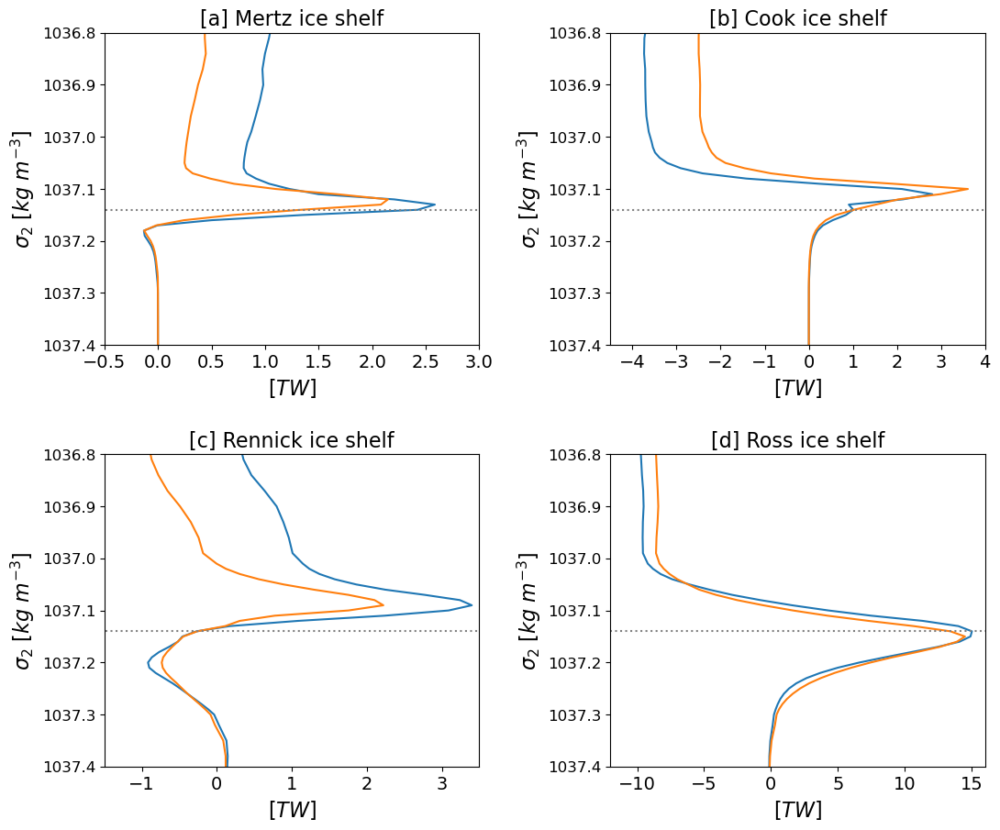

In [289]:
fig = plt.figure(figsize=(12,10))
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.35,
                    hspace=0.35)

# Mertz
plt.subplot(2,2,1)
P01_binned_rho_Mertz[::-1].cumsum()[::-1].plot(y='rho2_l')
P005_binned_rho_Mertz[::-1].cumsum()[::-1].plot(y='rho2_l')
plt.plot([-20,20],[1037.14,1037.14],color='grey',linestyle=':')
plt.xlim(-.5,3)
plt.ylim(1037.4,1036.8)
plt.xlabel(r'[$TW$]',fontsize=16)
plt.ylabel(r'$\sigma_2$ [$kg\ m^{-3}$]',fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title(r'[a] Mertz ice shelf',fontsize=16)

#Cook
plt.subplot(2,2,2)
P01_binned_rho_Cook[::-1].cumsum()[::-1].plot(y='rho2_l')
P005_binned_rho_Cook[::-1].cumsum()[::-1].plot(y='rho2_l')
plt.plot([-20,20],[1037.14,1037.14],color='grey',linestyle=':')
plt.xlim(-4.5,4)
plt.ylim(1037.4,1036.8)
plt.xlabel(r'[$TW$]',fontsize=16)
plt.ylabel(r'$\sigma_2$ [$kg\ m^{-3}$]',fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title(r'[b] Cook ice shelf',fontsize=16)

#Rennick
plt.subplot(2,2,3)
P01_binned_rho_Rennick[::-1].cumsum()[::-1].plot(y='rho2_l')
P005_binned_rho_Rennick[::-1].cumsum()[::-1].plot(y='rho2_l')
plt.plot([-20,20],[1037.14,1037.14],color='grey',linestyle=':')
plt.xlim(-1.5,3.5)
plt.ylim(1037.4,1036.8)
plt.xlabel(r'[$TW$]',fontsize=16)
plt.ylabel(r'$\sigma_2$ [$kg\ m^{-3}$]',fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title(r'[c] Rennick ice shelf',fontsize=16)

#ROSS
plt.subplot(2,2,4)
P01_binned_rho_Ross[::-1].cumsum()[::-1].plot(y='rho2_l')
P005_binned_rho_Ross[::-1].cumsum()[::-1].plot(y='rho2_l')
plt.plot([-20,20],[1037.14,1037.14],color='grey',linestyle=':')
plt.xlim(-12,16)

plt.ylim(1037.4,1036.8)
plt.xlabel(r'[$TW$]',fontsize=16)
plt.ylabel(r'$\sigma_2$ [$kg\ m^{-3}$]',fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=12)
plt.title(r'[d] Ross ice shelf',fontsize=16)

In Mertz and in Ross shelves, indeed it seems to me that the changes are mostly driven by DSW formation. In the other shelves it looks like it is a mix between changes in DSW overflow and changes in incoming heat. 



For the DSW cases, the heat could be incoming through linear flows or through Eddies too I think. It might be worth calculating the EKE, and then cross-referencing with then heat transport. do we see increases in the EKE being accopanied by the increases in Heat Transport? Also, what is the direction of the HT by EKE in each one of these shelves?

(-26.0, 16.0)

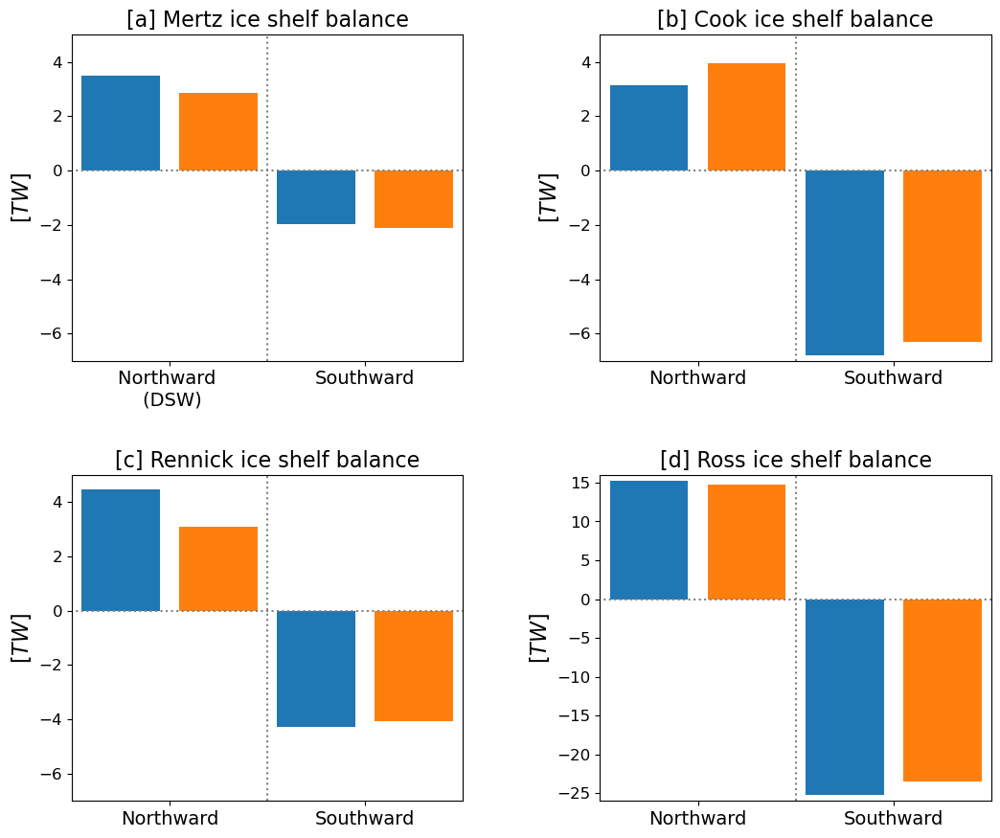

In [283]:
fig = plt.figure(figsize=(12,10))
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.35,
                    hspace=0.35)

# Mertz
plt.subplot(2,2,1)
#Northward component
plt.bar(np.arange(0,2),\
        [P01_binned_rho_Mertz.where(P01_binned_rho_Mertz>0).sum(), \
         P005_binned_rho_Mertz.where(P005_binned_rho_Mertz>0).sum()],\
       color=['tab:blue','tab:orange'])

#Southward component
plt.bar(np.arange(2,4),\
        [P01_binned_rho_Mertz.where(P01_binned_rho_Mertz<0).sum(), \
         P005_binned_rho_Mertz.where(P005_binned_rho_Mertz<0).sum()],\
       color=['tab:blue','tab:orange'])
plt.ylabel(r'[$TW$]',fontsize=16)

plt.yticks(fontsize=12)
plt.title(r'[a] Mertz ice shelf balance',fontsize=16)

plt.xticks(ticks=[0.5,2.5],labels=['Northward \n (DSW)','Southward'],fontsize=14)
plt.plot([-1,4],[0,0],linestyle=':',color='grey')
plt.plot([1.5,1.5],[-7,5],linestyle=':',color='grey')
plt.xlim(-0.5,3.5)
plt.ylim(-7,5)





# Cook
plt.subplot(2,2,2)
#Northward component
plt.bar(np.arange(0,2),\
        [P01_binned_rho_Cook.where(P01_binned_rho_Cook>0).sum(), \
         P005_binned_rho_Cook.where(P005_binned_rho_Cook>0).sum()],\
       color=['tab:blue','tab:orange'])

#Southward component
plt.bar(np.arange(2,4),\
        [P01_binned_rho_Cook.where(P01_binned_rho_Cook<0).sum(), \
         P005_binned_rho_Cook.where(P005_binned_rho_Cook<0).sum()],\
       color=['tab:blue','tab:orange'])
plt.ylabel(r'[$TW$]',fontsize=16)

plt.yticks(fontsize=12)
plt.title(r'[b] Cook ice shelf balance',fontsize=16)

plt.xticks(ticks=[0.5,2.5],labels=['Northward' ,'Southward'],fontsize=14)
plt.plot([-1,4],[0,0],linestyle=':',color='grey')
plt.plot([1.5,1.5],[-7,5],linestyle=':',color='grey')
plt.xlim(-0.5,3.5)
plt.ylim(-7,5)




# Rennick
plt.subplot(2,2,3)
#Northward component
plt.bar(np.arange(0,2),\
        [P01_binned_rho_Rennick.where(P01_binned_rho_Rennick>0).sum(), \
         P005_binned_rho_Rennick.where(P005_binned_rho_Rennick>0).sum()],\
       color=['tab:blue','tab:orange'])

#Southward component
plt.bar(np.arange(2,4),\
        [P01_binned_rho_Rennick.where(P01_binned_rho_Rennick<0).sum(), \
         P005_binned_rho_Rennick.where(P005_binned_rho_Rennick<0).sum()],\
       color=['tab:blue','tab:orange'])
plt.ylabel(r'[$TW$]',fontsize=16)

plt.yticks(fontsize=12)
plt.title(r'[c] Rennick ice shelf balance',fontsize=16)

plt.xticks(ticks=[0.5,2.5],labels=['Northward' ,'Southward'],fontsize=14)
plt.plot([-1,4],[0,0],linestyle=':',color='grey')
plt.plot([1.5,1.5],[-7,5],linestyle=':',color='grey')
plt.xlim(-0.5,3.5)
plt.ylim(-7,5)


# Ross
plt.subplot(2,2,4)
#Northward component
plt.bar(np.arange(0,2),\
        [P01_binned_rho_Ross.where(P01_binned_rho_Ross>0).sum(), \
         P005_binned_rho_Ross.where(P005_binned_rho_Ross>0).sum()],\
       color=['tab:blue','tab:orange'])

#Southward component
plt.bar(np.arange(2,4),\
        [P01_binned_rho_Ross.where(P01_binned_rho_Ross<0).sum(), \
         P005_binned_rho_Ross.where(P005_binned_rho_Ross<0).sum()],\
       color=['tab:blue','tab:orange'])
plt.ylabel(r'[$TW$]',fontsize=16)

plt.yticks(fontsize=12)
plt.title(r'[d] Ross ice shelf balance',fontsize=16)

plt.xticks(ticks=[0.5,2.5],labels=['Northward' ,'Southward'],fontsize=14)
plt.plot([-1,4],[0,0],linestyle=':',color='grey')
plt.plot([1.5,1.5],[-26,16],linestyle=':',color='grey')
plt.xlim(-0.5,3.5)
plt.ylim(-26,16)

The Northward transport in the Mertz, Cook and ROss ice shelves above can be considered to be mostly due to the Dense water outflow, since they happen in the densest layers along the isobat (figure before)

## Stopped here!

In [40]:
# fig = plt.figure(figsize=(12,6))

# plt.plot(P005_binned_lon,(P005_binned_CSHT_mean+P005_binned_ZC_mean).cumsum()*p005_factor/1e12 - (P01_binned_CSHT_mean+P01_binned_ZC_mean).cumsum()*p01_factor/1e12\
#          ,color="purple",label=r"0.05$^{o}$ - 0.1$^{o}$ : " + str(p005_total - p01_total) + " TW")
# plt.plot(P0025_binned_lon,(P0025_binned_CSHT_mean+P0025_binned_ZC_mean).cumsum()*p0025_factor/1e12 -(P005_binned_CSHT_mean+P005_binned_ZC_mean).cumsum()*p005_factor/1e12\
#          ,color="gold",label=r"0.025$^{o}$ - 0.05$^{o}$ : " + str(p0025_total - p005_total) + " TW")

# plt.xlabel('Longitude'); plt.ylabel('Cross Slope Heat Transport difference[TW]'); plt.title('Annual mean')
# plt.grid()
# plt.legend()
# plt.xlim(-280,80)
#plt.savefig(figdir+'RESCOMP_binneddifference_HTplusZC_cumsum_Annual_mean.png',dpi=300,bbox_inches='tight')

In [20]:
#how much the CSHT differs at the edge of the inner Ross sea (-150)?
Ross_cumsum_diff= (((P005_binned_CSHT_mean+P005_binned_ZC_mean).cumsum()*p005_factor/1e12).sel(lon_bin_midpoints=-150, method='nearest')) - (((P01_binned_CSHT_mean+P01_binned_ZC_mean).cumsum()*p01_factor/1e12).sel(lon_bin_midpoints=-150, method='nearest') ) 
print( "CSHT differs by " + str(int(Ross_cumsum_diff)) + " TW, when summing only until the edge of the Ross Sea at 150 West")


CSHT differs by -16 TW, when summing only until the edge of the Ross Sea at 150 West


### Seasonal Cycle changes

Is the difference in CSHT between simulations spread uniformly accross seasons? Or is it summer based ?(related to surface ekman transport)

In [21]:
#temporal means for panan01
P01_unbinned_HT_season=P01_unbinned_HT.groupby('time.month').mean('time').sum('contour_index').load()
P01_binned_CSHT_season=P01_binned_CSHT.groupby('time.month').mean('time').sum('lon_bin_midpoints').load()
P01_binned_ZC_season=P01_binned_ZC.groupby('time.month').mean('time').sum('lon_bin_midpoints').load()

#temporal means for panan005
P005_unbinned_HT_season=P005_unbinned_HT.groupby('time.month').mean('time').sum('contour_index').load()
P005_binned_CSHT_season=P005_binned_CSHT.groupby('time.month').mean('time').sum('lon_bin_midpoints').load()
P005_binned_ZC_season=P005_binned_ZC.groupby('time.month').mean('time').sum('lon_bin_midpoints').load()

#temporal means for panan0025
P0025_unbinned_HT_season=P0025_unbinned_HT.sum('contour_index').load()
P0025_binned_CSHT_season=P0025_binned_CSHT.sum('lon_bin_midpoints').load()
P0025_binned_ZC_season=P0025_binned_ZC.sum('lon_bin_midpoints').load()

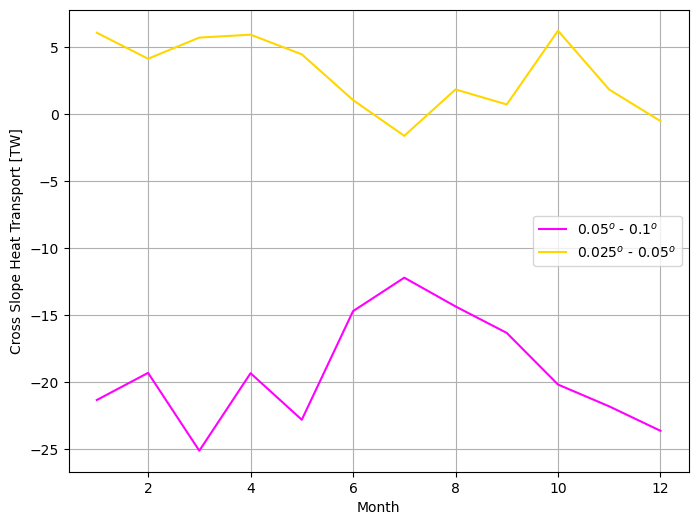

In [22]:
fig = plt.figure(figsize=(8,6))

#plt.subplot(1,2,1)
plt.plot(np.arange(1,13),(np.array(P005_unbinned_HT_season/1e12) - np.array(P01_unbinned_HT_season/1e12)),color="magenta",label=r"0.05$^{o}$ - 0.1$^{o}$")
plt.plot(np.arange(1,13),(np.array(P0025_unbinned_HT_season/1e12) - np.array(P005_unbinned_HT_season/1e12)),color="gold",label=r"0.025$^{o}$ - 0.05$^{o}$")
plt.xlabel('Month'); plt.ylabel('Cross Slope Heat Transport [TW]')
plt.grid()
plt.legend()

plt.savefig(figdir+'RESCOMP_seasonalCSHT.png',dpi=300,bbox_inches='tight')

Most of the difference in CSHT here happens between September and March, so definetly in the summer and spring. Once again, the bulk difference occurs when comparyinf 0.05 to 0.1

### Cross-slope-heat-transport in different depth layers

One important decision we need to make here is where we gonna set the cutout depth for the surface fluxes. Maybe analysing density surfaces can help us. The series of steps you will use for it will be...

[a] In a annual mean map of surface potrho0, check which contour gets close to the ANtarctic Margin in a more consistent way across all longitudes (if there is)

In [23]:
session = cc.database.create_session()
session_BU = cc.database.create_session('/home/156/wf4500/databases/access/panan_BU.db')

In [24]:
lat_range = slice(-90,-59)
start_time='2000-01'
end_time='2000-12'
time_slice=slice(start_time,end_time)

In [25]:
exp01 = 'panant-01-zstar-ACCESSyr2'
exp005 = 'panant-005-zstar-ACCESSyr2'
exp0025 = 'panant-0025-zstar-ACCESSyr2'

MLD_01 = cc.querying.getvar(exp01,'mlotst',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).mean('time')
MLD_005 = cc.querying.getvar(exp005,'mlotst',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).mean('time')


0.3.0
0.3.0


/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(


0.3.0


/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(


0.3.0


/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(


0.3.0


/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(


0.3.0
0.3.0


/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(


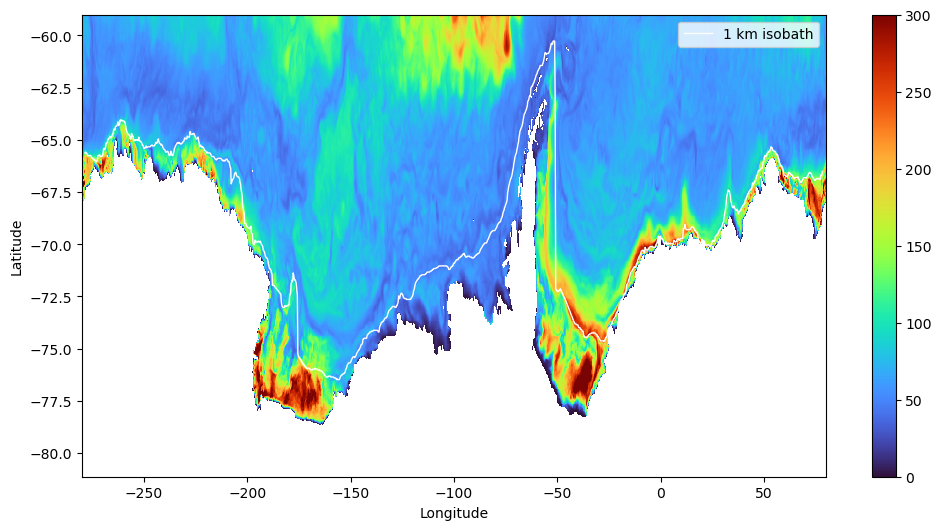

In [26]:
fig = plt.figure(figsize=(12,6))
plt.pcolormesh(MLD_01.xh,MLD_01.yh,MLD_01,vmin=0,vmax=300,cmap='turbo')
plt.colorbar()

plt.plot(P01_binned_lon,P01_binned_lat,color='white',linewidth=1,label='1 km isobath')
plt.xlabel('Longitude'); plt.ylabel('Latitude'); 
plt.legend()

In [27]:
#Extracting densities along the contour
MLD_01_1km= MLD_01.sel(xh=P01_binned_lon,yh=P01_binned_lat,method='nearest')
MLD_005_1km= MLD_005.sel(xh=P005_binned_lon,yh=P005_binned_lat,method='nearest')



In [28]:
#temporal means for panan01
P01_binned_CSHT_z=p01_HT.binned_cross_slope_heat_trans.groupby('time.month').mean('time').mean('month')
P01_binned_ZC_z=p01_HT.zonal_convergence.groupby('time.month').mean('time').mean('month')
P01_binned_CSHT_ZC_z=(P01_binned_CSHT_z+P01_binned_ZC_z)*p01_factor


#temporal means for panan005
P005_binned_CSHT_z=p005_HT.binned_cross_slope_heat_trans.groupby('time.month').mean('time').mean('month')
P005_binned_ZC_z=p005_HT.zonal_convergence.groupby('time.month').mean('time').mean('month')
P005_binned_CSHT_ZC_z=(P005_binned_CSHT_z+P005_binned_ZC_z)*p005_factor


#temporal means for panan0025
P0025_binned_CSHT_z=p0025_HT.binned_cross_slope_heat_trans.mean('time')
P0025_binned_ZC_z=p0025_HT.zonal_convergence.mean('time')
P0025_binned_CSHT_ZC_z=(P0025_binned_CSHT_z+P0025_binned_ZC_z)*p0025_factor

In [29]:
MLD_01_1km.mean().values

array(115.093094, dtype=float32)

(1500.0, 0.0)

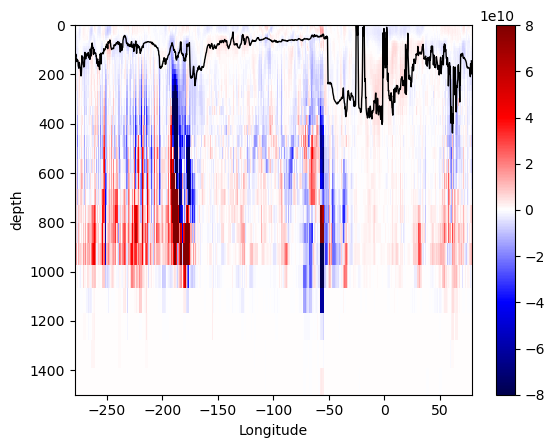

In [30]:
#P01_binned_CSHT_ZC_z.plot()
plt.pcolormesh(P01_binned_CSHT_ZC_z.lon_bin_midpoints,P01_binned_CSHT_ZC_z.z_l,
               P01_binned_CSHT_ZC_z,vmin=-0.8e11,vmax=0.8e11,cmap='seismic')

plt.ylabel('depth'); plt.xlabel('Longitude')
plt.colorbar()

plt.plot(MLD_01_1km.lon_bin_midpoints,MLD_01_1km*1.2,color='black',linewidth=1)
plt.ylim(1500,0)

In [31]:
cutout_depth=MLD_01_1km*1.2

In [32]:
#unbinned MLD
MLD_unbinned01_1km= MLD_01.sel(xh=P01_unbinned_lon,yh=P01_unbinned_lat,method='nearest')
MLD_unbinned005_1km= MLD_005.sel(xh=P005_unbinned_lon,yh=P005_unbinned_lat,method='nearest')
#cutour depth in unbinned data
cutout_depth_unbinned01=MLD_unbinned01_1km*1.2
cutout_depth_unbinned005=MLD_unbinned005_1km*1.2

In [33]:
#temporal means for panan01, unbinned
P01_unbinned_HT_z=p01_HT.unbinned_heat_transp_across_contour.groupby('time.month').mean('time').mean('month')

(1500.0, 0.0)

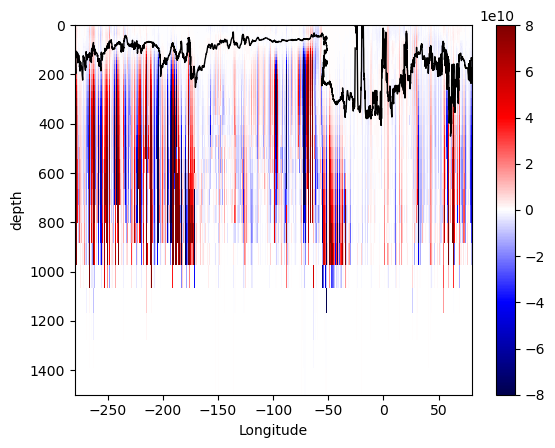

In [34]:
#P01_binned_CSHT_ZC_z.plot()
plt.pcolormesh(P01_unbinned_lon,P01_unbinned_HT_z.z_l,
               P01_unbinned_HT_z,vmin=-0.8e11,vmax=0.8e11,cmap='seismic')

plt.ylabel('depth'); plt.xlabel('Longitude')
plt.colorbar()

plt.plot(P01_unbinned_lon,MLD_unbinned01_1km*1.2,color='black',linewidth=1)
plt.ylim(1500,0)

Unbinned and binned MLD seem similar

### Timeseries of cross-slope-heat-transport

In [35]:
P01_total_daily = P01_unbinned_HT.sum('contour_index')
P005_total_daily = P005_unbinned_HT.sum('contour_index')
P0025_total_daily = P0025_unbinned_HT.sum('contour_index') # this is monthly

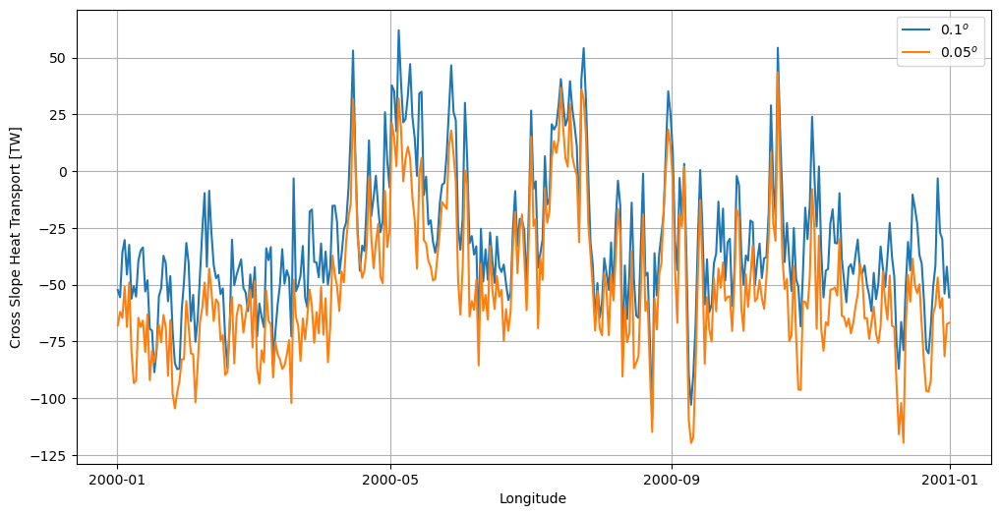

In [36]:
fig = plt.figure(figsize=(12,6))

(P01_total_daily/1e12).plot(label=r"0.1$^{o}$")
((P005_total_daily/1e12)).plot(label=r"0.05$^{o}$")
plt.xlabel('Longitude'); plt.ylabel('Cross Slope Heat Transport [TW]'); 
plt.grid()
plt.legend()
plt.savefig(figdir+'RESCOMP_dailyCSHT.png',dpi=300)

In [37]:
ht_OM2 = cc.querying.getvar('01deg_jra55v13_ryf9091','ht' , session,n=1).sel(yt_ocean=lat_slice)
land_mask_OM2 = np.squeeze(ht_OM2.values)*0
land_mask_OM2[np.isnan(land_mask_OM2)] = 1
land_mask_OM2 = np.where(land_mask_OM2==1,land_mask_OM2,np.nan)
land_mask_masked_OM2 = np.ma.masked_where((land_mask_OM2==0),land_mask_OM2)
# make land go all the way to -90S:
land_mask_lat_OM2 = ht_OM2.yt_ocean.values
land_mask_lat_OM2[0] = -90

#### Spectral analysis of daily data

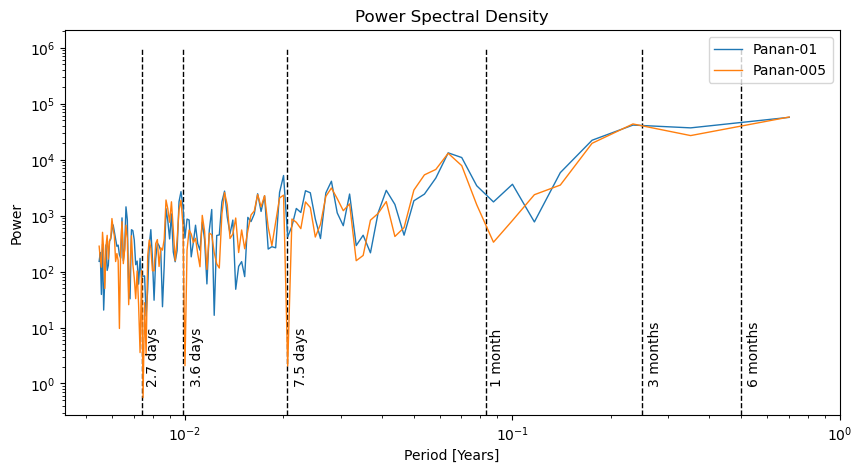

In [38]:
from scipy import signal
# Plot the power spectral density
plt.figure(figsize=(10, 5))


# Compute the power spectral density
frequencies01, psd01 = signal.welch(P01_total_daily/1e12, fs=1)
frequencies005, psd005 = signal.welch(P005_total_daily/1e12, fs=1)
plt.loglog(1/frequencies01/365, psd01, label = 'Panan-01',lw=1)
plt.loglog(1/frequencies005/365, psd005, label = 'Panan-005',lw=1)


plt.title('Power Spectral Density')
plt.vlines(0.5,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text(0.52,1,'6 months',rotation=90)
plt.vlines(1/4,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text(0.26,1,'3 months',rotation=90)
plt.vlines(1/12,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/12)+0.002,1,'1 month',rotation=90)
plt.vlines((1/365)*7.5,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*7.5+0.001,1,'7.5 days',rotation=90)
plt.vlines((1/365)*3.6,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*3.6+0.0005,1,'3.6 days',rotation=90)
plt.vlines((1/365)*2.7,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*2.7+0.0002,1,'2.7 days',rotation=90)
#plt.vlines((1/365)*2.25,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1);


plt.xlabel('Period [Years]')
plt.ylabel('Power')
plt.xlim(0,1)
# plt.grid()
plt.legend()
plt.savefig(figdir+'RES_CSHT_spectrum.png',dpi=300)

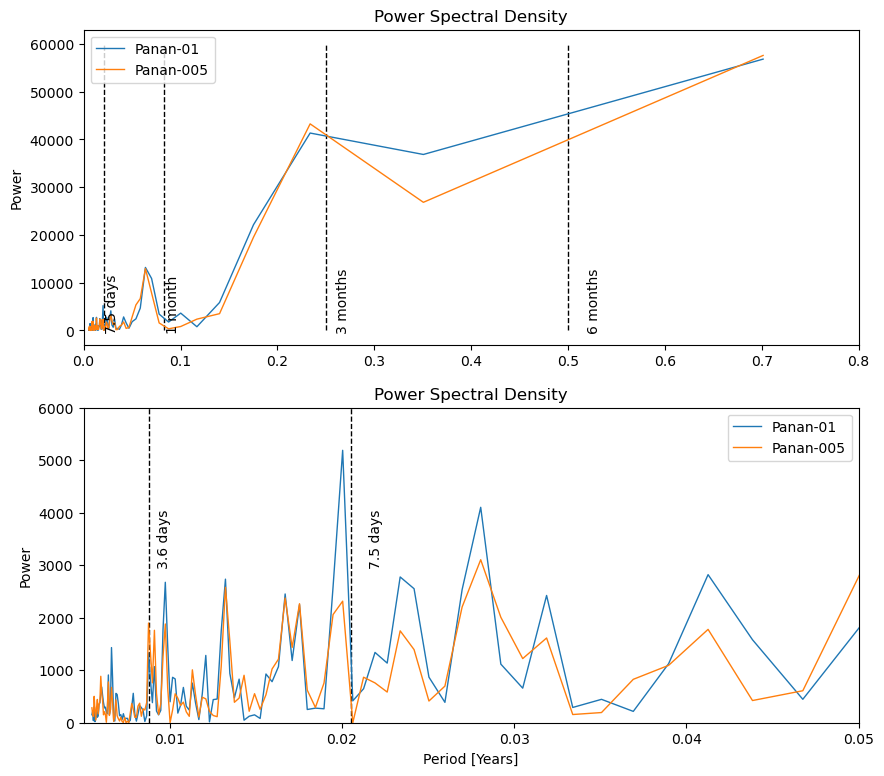

In [39]:
from scipy import signal
# Plot the power spectral density
plt.figure(figsize=(10, 9))

plt.subplot(2,1,1)
# Compute the power spectral density
frequencies01, psd01 = signal.welch(P01_total_daily/1e12, fs=1)
frequencies005, psd005 = signal.welch(P005_total_daily/1e12, fs=1)
plt.plot(1/frequencies01/365, psd01, label = 'Panan-01',lw=1)
plt.plot(1/frequencies005/365, psd005, label = 'Panan-005',lw=1)


plt.title('Power Spectral Density')
plt.vlines(0.5,0,60000, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text(0.52,1,'6 months',rotation=90)
plt.vlines(1/4,0,60000, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text(0.26,1,'3 months',rotation=90)
plt.vlines(1/12,0,60000, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/12)+0.002,1,'1 month',rotation=90)
plt.vlines((1/365)*7.5,0,60000, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*7.5+0.001,1,'7.5 days',rotation=90)
# plt.vlines((1/365)*3.6,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*3.6+0.0005,1,'3.6 days',rotation=90)
# plt.vlines((1/365)*2.7,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*2.7+0.0002,1,'2.7 days',rotation=90)
#plt.vlines((1/365)*2.25,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1);


#plt.xlabel('Period [Years]')
plt.ylabel('Power')
plt.xlim(0,0.8)
# plt.grid()
plt.legend()



plt.subplot(2,1,2)
# Compute the power spectral density
plt.plot(1/frequencies01/365, psd01, label = 'Panan-01',lw=1)
plt.plot(1/frequencies005/365, psd005, label = 'Panan-005',lw=1)


plt.title('Power Spectral Density')
plt.vlines((1/365)*7.5,0,60000, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*7.5+0.001,3000,'7.5 days',rotation=90)
plt.vlines((1/365)*3.2,0,60000, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*3.2+0.0005,3000,'3.6 days',rotation=90)
#plt.vlines((1/365)*2.7,0,60000, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*2.7+0.0002,3000,'2.7 days',rotation=90)
#plt.vlines((1/365)*2.25,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1);


plt.xlabel('Period [Years]')
plt.ylabel('Power')
plt.xlim(0.005,0.05)
plt.ylim(0,6000)
# plt.grid()
plt.legend()


plt.savefig(figdir+'RESlinear_CSHT_spectrum.png',dpi=300,bbox_inches='tight')
plt.show()

Ok, we found this results, in which it shows that at very short timescales ( a week or shorter) panan005 has less variability than pana01. **does that make any sense?** I guess that could mean that...

...The difference in CSHT might come from the mean CSHT, instead of the eddy one. In fact when we see the timeseries of the daily data, the variability seem to be roughly the same, with the main difference being panan005 being shifted to more negative CSHT values. But what does that mean in terms of physical processes? 

[a] Maybe a finer resolution somehow allows more heat to get into the ocean somewhere north of the 1km isobath. That would just lead to more heat transport towards Antarctica in some linear flows? (i.e., same or less ammount of water entering coast through Gyres, but with higher temperatures)

[b] Panan01 and Panan005 differ in terms of bathymetry products, could taht somoehow change the total CSHT?

In [40]:
T_01 = cc.querying.getvar(exp01,'thetao',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).mean('time')
T_005 = cc.querying.getvar(exp005,'thetao',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).mean('time')
T_0025 = cc.querying.getvar(exp0025,'thetao',session_BU,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).mean('time')

V_01 = cc.querying.getvar(exp01,'volcello',session,ncfile='%month_z%',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).mean('time')
V_005 = cc.querying.getvar(exp005,'volcello',session,ncfile='%month_z%',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).mean('time')
V_0025 = cc.querying.getvar(exp0025,'volcello',session_BU,ncfile='%month_z%',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).mean('time')

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3

Mean temperature difference by layers, upper 200m

In [41]:
V_01=V_01.load()

In [42]:
T_005interpsum0=T_005.interp(xh=T_01.xh).interp(yh=T_01.yh)
T_005interpsum=(T_005interpsum0*V_01).sel(z_l=slice(0,200)).sum('z_l') / (V_01).sel(z_l=slice(0,200)).sum('z_l') 
T_01sum=(T_01*V_01).sel(z_l=slice(0,200)).sum('z_l') / (V_01).sel(z_l=slice(0,200)).sum('z_l') 

deltaT_200 = (T_005interpsum - T_01sum).load()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
 

In [43]:
T_005interpsum1=(T_005interpsum0*V_01).sel(z_l=slice(200,600)).sum('z_l') / (V_01).sel(z_l=slice(200,600)).sum('z_l') 
T_01sum1=(T_01*V_01).sel(z_l=slice(200,600)).sum('z_l') / (V_01).sel(z_l=slice(200,600)).sum('z_l') 

deltaT_600 = (T_005interpsum1 - T_01sum1).load()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


In [44]:
T_005interpsum2=(T_005interpsum0*V_01).sel(z_l=slice(600,1000)).sum('z_l') / (V_01).sel(z_l=slice(600,1000)).sum('z_l') 
T_01sum2=(T_01*V_01).sel(z_l=slice(600,1000)).sum('z_l') / (V_01).sel(z_l=slice(600,1000)).sum('z_l') 

deltaT_1000 = (T_005interpsum2 - T_01sum2).load()

In [45]:
T_005interpsum3=(T_005interpsum0*V_01).sel(z_l=slice(1000,6000)).sum('z_l') / (V_01).sel(z_l=slice(1000,6000)).sum('z_l') 
T_01sum3=(T_01*V_01).sel(z_l=slice(1000,6000)).sum('z_l') / (V_01).sel(z_l=slice(1000,6000)).sum('z_l') 

deltaT_bottom = (T_005interpsum3 - T_01sum3).load()

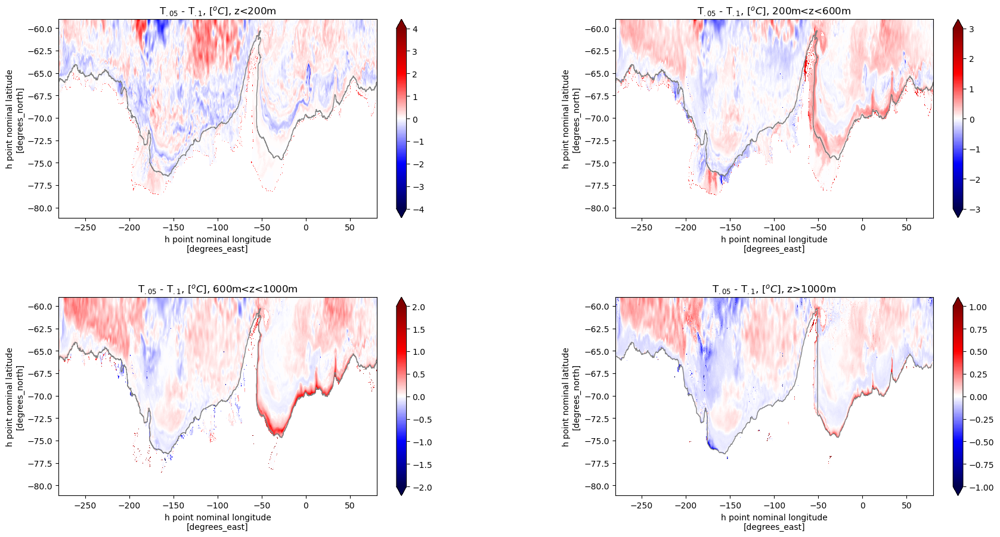

In [46]:
plt.figure(figsize=(20, 10))
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

plt.subplot(2,2,1)
deltaT_200.plot(vmin=-4,vmax=4,cmap='seismic',extend='both')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'grey',lw=1)
plt.title(r"T$_{.05}$ - T$_{.1}$, [$^oC$], z<200m")

plt.subplot(2,2,2)
deltaT_600.plot(vmin=-3,vmax=3,cmap='seismic',extend='both')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'grey',lw=1)
plt.title(r"T$_{.05}$ - T$_{.1}$, [$^oC$], 200m<z<600m")

plt.subplot(2,2,3)
deltaT_1000.plot(vmin=-2,vmax=2,cmap='seismic',extend='both')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'grey',lw=1)
plt.title(r"T$_{.05}$ - T$_{.1}$, [$^oC$], 600m<z<1000m")

plt.subplot(2,2,4)
deltaT_bottom.plot(vmin=-1,vmax=1,cmap='seismic',extend='both')
plt.plot(P01_binned_lon,P01_binned_lat,'grey',lw=1)
plt.title(r"T$_{.05}$ - T$_{.1}$, [$^oC$], z>1000m")

plt.savefig(figdir+'RES_temp_diff_005and01.png',dpi=300,bbox_inches='tight')

These temperature anomalies look a lot like the pathway of DSW export that I've seen before. Do we have regional differences in DSW formation or export?  **Christina Schmidt plots for Panan shows that mass transport of Dense Shelf Waters in the Weddell Sea across the 1km and 2.5 km isobath, are bigger in panan005 than in panan01. Based on Adele's paper, stronger DSW formation invites strogner gross-slope heat transport towards the shelf. So perhaps that is what is going on here? How can we test that?**

Perhaps might be worth to check the age at the bottom?

In [47]:
#importing age
age_01 = cc.querying.getvar(exp01,'agessc',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).isel(time=-1)
age_005 = cc.querying.getvar(exp005,'agessc',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).isel(time=-1)


/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3

In [48]:
#getting age on the bottom for panan01
depth_array = age_01 * 0 + age_01.z_l
max_depth = depth_array.max(dim = 'z_l', skipna= True)
ageob_01 = age_01.where(depth_array.z_l >= max_depth)
ageob_01 = ageob_01.sum(dim = 'z_l').load()



#getting age on the bottom for panan01
depth_array = age_005 * 0 + age_005.z_l
max_depth = depth_array.max(dim = 'z_l', skipna= True)
ageob_005 = age_005.where(depth_array.z_l >= max_depth)
ageob_005 = ageob_005.sum(dim = 'z_l').load()

ageob_005interp= ageob_005.interp(xh=ageob_01.xh).interp(yh=ageob_01 .yh).load()



agediff=ageob_005interp - ageob_01

Text(0.5, 1.0, 'Age$^{bottom} _{.05}$ - Age$^{bottom} _{.1}$, [$yrs$]')

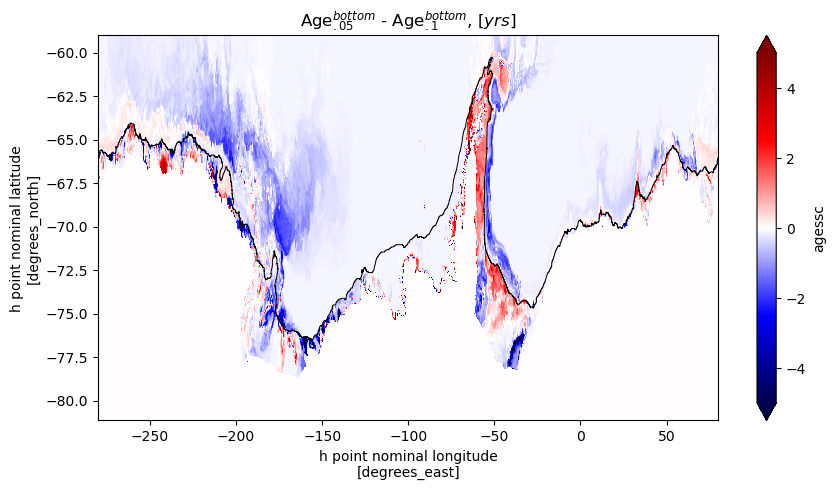

In [49]:
plt.figure(figsize=(10, 5))
agediff.plot(vmin=-5,vmax=5,cmap='seismic',extend='both')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=0.7)
plt.title(r"Age$^{bottom} _{.05}$ - Age$^{bottom} _{.1}$, [$yrs$]")

Close to -50 W, we see enhanced DSW export, and this is close to the location where we have strongest shelf warming. Perhaps the enhanced CSHT we see with the resolution is not due to eddies, but due to the mechanisms of DSW/CDW interchange ( with SSH) that is explained in Morrison (2020). It would be interesting to plot CSHT against DSW export in each resolution to see how that theory matches.

## DSW vs CSHT

It would be usefull to have the DSW export accros the 1km isobath plotted against the CSHT, to see how well they match ( and even correlate them)

Importing volume transports for the year 2000 (in analysis here)

In [50]:
#For panan01
VT_p01= xr.open_dataset('/g/data/e14/cs6673/mom6_comparison/data_DSW/\
vol_transp_across_1000m_isobath_panan_01deg_jra55_ryf_1m_2000.nc')
#For panan005
VT_p005= xr.open_dataset('/g/data/e14/cs6673/mom6_comparison/data_DSW/\
vol_transp_across_1000m_isobath_panan_005deg_jra55_ryf_1m_2000.nc')
#For panan0025
VT_p0025= xr.open_mfdataset('/g/data/e14/cs6673/mom6_comparison/data_DSW/\
vol_transp_across_1000m_isobath_panan_0025deg_jra55_ryf_1m_1999*.nc')


In [51]:
DSW_level=1037.18
VT_p01_annualmean37_18=VT_p01.mean('time').where(VT_p01.rho2_l>=DSW_level).sum('rho2_l')
VT_p005_annualmean37_18=VT_p005.mean('time').where(VT_p005.rho2_l>=DSW_level).sum('rho2_l')
VT_p0025_annualmean37_18=VT_p0025.mean('time').where(VT_p0025.rho2_l>=DSW_level).sum('rho2_l')

Plotting CSHT vs DSW export ( for sigma2>=1037.18)

Getting the longs and lats along mass transport contour


In [52]:
# 	ylength=510;ymax=511;xmax=3601
# 	yh0 = cc.querying.getvar(exp01,'yh',session,n=1)
# 	yh0 = yh0.isel(yh=slice(0,ylength+1))
# 	yq0 = cc.querying.getvar(exp01,'yq',session,n=1).isel(yq=slice(1,ymax+1))
# 	#yq0 = yq0.isel(yq=slice(0,ylength+4))
# 	xh0 = cc.querying.getvar(exp01,'xh',session,n=1)
# 	xq0 = cc.querying.getvar(exp01,'xq',session,n=1).isel(xq=slice(1,xmax))
	
# cutout_latind=510
# 	###########
# 	outfile = '/g/data/e14/cs6673/mom6_comparison/Antarctic_slope_contours/Antarctic_slope_contour_1000m_MOM6_01deg.nc'
# 	data = xr.open_dataset(outfile)
# 	mask_y_transport = data['mask_y_transport']; 
# 	mask_y_transport=mask_y_transport[:cutout_latind,:]       ##############################
# 	mask_x_transport = data['mask_x_transport']; 
# 	mask_x_transport=mask_x_transport[:cutout_latind,:]		################################
# 	mask_y_transport_numbered = data['mask_y_transport_numbered']
# 	mask_y_transport_numbered=mask_y_transport_numbered[:cutout_latind,:]		################################
# 	mask_x_transport_numbered = data['mask_x_transport_numbered']
# 	mask_x_transport_numbered=mask_x_transport_numbered[:cutout_latind,:]		################################
	
	
	# num_points = int(np.maximum(np.max(mask_y_transport_numbered),np.max(mask_x_transport_numbered)))                
	# ############### Getting the lon,lat along contour in the X,Y contour
	# MT01_lat_along_contour = np.zeros((int(np.size(VT_p01_annualmean37_18.contour_index))))
	# MT01_lon_along_contour = np.zeros((int(np.size(VT_p01_annualmean37_18.contour_index))))
	# #locations for zonal transport:
	# x_indices_masked = mask_x_transport_numbered.stack().values
	# x_indices = np.sort(x_indices_masked[x_indices_masked>0])
	# for count in x_indices:
	# 	count = int(count)
	# 	jj = int(np.where(mask_x_transport_numbered==count)[0])
	# 	ii = int(np.where(mask_x_transport_numbered==count)[1])   
	# 	MT01_lon_along_contour[count-1] = mask_x_transport_numbered.xq[ii].values
	# 	MT01_lat_along_contour[count-1] = mask_x_transport_numbered.yh[jj].values
		
	# # locations for meridional transport:
	# y_indices_masked = mask_y_transport_numbered.stack().values
	# y_indices = np.sort(y_indices_masked[y_indices_masked>0])
	# for count in y_indices:
	# 	count = int(count)
	# 	jj = np.where(mask_y_transport_numbered==count)[0]
	# 	ii = np.where(mask_y_transport_numbered==count)[1]
	# 	MT01_lon_along_contour[count-1] = mask_x_transport_numbered.xq[ii].values           ##################          ##################          ##################          ##################          ##################          ##################
	# 	MT01_lat_along_contour[count-1] = mask_y_transport_numbered.yq[jj].values
	

In [53]:
	# cutout_latind=1066
	# ########### Import panan005
	# outfile = '/g/data/e14/cs6673/mom6_comparison/Antarctic_slope_contours/Antarctic_slope_contour_1000m_MOM6_005deg.nc'
	# data = xr.open_dataset(outfile)
	# mask_y_transport = data['mask_y_transport']; 
	# mask_y_transport=mask_y_transport[:cutout_latind,:]       ##############################
	# mask_x_transport = data['mask_x_transport']; 
	# mask_x_transport=mask_x_transport[:cutout_latind,:]		################################
	# mask_y_transport_numbered = data['mask_y_transport_numbered']
	# mask_y_transport_numbered=mask_y_transport_numbered[:cutout_latind,:]		################################
	# mask_x_transport_numbered = data['mask_x_transport_numbered']
	# mask_x_transport_numbered=mask_x_transport_numbered[:cutout_latind,:]		################################
	
	
	# num_points = int(np.maximum(np.max(mask_y_transport_numbered),np.max(mask_x_transport_numbered)))                
	
	# ############### Getting the lon,lat along contour in the X,Y contour
	# MT005_lat_along_contour = np.zeros((int(np.size(VT_p005_annualmean37_18.contour_index))))
	# MT005_lon_along_contour = np.zeros((int(np.size(VT_p005_annualmean37_18.contour_index))))
	# #locations for zonal transport:
	# x_indices_masked = mask_x_transport_numbered.stack().values
	# x_indices = np.sort(x_indices_masked[x_indices_masked>0])
	# for count in x_indices:
	# 	count = int(count)
	# 	jj = int(np.where(mask_x_transport_numbered==count)[0])
	# 	ii = int(np.where(mask_x_transport_numbered==count)[1])   
	# 	MT005_lon_along_contour[count-1] = mask_x_transport_numbered.xq[ii].values
	# 	MT005_lat_along_contour[count-1] = mask_x_transport_numbered.yh[jj].values
		
	# # locations for meridional transport:
	# y_indices_masked = mask_y_transport_numbered.stack().values
	# y_indices = np.sort(y_indices_masked[y_indices_masked>0])
	# for count in y_indices:
	# 	count = int(count)
	# 	jj = np.where(mask_y_transport_numbered==count)[0]
	# 	ii = np.where(mask_y_transport_numbered==count)[1]
	# 	MT005_lon_along_contour[count-1] = mask_x_transport_numbered.xq[ii].values           ##################          ##################          ##################          ##################          ##################          ##################
	# 	MT005_lat_along_contour[count-1] = mask_y_transport_numbered.yq[jj].values
	

In [54]:
	# #cutout_latind=1066*2
	# ########### Import panan0025
	# outfile = '/g/data/e14/cs6673/mom6_comparison/Antarctic_slope_contours/Antarctic_slope_contour_1000m_MOM6_0025deg.nc'
	# data = xr.open_dataset(outfile)
	# mask_y_transport = data['mask_y_transport']; 
	# #mask_y_transport=mask_y_transport[:cutout_latind,:]       ##############################
	# mask_x_transport = data['mask_x_transport']; 
	# #mask_x_transport=mask_x_transport[:cutout_latind,:]		################################
	# mask_y_transport_numbered = data['mask_y_transport_numbered']
	# #mask_y_transport_numbered=mask_y_transport_numbered[:cutout_latind,:]		################################
	# mask_x_transport_numbered = data['mask_x_transport_numbered']
	# #mask_x_transport_numbered=mask_x_transport_numbered[:cutout_latind,:]		################################
	
	
	# num_points = int(np.maximum(np.max(mask_y_transport_numbered),np.max(mask_x_transport_numbered)))                
	
	
	
	
	
	# ############### Getting the lon,lat along contour in the X,Y contour
	# MT0025_lat_along_contour = np.zeros((int(np.size(VT_p0025_annualmean37_18.contour_index))))
	# MT0025_lon_along_contour = np.zeros((int(np.size(VT_p0025_annualmean37_18.contour_index))))
	# #locations for zonal transport:
	# x_indices_masked = mask_x_transport_numbered.stack().values
	# x_indices = np.sort(x_indices_masked[x_indices_masked>0])
	# for count in x_indices:
	# 	count = int(count)
	# 	jj = int(np.where(mask_x_transport_numbered==count)[0])
	# 	ii = int(np.where(mask_x_transport_numbered==count)[1])   
	# 	MT0025_lon_along_contour[count-1] = mask_x_transport_numbered.xq[ii].values
	# 	MT0025_lat_along_contour[count-1] = mask_x_transport_numbered.yh[jj].values
		
	# # locations for meridional transport:
	# y_indices_masked = mask_y_transport_numbered.stack().values
	# y_indices = np.sort(y_indices_masked[y_indices_masked>0])
	# for count in y_indices:
	# 	count = int(count)
	# 	jj = np.where(mask_y_transport_numbered==count)[0]
	# 	ii = np.where(mask_y_transport_numbered==count)[1]
	# 	MT0025_lon_along_contour[count-1] = mask_x_transport_numbered.xq[ii].values           ##################          ##################          ##################          ##################          ##################          ##################
	# 	MT0025_lat_along_contour[count-1] = mask_y_transport_numbered.yq[jj].values
	

In [55]:
	# #saving so I dont have to extract again the lon and lat ( it takes to looong)
	# save_dir  = '/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/Mass_transport_contours.nc'
	# lon_01=xr.DataArray(MT01_lon_along_contour,name="MT01_lon_along_contour",dims=["Contour_index01"])
	# lon_005=xr.DataArray(MT005_lon_along_contour,name="MT005_lon_along_contour",dims=["Contour_index005"])
	# lon_0025=xr.DataArray(MT0025_lon_along_contour,name="MT0025_lon_along_contour",dims=["Contour_index0025"])
	# lat_01=xr.DataArray(MT01_lat_along_contour,name="MT01_lat_along_contour",dims=["Contour_index01"])
	# lat_005=xr.DataArray(MT005_lat_along_contour,name="MT005_lat_along_contour",dims=["Contour_index005"])
	# lat_0025=xr.DataArray(MT0025_lat_along_contour,name="MT0025_lat_along_contour",dims=["Contour_index0025"])
	
	# data_to_saveuv = xr.merge([lon_01,lat_01,lon_005,lat_005,lon_0025,lat_0025])
	# data_to_saveuv['contour_index01']=np.cumsum(np.zeros(np.size(MT01_lon_along_contour))+1)
	# data_to_saveuv['contour_index005']=np.cumsum(np.zeros(np.size(MT005_lon_along_contour))+1)
	# data_to_saveuv['contour_index0025']=np.cumsum(np.zeros(np.size(MT0025_lon_along_contour))+1)
	# data_to_saveuv.to_netcdf(save_dir)

In [56]:
data_MT=xr.open_dataset('/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/Mass_transport_contours.nc')
MT01_lon_along_contour=np.array(data_MT.MT01_lon_along_contour)
MT005_lon_along_contour=np.array(data_MT.MT005_lon_along_contour)
MT0025_lon_along_contour=np.array(data_MT.MT0025_lon_along_contour)
MT01_lat_along_contour=np.array(data_MT.MT01_lat_along_contour)
MT005_lat_along_contour=np.array(data_MT.MT005_lat_along_contour)
MT0025_lat_along_contour=np.array(data_MT.MT0025_lat_along_contour)

In [57]:
#Attributing longs and lats to the contours
VT_p01_annualmean37_18['lonv']=MT01_lon_along_contour
VT_p01_annualmean37_18['contour_index']=MT01_lon_along_contour
VT_p01_annualmean37_18['latv']=MT01_lat_along_contour
VT_p005_annualmean37_18['lonv']=MT005_lon_along_contour
VT_p005_annualmean37_18['contour_index']=MT005_lon_along_contour
VT_p005_annualmean37_18['latv']=MT005_lat_along_contour
VT_p0025_annualmean37_18['lonv']=MT0025_lon_along_contour
VT_p0025_annualmean37_18['contour_index']=MT0025_lon_along_contour
VT_p0025_annualmean37_18['latv']=MT0025_lat_along_contour

In [58]:
# We need to bin the Mass transport into 3 degrees bins

#edgepoints will be:
edgepoints=np.zeros(np.size(P01_binned_CSHT_ZC_z.lon_bin_midpoints)+1)
edgepoints[:-1]= np.array(P01_binned_CSHT_ZC_z.lon_bin_midpoints-0.25)
edgepoints[-1]=P01_binned_CSHT_ZC_z.lon_bin_midpoints[-1]

VT_p01_binnedv=VT_p01_annualmean37_18.groupby_bins("contour_index", edgepoints).sum()
VT_p005_binnedv=VT_p005_annualmean37_18.groupby_bins("contour_index", edgepoints).sum()
VT_p0025_binnedv=VT_p0025_annualmean37_18.groupby_bins("contour_index", edgepoints).sum()

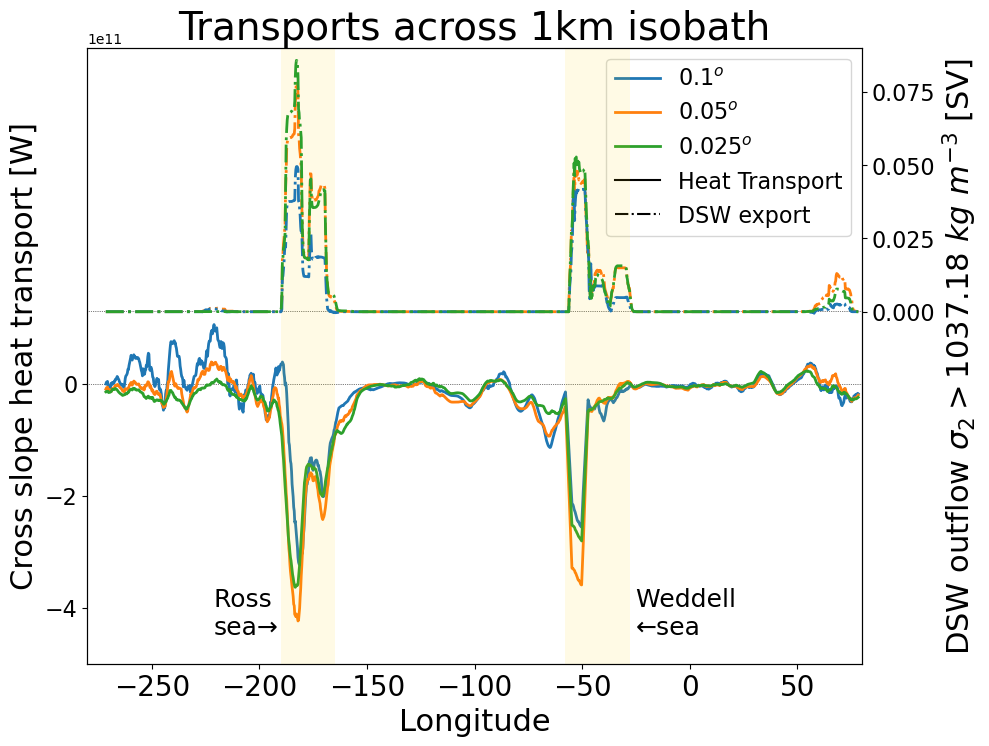

In [59]:
rollwin=30
from matplotlib.patches import Rectangle

#plt.figure(figsize=(10, 5))
fig, ax1 = plt.subplots(figsize=(10, 8))
#CSHT
ax1.plot(P01_binned_CSHT_ZC_z.lon_bin_midpoints,\
         P01_binned_CSHT_ZC_z.sum('z_l').rolling(lon_bin_midpoints=rollwin).mean(),lw=2,label=r"$0.1^{o}$")
ax1.plot(P005_binned_CSHT_ZC_z.lon_bin_midpoints,\
         P005_binned_CSHT_ZC_z.sum('z_l').rolling(lon_bin_midpoints=rollwin).mean(),lw=2,label=r"$0.05^{o}$")
ax1.plot(P0025_binned_CSHT_ZC_z.lon_bin_midpoints,\
         P0025_binned_CSHT_ZC_z.sum('z_l').rolling(lon_bin_midpoints=rollwin).mean(),lw=2,label=r"$0.025^{o}$")



#for labels
ax1.plot([-280,80],[1e13,1e13],color='black',label='Heat Transport',zorder=0)
ax1.plot([-280,80],[1e13,1e13],'-.',color='black',label='DSW export',zorder=0)

ax1.plot([-280,80],[0,0],':',color='black',lw=0.5,zorder=0)
ax1.plot([-280,80],[1.3e11,1.3e11],':',color='black',lw=0.5,zorder=0)
plt.yticks([-4e11,-2e11,0e11])

plt.ylabel('Cross slope heat transport [W]',fontsize=22)
plt.legend(fontsize=16)
plt.ylim(-5e11,6e11)
plt.xlim(-280,80)
plt.xlabel('Longitude',fontsize=22)
plt.xticks(fontsize=20)
plt.yticks(fontsize=16)
#Mass transports
ax2 = ax1.twinx()
ax2.plot(P005_binned_CSHT_ZC_z.lon_bin_midpoints,\
         VT_p005_binnedv.vol_trans_across_contour.rolling(contour_index_bins=rollwin).mean(),\
        '-.',linewidth=2,color="tab:orange")

ax2.plot(P01_binned_CSHT_ZC_z.lon_bin_midpoints,\
         VT_p01_binnedv.vol_trans_across_contour.rolling(contour_index_bins=rollwin).mean(),\
        '-.',linewidth=2,color="tab:blue")

ax2.plot(P0025_binned_CSHT_ZC_z.lon_bin_midpoints,\
         VT_p0025_binnedv.vol_trans_across_contour.rolling(contour_index_bins=rollwin).mean(),\
        '-.',linewidth=2,color="tab:green")


ax2.add_patch(Rectangle((-190,-0.12), 190-165, 0.09+0.12,facecolor='gold',edgecolor ='none',alpha=0.1,zorder=0)) #First strong DSW formation region between [-190,-165]
ax2.add_patch(Rectangle((-58,-0.12), 58-28, 0.09+0.12,facecolor='gold',edgecolor ='none',alpha=0.1,zorder=0))# Second strong DSW formation region between [-58,-28]
ax2.text(-221,-0.11,'Ross \nsea→',fontsize=18)
ax2.text(-25,-0.11,'Weddell \n←sea',fontsize=18)

plt.ylim(-0.12,0.09)
plt.ylabel(r"DSW outflow $\sigma_{2}>1037.18\ kg\ m^{-3}$ [SV]",fontsize=22)
plt.xlim(-280,80)
plt.yticks([0,0.025,0.05,0.075],fontsize=16)

plt.title('Transports across 1km isobath',fontsize=28)


plt.savefig(figdir+'RES_CSHTvsDSW_along_contour.png',dpi=300,bbox_inches='tight')

One thing to consider is, regions with increased DSW export have stronger CSHT, but the residence time of CDW in these locations is small due to continuous exchange with the Atmosphere in coastal polynyas (check [Morrison et al 2020](https://www.science.org/doi/10.1126/sciadv.aav2516)). So these DSW formation regions *possibly* contribute little to increase in heat content on the Antarctic Shelf. 

**Idea:** It would be interesting to think of ways to remove the effect of the DSW formation on the CSHT (Perhaps by discounting the Heat loss to the Atmosphere on each shelf bin)

In [60]:
# Lets correlate the DSW export with the CSHT. It will tell us how \
# much of the increase in the CSHT with resolution along the contour is explained by the \
# increase in DSW export.


DSW_change=np.nan_to_num(np.array(VT_p005_binnedv.vol_trans_across_contour.rolling(contour_index_bins=rollwin).mean() - VT_p01_binnedv.vol_trans_across_contour.rolling(contour_index_bins=rollwin).mean()),nan=0)
CSHT_change = np.nan_to_num(np.array(P005_binned_CSHT_ZC_z.sum('z_l').rolling(lon_bin_midpoints=rollwin).mean() - P01_binned_CSHT_ZC_z.sum('z_l').rolling(lon_bin_midpoints=rollwin).mean()),nan=0)
coefcorr = np.corrcoef(DSW_change,CSHT_change)[1,0]
detcorr=coefcorr**2

print('Correlation coefficient between the increase in DSW and CSHT (0.1 to 0.05) is ' + str(round(coefcorr,2)), \
      ', DSW export explains ' + str(int(detcorr*100)) + '% of mean CSHT increase along the contour' )




Correlation coefficient between the increase in DSW and CSHT (0.1 to 0.05) is -0.48 , DSW export explains 22% of mean CSHT increase along the contour


How much of the change in CSHT occur in DSW regions? lets see

In [61]:
#mask for the DSW regions above
lon_bin_midpoints_masked=P005_binned_CSHT_ZC_z.lon_bin_midpoints
#masking first region[-190,-165]  [-58,-28]
lon_bin_midpoints_masked = lon_bin_midpoints_masked.where((lon_bin_midpoints_masked<=-190) | (lon_bin_midpoints_masked>=-165)).where((lon_bin_midpoints_masked<=-58) | (lon_bin_midpoints_masked>=-28))
lon_bin_midpoints_masked = (lon_bin_midpoints_masked*0) + 1

In [62]:
CSHTincrease_01to005 = (P005_binned_CSHT_ZC_z.sum('z_l').sum() - P01_binned_CSHT_ZC_z.sum('z_l').sum())/1e12
CSHTincrease_01to0025 = (P0025_binned_CSHT_ZC_z.sum('z_l').sum() - P01_binned_CSHT_ZC_z.sum('z_l').sum())/1e12
#All regions except DSW formation
CSHTincrease_01to005_maskedDSW =  ((P005_binned_CSHT_ZC_z.sum('z_l')*lon_bin_midpoints_masked).sum()\
                                   - (P01_binned_CSHT_ZC_z.sum('z_l')*lon_bin_midpoints_masked).sum())/1e12

CSHTincrease_01to0025_maskedDSW =  ((P0025_binned_CSHT_ZC_z.sum('z_l')*lon_bin_midpoints_masked).sum()\
                                   - (P01_binned_CSHT_ZC_z.sum('z_l')*lon_bin_midpoints_masked).sum())/1e12
#Only east Antarctica
CSHTincrease_01to005_EA =  ((P005_binned_CSHT_ZC_z.sum('z_l').where(P005_binned_CSHT_ZC_z.lon_bin_midpoints<=-190)).sum()\
                                   - (P01_binned_CSHT_ZC_z.sum('z_l').where(P01_binned_CSHT_ZC_z.lon_bin_midpoints<=-190)).sum())/1e12

CSHTincrease_01to0025_EA =  ((P0025_binned_CSHT_ZC_z.sum('z_l').where(P0025_binned_CSHT_ZC_z.lon_bin_midpoints<=-190)).sum()\
                                   - (P01_binned_CSHT_ZC_z.sum('z_l').where(P01_binned_CSHT_ZC_z.lon_bin_midpoints<=-190)).sum())/1e12

print("\n1- Total increase in CSHT with resolution (0.1 to 0.05) is of " + str(int(CSHTincrease_01to005)) +\
      " TW, from which " + str(int(CSHTincrease_01to005) - int(CSHTincrease_01to005_maskedDSW )) + " TW or " +\
      str(int((1-np.round(CSHTincrease_01to005_maskedDSW/CSHTincrease_01to005,2))*100)) + \
      " % occurs in DSW formation \n\n" + \
     "2- In East Antarctica, between [280W,190W] the increase in CSHT is of " +\
     str(int(CSHTincrease_01to005_EA)) + " TW from 0.1 to 0.05 (" +  \
     str(int(CSHTincrease_01to005_EA*100/CSHTincrease_01to005)) + "% of total), " + \
      " and " + str(int(CSHTincrease_01to0025_EA)) + " from 0.1 to 0.025 (" + \
      str(int(CSHTincrease_01to0025_EA*100/CSHTincrease_01to0025)) + "% of total) \n\n" +\
     "As we can see we have avery interesting increase in CSHT in E.A. folowing the resolution refinement. \nTherefore it is very important to see what is happening in this region...")


1- Total increase in CSHT with resolution (0.1 to 0.05) is of -19 TW, from which -8 TW or 42 % occurs in DSW formation 

2- In East Antarctica, between [280W,190W] the increase in CSHT is of -9 TW from 0.1 to 0.05 (50% of total),  and -14 from 0.1 to 0.025 (88% of total) 

As we can see we have avery interesting increase in CSHT in E.A. folowing the resolution refinement. 
Therefore it is very important to see what is happening in this region...


## East Antarctica - E.A.

We want to know what mechanism is responsible for increasing the CSHT in E.A. ( West of -190W). In tis region specifically, it seems like the CSHT is almost reversed as we increase resolution. Lets separate this region and perform a spectral analysis to see if it gives us an insight on the timescaes of change here

In [63]:
#for panan01
P01_total_daily_EA = P01_binned_CSHT_ZC_z.where(P01_binned_CSHT_ZC_z.lon_bin_midpoints<=-190,drop=True).sum('z_l')
P01_ZC_daily_EA = P01_binned_ZC_z.where(P01_binned_ZC_z.lon_bin_midpoints<=-190,drop=True).sum('z_l')*p01_factor
P01_CSHT_daily_EA = P01_binned_CSHT_z.where(P01_binned_CSHT_z.lon_bin_midpoints<=-190,drop=True).sum('z_l')*p01_factor


#for panan005
P005_total_daily_EA = P005_binned_CSHT_ZC_z.where(P005_binned_CSHT_ZC_z.lon_bin_midpoints<=-190,drop=True).sum('z_l')
P005_ZC_daily_EA = P005_binned_ZC_z.where(P005_binned_ZC_z.lon_bin_midpoints<=-190,drop=True).sum('z_l')*p005_factor
P005_CSHT_daily_EA = P005_binned_CSHT_z.where(P005_binned_CSHT_z.lon_bin_midpoints<=-190,drop=True).sum('z_l')*p005_factor


#for panan0025
P0025_total_daily_EA = P0025_binned_CSHT_ZC_z.where(P0025_binned_CSHT_ZC_z.lon_bin_midpoints<=-190,drop=True).sum('z_l')
P0025_ZC_daily_EA = P0025_binned_ZC_z.where(P0025_binned_ZC_z.lon_bin_midpoints<=-190,drop=True).sum('z_l')*p0025_factor
P0025_CSHT_daily_EA = P0025_binned_CSHT_z.where(P0025_binned_CSHT_z.lon_bin_midpoints<=-190,drop=True).sum('z_l')*p0025_factor

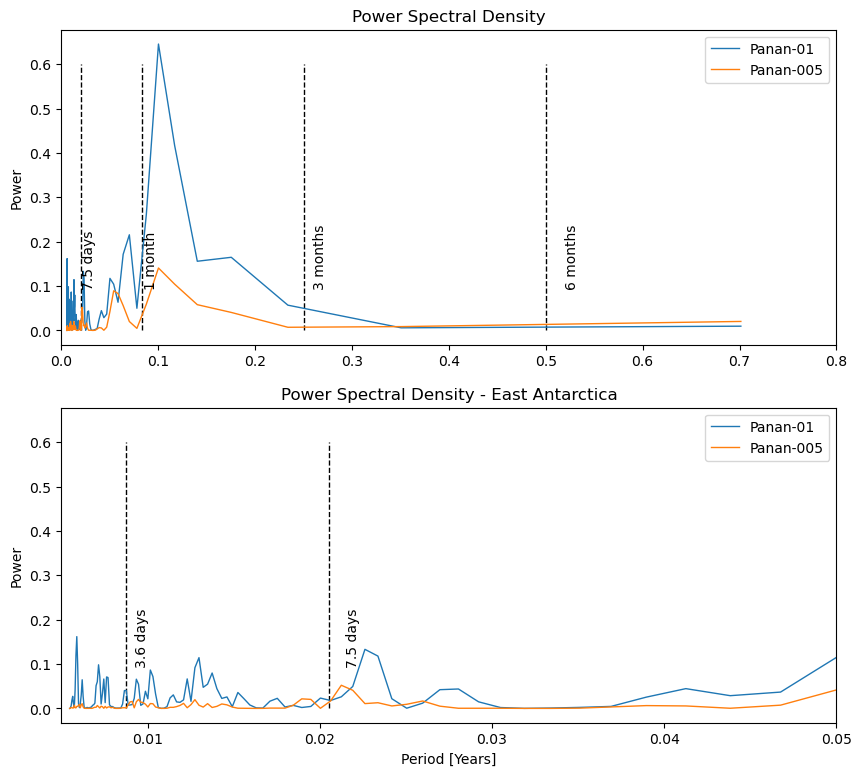

In [64]:
plt.figure(figsize=(10, 9))

plt.subplot(2,1,1)
# Compute the power spectral density
frequencies01, psd01 = signal.welch(P01_total_daily_EA/1e12, fs=1)
frequencies005, psd005 = signal.welch(P005_total_daily_EA/1e12, fs=1)
plt.plot(1/frequencies01/365, psd01, label = 'Panan-01',lw=1)
plt.plot(1/frequencies005/365, psd005, label = 'Panan-005',lw=1)


plt.title('Power Spectral Density')
plt.vlines(0.5,0,0.6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text(0.52,.1,'6 months',rotation=90)
plt.vlines(1/4,0,0.6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text(0.26,.1,'3 months',rotation=90)
plt.vlines(1/12,0,0.6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/12)+0.002,.1,'1 month',rotation=90)
plt.vlines((1/365)*7.5,0,0.6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*7.5+0.001,.1,'7.5 days',rotation=90)
# plt.vlines((1/365)*3.6,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*3.6+0.0005,1,'3.6 days',rotation=90)
# plt.vlines((1/365)*2.7,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*2.7+0.0002,1,'2.7 days',rotation=90)
#plt.vlines((1/365)*2.25,0,1e6, color='black', linestyle='dashed', zorder=-1,lw=1);


#plt.xlabel('Period [Years]')
plt.ylabel('Power')
plt.xlim(0,0.8)
# plt.grid()
plt.legend()



plt.subplot(2,1,2)
# Compute the power spectral density
plt.plot(1/frequencies01/365, psd01, label = 'Panan-01',lw=1)
plt.plot(1/frequencies005/365, psd005, label = 'Panan-005',lw=1)


plt.title('Power Spectral Density - East Antarctica')
plt.vlines((1/365)*7.5,0,0.6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*7.5+0.001,0.1,'7.5 days',rotation=90)
plt.vlines((1/365)*3.2,0,0.6, color='black', linestyle='dashed', zorder=-1,lw=1); plt.text((1/365)*3.2+0.0005,0.1,'3.6 days',rotation=90)


plt.xlabel('Period [Years]')
plt.ylabel('Power')
plt.xlim(0.005,0.05)
#plt.ylim(0,0.6)
# plt.grid()
plt.legend()


#plt.savefig(figdir+'RESlinear_EA_CSHT_spectrum.png',dpi=300,bbox_inches='tight')
plt.show()

Again, the power spectrum makes no sense (Or I am really not understanding the results)

Lets zoom in EA and take a look to see if we get any insight

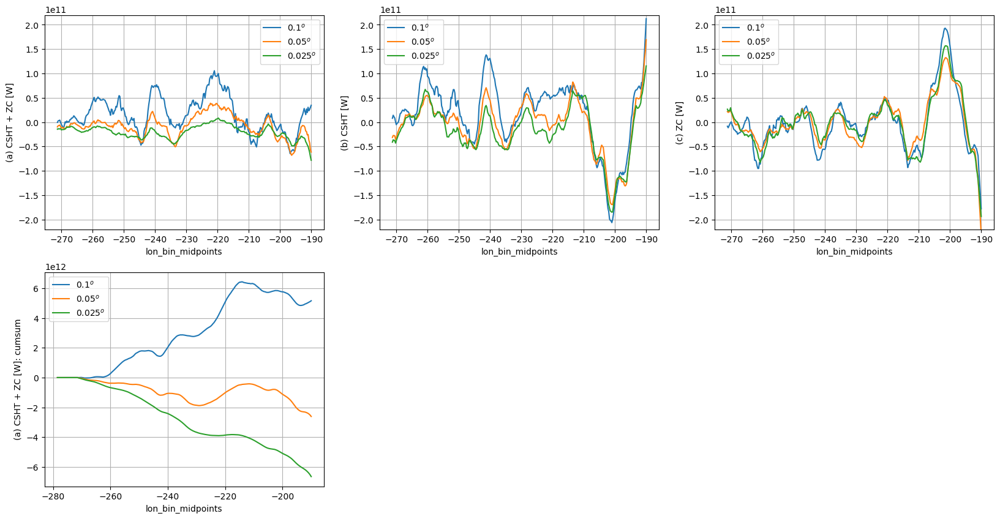

In [65]:

plt.figure(figsize=(20, 10))

plt.subplot(2,3,1)
P01_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.1^{o}$")
P005_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.05^{o}$")
P0025_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.025^{o}$") #actually it is monthly
plt.legend(); plt.ylabel('(a) CSHT + ZC [W]'); plt.ylim([-2.2e11,2.2e11])
plt.grid()

plt.subplot(2,3,2)
P01_CSHT_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.1^{o}$")
P005_CSHT_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.05^{o}$")
P0025_CSHT_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.025^{o}$")#actually it is monthly
plt.legend(); plt.ylabel('(b) CSHT [W]'); plt.ylim([-2.2e11,2.2e11])
plt.grid()


plt.subplot(2,3,3)
P01_ZC_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.1^{o}$")
P005_ZC_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.05^{o}$")
P0025_ZC_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.025^{o}$")#actually it is monthly
plt.legend(); plt.ylabel('(c) ZC [W]'); plt.ylim([-2.2e11,2.2e11])
plt.grid()


plt.subplot(2,3,4)
P01_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().cumsum().plot(label=r"$0.1^{o}$")
P005_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().cumsum().plot(label=r"$0.05^{o}$")
P0025_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().cumsum().plot(label=r"$0.025^{o}$")
plt.legend(); plt.ylabel('(a) CSHT + ZC [W]: cumsum');
plt.grid()

plt.savefig(figdir+'RESEA_CSHT_rollingmean.png',dpi=300,bbox_inches='tight')

Looking at these plots, we can see that there are some patterns that could be dicating the difference...

[I] ~220W, the Northward heat transport is lower on panan0025 than on panan005 than on panan01. This comes locally and direct from the heat crossing the isobath (middle plot), since the zonal convergence is the same in this location for all resolutions (right plot). Might be worth to check this region in particular to see if we can see any changes that can explain that...


[II] Between 270W and 250W, the CSHT is <0 for 0.025, near zero for 0.05, and positive for 0.1. This also seem to be a local signal since a similar pattern is seen on the middle plot (that do not have ZC). The ZC seems to try to compensate the signals, but it doesnt fully (right plot)

[III] In fact, the CSHT is consistently negative in 0.025, except by a small region on 220W.




Ok, the biggest candidate for the increase in CSHT here with resolution in E.A. is the eddy transport. Perhaps we can use the decomposition of eddy = total - mean here too? the only problem is that we only have HT on the last years of the simulation ( unless I calculate them offline for the rest of the simulation).

Panan01 = we have T,u,v for 14 years
Panan005 = we have T,u,v for 19 years
Panan0025 = we have T,u,v ffor 10 years

We can calculate the climatology of u,v,t in each simulation, for the years 1991 to 2000 ( 10 years) , to obtain the mean component of the heat transport, and discount from the timeseries, and then obtain the climatological mean CSHT. LEts do that then!

In [66]:
#importing climatology of HT for panan01
clim_panan01=xr.open_mfdataset('/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/panan01/CSHT_mean_CPrhoUhT/Panan01_Ant_cross_slope_heat_terms_offline_1000m_*')
clim_panan005=xr.open_mfdataset('/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/Processed_data/panan005/CSHT_mean_CPrhoUhT/Panan005_Ant_cross_slope_heat_terms_offline_1000m_*')


In [67]:
#panan01
P01_clim_unbinnedCSHTmean= clim_panan01.unbinned_heat_transp_across_contour.mean('month').sum('z_l')
P01_clim_binnedCSHTmean= clim_panan01.binned_cross_slope_heat_trans.mean('month').sum('z_l')
P01_clim_binnedZCmean= clim_panan01.zonal_convergence.mean('month').sum('z_l')
P01_clim_binnedCSHTandZCmean = (P01_clim_binnedCSHTmean + P01_clim_binnedZCmean)*p01_factor

#panan005
P005_clim_unbinnedCSHTmean= clim_panan005.unbinned_heat_transp_across_contour.mean('month').sum('z_l')
P005_clim_binnedCSHTmean= clim_panan005.binned_cross_slope_heat_trans.mean('month').sum('z_l')
P005_clim_binnedZCmean= clim_panan005.zonal_convergence.mean('month').sum('z_l')
P005_clim_binnedCSHTandZCmean = (P005_clim_binnedCSHTmean + P005_clim_binnedZCmean)*p005_factor

In [68]:
Eddy_HT = (np.array((P01_binned_CSHT_mean+P01_binned_ZC_mean)*p01_factor/1e12) - \
         np.array(P01_clim_binnedCSHTandZCmean /1e12))

Eddy_HT005 = (np.array((P005_binned_CSHT_mean+P005_binned_ZC_mean)*p005_factor/1e12) - \
         np.array(P005_clim_binnedCSHTandZCmean /1e12))

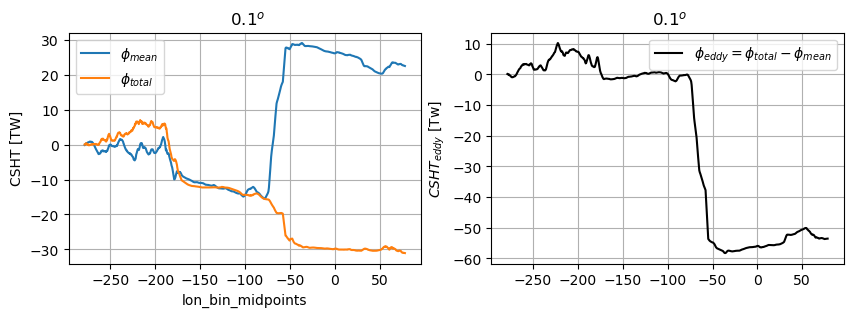

In [69]:
# how does cumsum look in panan01 between climatology and full HT
plt.figure(figsize=(10, 3))
plt.subplot(1,2,1)
(P01_clim_binnedCSHTandZCmean/1e12).cumsum().plot(label=r"$\phi_{mean}$")
plt.plot(P01_binned_lon,(P01_binned_CSHT_mean+P01_binned_ZC_mean).cumsum()*p01_factor/1e12,label=r"$\phi_{total}$")
plt.title(r" $0.1^{o}$")
plt.ylabel('CSHT [TW]')
plt.legend()
plt.grid()


plt.subplot(1,2,2)
plt.plot(P01_binned_lon,np.cumsum(Eddy_HT) ,color='black',label=r"$\phi_{eddy}=\phi_{total}-\phi_{mean}$")
plt.title(r" $0.1^{o}$")
plt.ylabel(r"$CSHT_{eddy}$ [Tw]")
plt.legend()
plt.grid()

According to this plot, the climatology brings heat out of teh Antarctic Peninsula, but eddies more than compensate than and brings heat into the Antarctic Peninsula. It is possible, but I'd need to make sure this is not insanity. Let's think about what that would mean in terms of variables and tracers...


**West Antarctic Peninsula**
A positive mean HT suggests heat leaving the AP in the climatology. For that to happen we would need a compination of either:

[a] Nortward velocities along the isobath + warm temperatures off the shelf

[b] Southward velocities  + warm temperatures off the shelf.

**East Antarctic Peninsula - or Weddel Sea**
A positive mean HT suggests ...

[a] Eastward velocities along the isobath + cold temperatures on the shelf

[b] Westward velocities + warm temperatures off the shelf.

Let's check these vars

In [70]:
# #importing speed and T
U01 = cc.querying.getvar(exp01,'uo',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).sel(z_l=slice(0,1000)).mean('time')
V01 = cc.querying.getvar(exp01,'vo',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yq=lat_range).sel(z_l=slice(0,1000)).mean('time')
T01 = cc.querying.getvar(exp01,'thetao',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).sel(z_l=slice(0,1000)).mean('time')
Vo01 = cc.querying.getvar(exp01,'volcello',session,ncfile='%month_z%',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).sel(z_l=slice(0,1000)).mean('time')
# # Averaging speed, U and V in the top 1000 m
U01=U01.weighted(Vo01.interp(xh=U01.xq).fillna(0)).mean('z_l')
V01=V01.weighted(Vo01.interp(yh=V01.yq).fillna(0)).mean('z_l')
T01=T01.weighted(Vo01.fillna(0)).mean('z_l')
#loading
T01=T01.load()
U01=U01.load()
V01=V01.load()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/dataset.py:282: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3

In [71]:
# #importing speed and T - PAna005
U005 = cc.querying.getvar(exp005,'uo',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).sel(z_l=slice(0,1000)).mean('time')
V005 = cc.querying.getvar(exp005,'vo',session,frequency='1 monthly',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yq=lat_range).sel(z_l=slice(0,1000)).mean('time')
Vo005 = cc.querying.getvar(exp005,'volcello',session,ncfile='%month_z%',start_time=start_time,end_time=end_time).sel(time=time_slice).sel(yh=lat_range).sel(z_l=slice(0,1000)).mean('time')
# # Averaging speed, U and V in the top 1000 m
U005=U005.weighted(Vo005.interp(xh=U005.xq).fillna(0)).mean('z_l')
V005=V005.weighted(Vo005.interp(yh=V005.yq).fillna(0)).mean('z_l')
#loading
U005=U005.load()
V005=V005.load()



In [72]:
U005=U005.weighted(Vo005.interp(xh=U005.xq).fillna(0)).mean('z_l')
U005=U005.load()

(-100.0, -30.0)

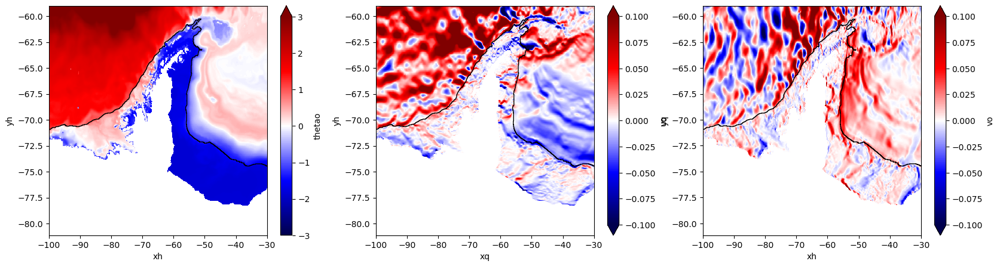

In [73]:
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
(T01).plot(vmin=-3,vmax=3,cmap='seismic') #added 1.8 here for the freezing temperature corrections
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=1)
plt.xlim(-100,-30)

plt.subplot(1,3,2)
U01.plot(vmin=-.1,vmax=.1,cmap='seismic')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=1)
plt.xlim(-100,-30)

plt.subplot(1,3,3)
V01.plot(vmin=-.1,vmax=.1,cmap='seismic')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=1)
plt.xlim(-100,-30)

(-150.0, -100.0)

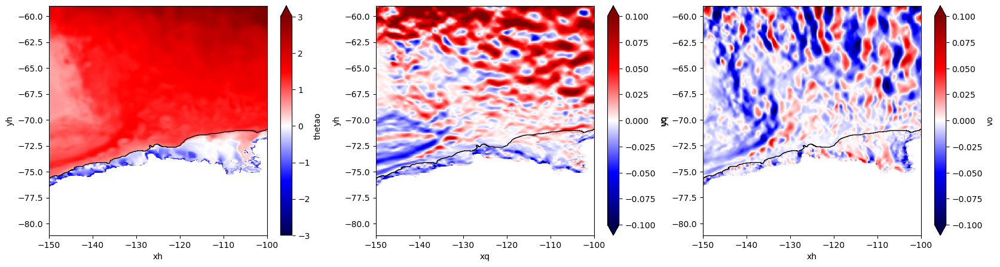

In [74]:
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
(T01).plot(vmin=-3,vmax=3,cmap='seismic') #added 1.8 here for the freezing temperature corrections
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=1)
plt.xlim(-150,-100)

plt.subplot(1,3,2)
U01.plot(vmin=-.1,vmax=.1,cmap='seismic')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=1)
plt.xlim(-150,-100)

plt.subplot(1,3,3)
V01.plot(vmin=-.1,vmax=.1,cmap='seismic')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=1)
plt.xlim(-150,-100)

On the Weddell Sea, and the East of the Antarctic Peninsula, we do seem to have mostly westward velocities in the climatology,while water are warmer off the shelf. This indeed suggests that on the East of the Antarctic peninsula, the climatological mean CSHT would be bringing heat to the shelf. That is so Interesting!!!

Ok, now that we have some peace of mind that the calculation is correct, lets go back to see what goes on East ANtarctica

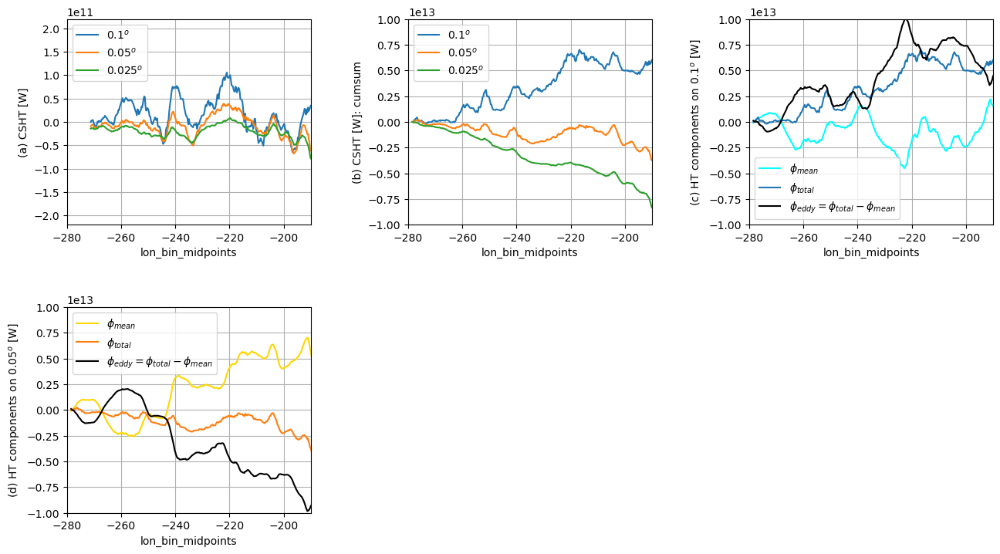

In [75]:
plt.figure(figsize=(15, 8))
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

plt.subplot(2,3,1)
P01_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.1^{o}$")
P005_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.05^{o}$")
P0025_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.025^{o}$") #actually it is monthly
plt.legend(); plt.ylabel('(a) CSHT [W]'); plt.ylim([-2.2e11,2.2e11])
plt.grid()
plt.xlim(-280,-190)


plt.subplot(2,3,2)
P01_total_daily_EA.cumsum().plot(label=r"$0.1^{o}$")
P005_total_daily_EA.cumsum().plot(label=r"$0.05^{o}$")
P0025_total_daily_EA.cumsum().plot(label=r"$0.025^{o}$")
plt.legend(); plt.ylabel('(b) CSHT [W]: cumsum');
plt.grid();plt.ylim(-10e12,10e12)
plt.xlim(-280,-190)

plt.subplot(2,3,3)
(P01_clim_binnedCSHTandZCmean).cumsum().plot(color="cyan",label=r"$\phi_{mean}$")
plt.plot(P01_binned_lon,(P01_binned_CSHT_mean+P01_binned_ZC_mean).cumsum()*p01_factor,color="tab:blue",label=r"$\phi_{total}$")
plt.plot(P01_binned_lon,np.cumsum(Eddy_HT*1e12) ,color='black',label=r"$\phi_{eddy}=\phi_{total}-\phi_{mean}$")
plt.xlim(-280,-190); plt.ylim(-10e12,10e12)
plt.legend(); plt.ylabel(r"(c) HT components on $0.1^{o}$ [W]");
plt.grid()


plt.subplot(2,3,4)
(P005_clim_binnedCSHTandZCmean).cumsum().plot(color="gold",label=r"$\phi_{mean}$")
plt.plot(P005_binned_lon,(P005_binned_CSHT_mean+P005_binned_ZC_mean).cumsum()*p005_factor,color="tab:orange",label=r"$\phi_{total}$")
plt.plot(P005_binned_lon,np.cumsum(Eddy_HT005*1e12) ,color='black',label=r"$\phi_{eddy}=\phi_{total}-\phi_{mean}$")
plt.xlim(-280,-190); plt.ylim(-10e12,10e12)
plt.legend(); plt.ylabel(r"(d) HT components on $0.05^{o}$ [W]");
plt.grid()

plt.savefig(figdir+'RESEA_CSHTeddy_rollingmean.png',dpi=300,bbox_inches='tight')

Lets re-plot above with rolling mean and without cumsum, to contrast with the plot a few panels above.

In [76]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

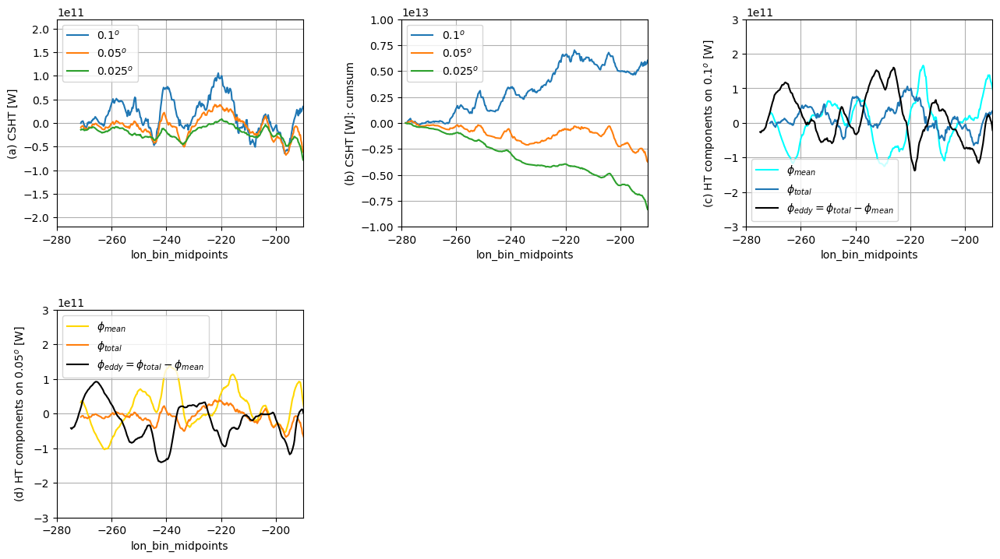

In [77]:
plt.figure(figsize=(15, 8))
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

plt.subplot(2,3,1)
P01_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.1^{o}$")
P005_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.05^{o}$")
P0025_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.025^{o}$") #actually it is monthly
plt.legend(); plt.ylabel('(a) CSHT [W]'); plt.ylim([-2.2e11,2.2e11])
plt.grid()
plt.xlim(-280,-190)


plt.subplot(2,3,2)
P01_total_daily_EA.cumsum().plot(label=r"$0.1^{o}$")
P005_total_daily_EA.cumsum().plot(label=r"$0.05^{o}$")
P0025_total_daily_EA.cumsum().plot(label=r"$0.025^{o}$")
plt.legend(); plt.ylabel('(b) CSHT [W]: cumsum');
plt.grid();plt.ylim(-10e12,10e12)
plt.xlim(-280,-190)

plt.subplot(2,3,3)
(P01_clim_binnedCSHTandZCmean).rolling(lon_bin_midpoints=rollwin).mean().plot(color="cyan",label=r"$\phi_{mean}$")
plt.plot(P01_binned_lon,(P01_binned_CSHT_mean+P01_binned_ZC_mean).rolling(lon_bin_midpoints=rollwin).mean()*p01_factor,color="tab:blue",label=r"$\phi_{total}$")
plt.plot(moving_average(P01_binned_lon,rollwin),moving_average(Eddy_HT*1e12,rollwin) ,color='black',label=r"$\phi_{eddy}=\phi_{total}-\phi_{mean}$")
plt.xlim(-280,-190); plt.ylim(-0.3e12,0.3e12)
plt.legend(); plt.ylabel(r"(c) HT components on $0.1^{o}$ [W]");
plt.grid()


plt.subplot(2,3,4)
(P005_clim_binnedCSHTandZCmean).rolling(lon_bin_midpoints=rollwin).mean().plot(color="gold",label=r"$\phi_{mean}$")
plt.plot(P005_binned_lon,(P005_binned_CSHT_mean+P005_binned_ZC_mean).rolling(lon_bin_midpoints=rollwin).mean()*p005_factor,color="tab:orange",label=r"$\phi_{total}$")
plt.plot(moving_average(P005_binned_lon,rollwin),moving_average(Eddy_HT005*1e12,rollwin) ,color='black',label=r"$\phi_{eddy}=\phi_{total}-\phi_{mean}$")
plt.xlim(-280,-190); plt.ylim(-0.3e12,0.3e12)
plt.legend(); plt.ylabel(r"(d) HT components on $0.05^{o}$ [W]");
plt.grid()

plt.savefig(figdir+'RESEA_CSHTeddy_NOCUMSUM_rollingmean.png',dpi=300,bbox_inches='tight')

How do each components change across resolutions?

In [78]:
Speed01=((U01.interp(xq=V01.xh)**2)+(V01.interp(yq=U01.yh)**2))**0.5


In [79]:
Speed005=((U005.interp(xq=V005.xh)**2)+(V005.interp(yq=U005.yh)**2))**0.5

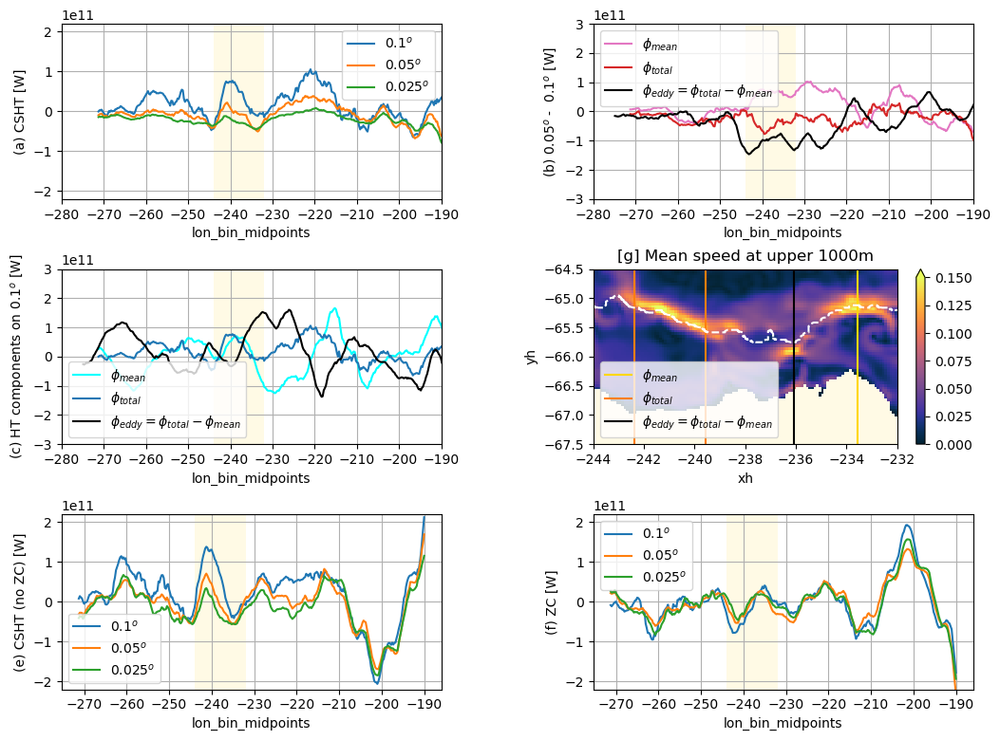

In [80]:
plt.figure(figsize=(12, 12))
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

xg_west=-244
xg_length=12

ax0 = plt.subplot(4,2,1)
P01_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.1^{o}$")
P005_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.05^{o}$")
P0025_total_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.025^{o}$") #actually it is monthly
plt.legend(); plt.ylabel('(a) CSHT [W]'); plt.ylim([-2.2e11,2.2e11])
plt.grid()
plt.xlim(-280,-190)
ax0.add_patch(Rectangle((xg_west,-0.3e12), xg_length, 0.6e12,facecolor='gold',edgecolor ='none',alpha=0.1,zorder=0))# Second strong DSW formation region between [-58,-28]



ax1 = plt.subplot(4,2,2)
(P005_clim_binnedCSHTandZCmean - \
 P01_clim_binnedCSHTandZCmean).rolling(lon_bin_midpoints=rollwin).mean().plot(color="tab:pink",label=r"$\phi_{mean}$")
plt.plot(P01_binned_lon,(((P005_binned_CSHT_mean+P005_binned_ZC_mean)*p005_factor) - \
                         ((P01_binned_CSHT_mean+P01_binned_ZC_mean)*p01_factor)).rolling(lon_bin_midpoints=rollwin).mean(),color="tab:red",label=r"$\phi_{total}$")
plt.plot(moving_average(P01_binned_lon,rollwin),moving_average(Eddy_HT005*1e12,rollwin) - \
         moving_average(Eddy_HT*1e12,rollwin) ,color='black',label=r"$\phi_{eddy}=\phi_{total}-\phi_{mean}$")
plt.xlim(-280,-190); plt.ylim(-0.3e12,0.3e12)
plt.legend(); plt.ylabel(r"(b) $0.05^{o}$ -  $0.1^{o}$ [W]");
plt.grid()
ax1.add_patch(Rectangle((xg_west,-0.3e12), xg_length, 0.6e12,facecolor='gold',edgecolor ='none',alpha=0.1,zorder=0))# Second strong DSW formation region between [-58,-28]



ax2 = plt.subplot(4,2,3)
(P01_clim_binnedCSHTandZCmean).rolling(lon_bin_midpoints=rollwin).mean().plot(color="cyan",label=r"$\phi_{mean}$")
plt.plot(P01_binned_lon,(P01_binned_CSHT_mean+P01_binned_ZC_mean).rolling(lon_bin_midpoints=rollwin).mean()*p01_factor,color="tab:blue",label=r"$\phi_{total}$")
plt.plot(moving_average(P01_binned_lon,rollwin),moving_average(Eddy_HT*1e12,rollwin) ,color='black',label=r"$\phi_{eddy}=\phi_{total}-\phi_{mean}$")
plt.xlim(-280,-190); plt.ylim(-0.3e12,0.3e12)
plt.legend(); plt.ylabel(r"(c) HT components on $0.1^{o}$ [W]");
plt.grid()
ax2.add_patch(Rectangle((xg_west,-0.3e12), xg_length, 0.6e12,facecolor='gold',edgecolor ='none',alpha=0.1,zorder=0))# Second strong DSW formation region between [-58,-28]


ax3 = plt.subplot(4,2,4)
(P005_clim_binnedCSHTandZCmean).rolling(lon_bin_midpoints=rollwin).mean().plot(color="gold",label=r"$\phi_{mean}$")
plt.plot(P005_binned_lon,(P005_binned_CSHT_mean+P005_binned_ZC_mean).rolling(lon_bin_midpoints=rollwin).mean()*p005_factor,color="tab:orange",label=r"$\phi_{total}$")
plt.plot(moving_average(P005_binned_lon,rollwin),moving_average(Eddy_HT005*1e12,rollwin) ,color='black',label=r"$\phi_{eddy}=\phi_{total}-\phi_{mean}$")
plt.xlim(-280,-190); plt.ylim(-0.3e12,0.3e12)
plt.legend(); plt.ylabel(r"(d) HT components on $0.05^{o}$ [W]");
plt.grid()
ax3.add_patch(Rectangle((xg_west,-0.3e12), xg_length, 0.6e12,facecolor='gold',edgecolor ='none',alpha=0.1,zorder=0))# Second strong DSW formation region between [-58,-28]



ax4 = plt.subplot(4,2,5)
P01_CSHT_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.1^{o}$")
P005_CSHT_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.05^{o}$")
P0025_CSHT_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.025^{o}$")#actually it is monthly
plt.legend(); plt.ylabel('(e) CSHT (no ZC) [W]'); plt.ylim([-2.2e11,2.2e11])
plt.grid()
ax4.add_patch(Rectangle((xg_west,-0.3e12), xg_length, 0.6e12,facecolor='gold',edgecolor ='none',alpha=0.1,zorder=0))# Second strong DSW formation region between [-58,-28]


ax5 = plt.subplot(4,2,6)
P01_ZC_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.1^{o}$")
P005_ZC_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.05^{o}$")
P0025_ZC_daily_EA.rolling(lon_bin_midpoints=rollwin).mean().plot(label=r"$0.025^{o}$")#actually it is monthly
plt.legend(); plt.ylabel('(f) ZC [W]'); plt.ylim([-2.2e11,2.2e11])
plt.grid()
ax5.add_patch(Rectangle((xg_west,-0.3e12), xg_length, 0.6e12,facecolor='gold',edgecolor ='none',alpha=0.1,zorder=0))# Second strong DSW formation region between [-58,-28]

ax6 = plt.subplot(4,2,4)
Speed01.plot(vmin=0,vmax=0.15,cmap=cm.cm.thermal)
plt.xlim(-244,-232)
plt.ylim(-67.5,-64.5)
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'--',color='white')
plt.title(r"[g] Mean speed at upper 1000m") 

plt.savefig(figdir+'RESEA_diffCSHTeddy_NOCUMSUM_rollingmean.png',dpi=300,bbox_inches='tight')


Let's analyze what happens at that yellow band above, as an exercise:

_**PART 1 - 0.1 BUDGET**_

**[1.I] - The mean component** is mostly northward (+) in both simulations, but it is bigger on 0.05 than 0.1 (c,d)

**[1.II] - The eddy component** is ~0 in 0.1, and mostly Southward in 0.05 (c,d), resulting in net Northward HT in 0.1, and full compensation with net 0 in 0.05 (a)

**[1.III] -  The Cross-slope component on 0.1** (e - not accounting ZC) in this location is Northward. Since we assume eddy flow is small in here, then this must be either related to dense water outflow, or maybe to ASC entereing laterally and leaving throughthe isobath? 

**[1.IV] -  The Zonal convergence on 0.1** (f) is poleward (-). Since we assume eddy flow is small in here, what we are likely seeing is the effect of ASC entering the bin zonally, but exiting meridionally. This would complement the idea on III. **Lets plot surface speed to see if that is the case!**

**[1.V] -  Surface Speed** (g) South of the ISobath, ASC do seem to have stronger speed entering through the Eastern border, than leaving the Western one.ANd looking at the highest speed yellow band, indeed it looks like ASC crosses out the isobath on offshore direction in a few places (e.g., [-235 to -232], and by -242 ASC is fully out of the isobath. **So perhaps that is what is happening here**

_**PART 2 - 0.05 BUDGET**_

(-70.0, -60.0)

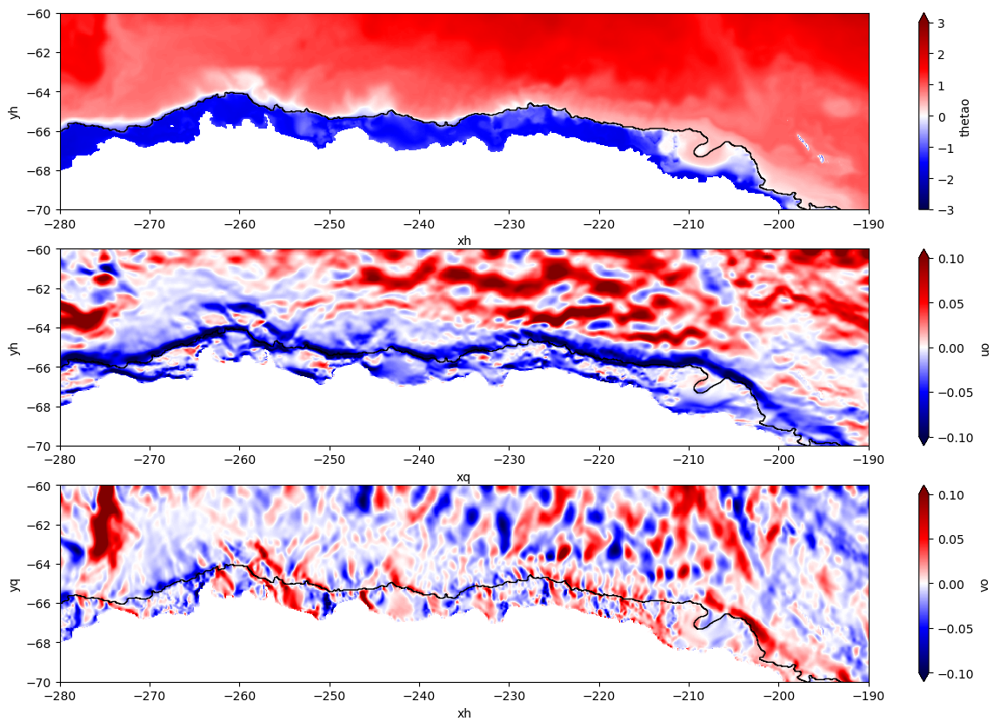

In [81]:
plt.figure(figsize=(15, 10))
plt.subplot(3,1,1)
(T01).plot(vmin=-3,vmax=3,cmap='seismic') #added 1.8 here for the freezing temperature corrections
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=1)
plt.xlim(-280,-190);plt.ylim(-70,-60)

plt.subplot(3,1,2)
U01.plot(vmin=-.1,vmax=.1,cmap='seismic')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=1)
plt.xlim(-280,-190);plt.ylim(-70,-60)

plt.subplot(3,1,3)
V01.plot(vmin=-.1,vmax=.1,cmap='seismic')
plt.plot(P01_unbinned_lon,P01_unbinned_lat,'black',lw=1)
plt.xlim(-280,-190);plt.ylim(-70,-60)

In [82]:
## Plots for the presentation
import cartopy.crs as ccrs
import cartopy.feature as cft

land_50m = cft.NaturalEarthFeature('physical', 'land', '50m',
                                   edgecolor='black', facecolor='papayawhip', linewidth=0.5)

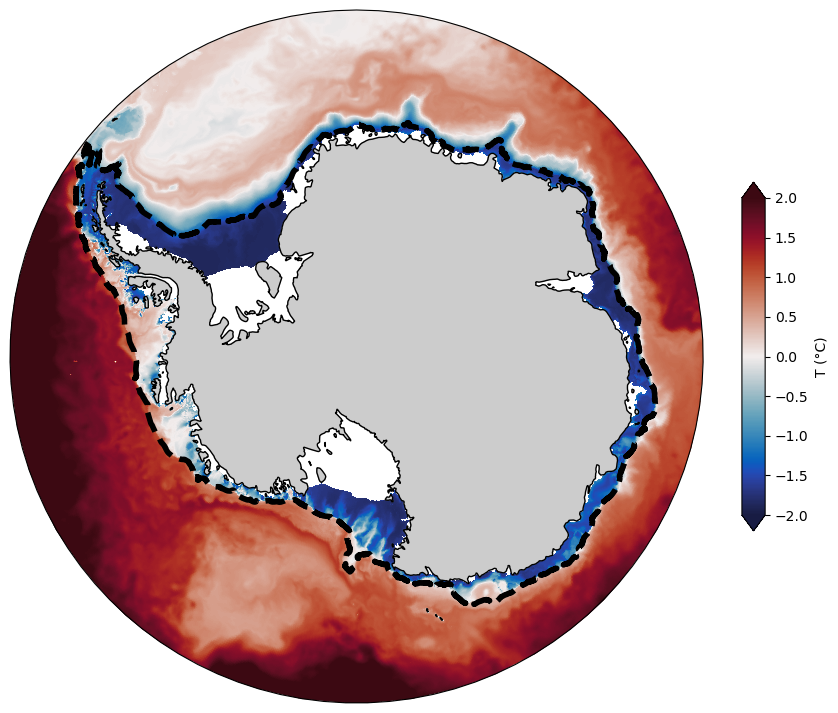

In [83]:
projection = ccrs.SouthPolarStereo()

plt.figure(figsize=(10, 9))
ax = plt.axes(projection=projection)

ax.set_extent([-280, 80, -80, -60], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.

import matplotlib.path as mpath

theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)

T01.plot(x='xh', y='yh',
         transform=ccrs.PlateCarree(),
         vmin=-2, vmax=2, extend='both',
         cmap=cm.cm.balance,
         cbar_kwargs = {'label': 'T (°C)',
                        'fraction': 0.03,
                        'aspect': 15,
                        'shrink': 0.7});

plt.plot(P0025_unbinned_lon,P0025_unbinned_lat,'--',lw=4,color='black',transform=ccrs.PlateCarree())
plt.savefig(figdir+'map_1kmisobath.png',dpi=300,bbox_inches='tight')

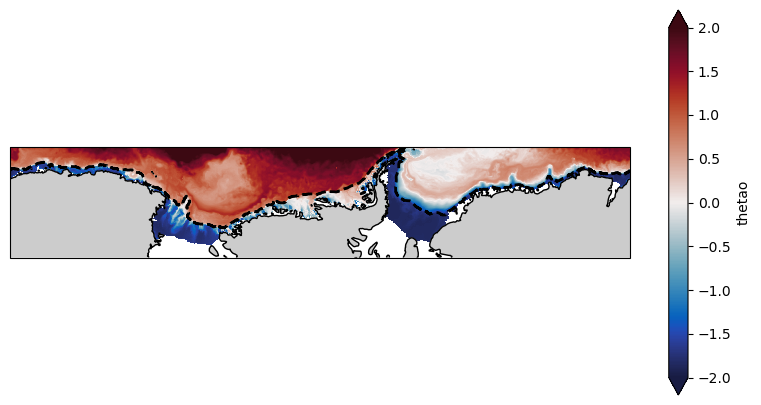

In [84]:
projection = ccrs.Mercator(central_longitude=-100, min_latitude=-80.0, max_latitude=-60.0)

plt.figure(figsize=(10, 5))
ax = plt.axes(projection=projection)

ax.set_extent([-280, 80, -80, -60], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

T01.plot(x='xh', y='yh',
         transform=ccrs.PlateCarree(),
         vmin=-2, vmax=2, extend='both',
         cmap=cm.cm.balance);
plt.plot(P0025_unbinned_lon,P0025_unbinned_lat,'--',lw=2,color='black',transform=ccrs.PlateCarree())
plt.savefig(figdir+'mapMErcator_1kmisobath.png',dpi=300,bbox_inches='tight')

## Part 3 - East Antarctic budget by resolution

Lets find each term in the balance we will do here.

$φ^{f}_{mean}(R)$ = Mean frontal heat transport calculated offline from $v_{mean}$ and  $T_{mean}$

$ φ^{f}_{eddy}(R)$ = Residual from mean frontal heat transport calculated online minus $φ^{f}_{mean}$ 

$ φ^{zc}_{mean}(R)$ =  Mean zonal convergence calculated offline from $v_{mean}$ and  $T_{mean}$

$ φ^{zc}_{eddies}(R)$ = Residual from mean zonal convergence calculated online minus $φ^{f}_{mean}$ 

Were $R$ is the model resolution ( Either $0.1^{o}$, $0.05^{o}$, or $0.025^{o}$).

Let's calculate them now

In [85]:
# mean terms
#panan01
phi_f_mean_01= (clim_panan01.binned_cross_slope_heat_trans.mean('month').sum('z_l')*p01_factor).sel(lon_bin_midpoints=slice(-300,-190)).sum('lon_bin_midpoints')
phi_zc_mean_01= (clim_panan01.zonal_convergence.mean('month').sum('z_l')*p01_factor).sel(lon_bin_midpoints=slice(-300,-190)).sum('lon_bin_midpoints')
#panan005
phi_f_mean_005= (clim_panan005.binned_cross_slope_heat_trans.mean('month').sum('z_l')*p005_factor).sel(lon_bin_midpoints=slice(-300,-190)).sum('lon_bin_midpoints')
phi_zc_mean_005= (clim_panan005.zonal_convergence.mean('month').sum('z_l')*p005_factor).sel(lon_bin_midpoints=slice(-300,-190)).sum('lon_bin_midpoints')

In [86]:
# total terms
#panan01
phi_f_total_01 = (p01_HT.binned_cross_slope_heat_trans.sum('z_l').resample(time='1M').mean().mean('time')*p01_factor).sel(lon_bin_midpoints=slice(-300,-190)).sum('lon_bin_midpoints')
phi_zc_total_01 = (p01_HT.zonal_convergence.sum('z_l').resample(time='1M').mean().mean('time')*p01_factor).sel(lon_bin_midpoints=slice(-300,-190)).sum('lon_bin_midpoints')

#panan005
phi_f_total_005 = (p005_HT.binned_cross_slope_heat_trans.sum('z_l').resample(time='1M').mean().mean('time')*p005_factor).sel(lon_bin_midpoints=slice(-300,-190)).sum('lon_bin_midpoints')
phi_zc_total_005 = (p005_HT.zonal_convergence.sum('z_l').resample(time='1M').mean().mean('time')*p005_factor).sel(lon_bin_midpoints=slice(-300,-190)).sum('lon_bin_midpoints')

In [87]:
# Eddy terms
#panan01
phi_f_eddy_01 =phi_f_total_01 - phi_f_mean_01
phi_zc_eddy_01 = phi_zc_total_01 - phi_zc_mean_01

#panan005
phi_f_eddy_005 = phi_f_total_005 - phi_f_mean_005
phi_zc_eddy_005 = phi_zc_total_005 -phi_zc_mean_005


How is the balance in each resolution in East Antarctica?

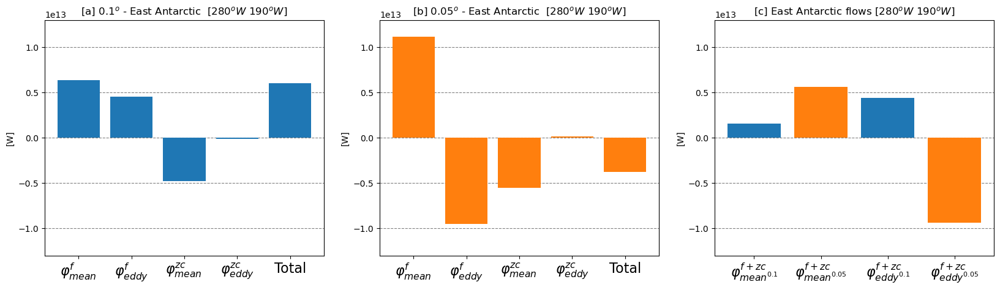

In [88]:
plt.figure(figsize=(20, 5))

ax =plt.subplot(1,3,1)
vars01=[r"$φ^{f}_{mean}$ ",r"$φ^{f}_{eddy}$ ",r"$φ^{zc}_{mean}$ ",r"$φ^{zc}_{eddy}$",r"Total"]
values01=[phi_f_mean_01,phi_f_eddy_01,phi_zc_mean_01,phi_zc_eddy_01,phi_f_total_01+phi_zc_total_01]
plt.bar(vars01, values01,color="tab:blue")
plt.xticks(fontsize=16)
plt.title(r"[a] $0.1^{o}$ - East Antarctic  [$280^{o}W\ 190^{o}W $]")
plt.ylabel(r"[W]"); plt.ylim(-13e12,13e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')

ax = plt.subplot(1,3,2)
vars005=[r"$φ^{f}_{mean}$ ",r"$φ^{f}_{eddy}$ ",r"$φ^{zc}_{mean}$ ",r"$φ^{zc}_{eddy}$",r"Total"]
values005=[phi_f_mean_005,phi_f_eddy_005,phi_zc_mean_005,phi_zc_eddy_005,phi_f_total_005+phi_zc_total_005]
plt.bar(vars005, values005,color="tab:orange")
plt.xticks(fontsize=16)
plt.title(r"[b] $0.05^{o}$ - East Antarctic  [$280^{o}W\ 190^{o}W $]")
plt.ylabel(r"[W]"); plt.ylim(-13e12,13e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')


ax = plt.subplot(1,3,3)
vars=[r"$φ^{f+zc}_{mean^{0.1}}$",r"$φ^{f+zc}_{mean^{0.05}}$",r"$φ^{f+zc}_{eddy^{0.1}}$",r"$φ^{f+zc}_{eddy^{0.05}}$"]
values=[phi_f_mean_01+phi_zc_mean_01, phi_f_mean_005+phi_zc_mean_005 ,phi_f_eddy_01+phi_zc_eddy_01, phi_f_eddy_005+phi_zc_eddy_005]
colors=["tab:blue","tab:orange","tab:blue","tab:orange"]
plt.bar(vars, values,color=colors)
plt.xticks(fontsize=16)
plt.title(r"[c] East Antarctic flows [$280^{o}W\ 190^{o}W $]")
plt.ylabel(r"[W]"); plt.ylim(-13e12,13e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')

plt.savefig(figdir+'RES_East_Antartcic_Budget.png',dpi=300,bbox_inches='tight')

As we can see, although the absolute values change, the terms maintain the same direction between the resolutions , *except the total and the $φ^{f}_{eddy}$*. This suggests that **the change in $φ^{f}_{eddy}$ flux from nourthward to Southward is what defines the change in total heat transport/budget in East Antarctica**. That is interesting because it highlights that solving the first barcolinic rossby radius in the region is capable to even reversing the direction of the heat transport.

Some additional takes are....

[a] If we assume the sum of mean fluxes ($φ^{f}_{mean}$ + $φ^{zc}_{mean}$) corresponds to heat budget due to ASC/Coastal Current changes, then in both resolutions and isobaths, we have ASC/CC exporting heat out of the sistem [c], mostly through the 1 km isobath. Which suggests that ASC leaves the isobath in this slice of East Antarctica.


[b] The model $0.05^{o}$ model suggests a net eddy inflow through the isobath in east Antartcia of  9.5 TW

## Part 4 - Ross sea budget by resolution

In [89]:
# mean terms
#panan01
ROSS_phi_f_mean_01= (clim_panan01.binned_cross_slope_heat_trans.mean('month').sum('z_l')*p01_factor).sel(lon_bin_midpoints=slice(-190,-165)).sum('lon_bin_midpoints')
ROSS_phi_zc_mean_01= (clim_panan01.zonal_convergence.mean('month').sum('z_l')*p01_factor).sel(lon_bin_midpoints=slice(-190,-165)).sum('lon_bin_midpoints')
#panan005
ROSS_phi_f_mean_005= (clim_panan005.binned_cross_slope_heat_trans.mean('month').sum('z_l')*p005_factor).sel(lon_bin_midpoints=slice(-190,-165)).sum('lon_bin_midpoints')
ROSS_phi_zc_mean_005= (clim_panan005.zonal_convergence.mean('month').sum('z_l')*p005_factor).sel(lon_bin_midpoints=slice(-190,-165)).sum('lon_bin_midpoints')

In [90]:
# total terms
#panan01
ROSS_phi_f_total_01 = (p01_HT.binned_cross_slope_heat_trans.sum('z_l').resample(time='1M').mean().mean('time')*p01_factor).sel(lon_bin_midpoints=slice(-190,-165)).sum('lon_bin_midpoints')
ROSS_phi_zc_total_01 = (p01_HT.zonal_convergence.sum('z_l').resample(time='1M').mean().mean('time')*p01_factor).sel(lon_bin_midpoints=slice(-190,-165)).sum('lon_bin_midpoints')

#panan005
ROSS_phi_f_total_005 = (p005_HT.binned_cross_slope_heat_trans.sum('z_l').resample(time='1M').mean().mean('time')*p005_factor).sel(lon_bin_midpoints=slice(-190,-165)).sum('lon_bin_midpoints')
ROSS_phi_zc_total_005 = (p005_HT.zonal_convergence.sum('z_l').resample(time='1M').mean().mean('time')*p005_factor).sel(lon_bin_midpoints=slice(-190,-165)).sum('lon_bin_midpoints')



In [91]:
# Eddy terms
#panan01
ROSS_phi_f_eddy_01 =ROSS_phi_f_total_01 - ROSS_phi_f_mean_01
ROSS_phi_zc_eddy_01 = ROSS_phi_zc_total_01 - ROSS_phi_zc_mean_01

#panan005
ROSS_phi_f_eddy_005 = ROSS_phi_f_total_005 - ROSS_phi_f_mean_005
ROSS_phi_zc_eddy_005 = ROSS_phi_zc_total_005 -ROSS_phi_zc_mean_005


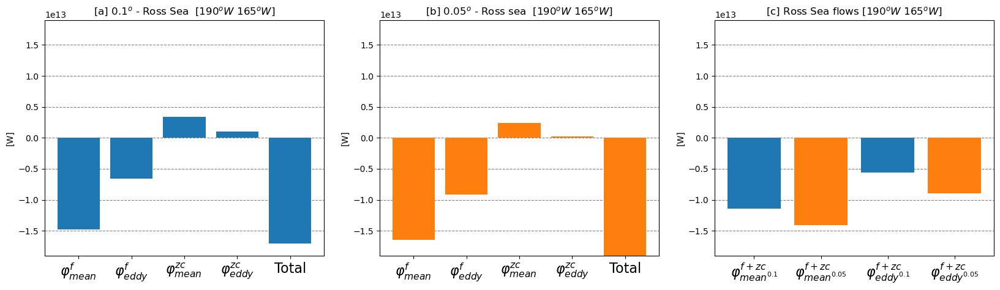

In [92]:
plt.figure(figsize=(20, 5))

ax =plt.subplot(1,3,1)
vars01=[r"$φ^{f}_{mean}$ ",r"$φ^{f}_{eddy}$ ",r"$φ^{zc}_{mean}$ ",r"$φ^{zc}_{eddy}$",r"Total"]
values01=[ROSS_phi_f_mean_01, ROSS_phi_f_eddy_01, ROSS_phi_zc_mean_01, ROSS_phi_zc_eddy_01, ROSS_phi_f_total_01 + ROSS_phi_zc_total_01]
plt.bar(vars01, values01,color="tab:blue")
plt.xticks(fontsize=16)
plt.title(r"[a] $0.1^{o}$ - Ross Sea  [$190^{o}W\ 165^{o}W$]")
plt.ylabel(r"[W]"); plt.ylim(-19e12,19e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')

ax = plt.subplot(1,3,2)
vars005=[r"$φ^{f}_{mean}$ ",r"$φ^{f}_{eddy}$ ",r"$φ^{zc}_{mean}$ ",r"$φ^{zc}_{eddy}$",r"Total"]
values005=[ROSS_phi_f_mean_005, ROSS_phi_f_eddy_005, ROSS_phi_zc_mean_005, ROSS_phi_zc_eddy_005, ROSS_phi_f_total_005 + ROSS_phi_zc_total_005]
plt.bar(vars005, values005,color="tab:orange")
plt.xticks(fontsize=16)
plt.title(r"[b] $0.05^{o}$ - Ross sea  [$190^{o}W\ 165^{o}W$]")
plt.ylabel(r"[W]"); plt.ylim(-19e12,19e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')


ax = plt.subplot(1,3,3)
vars=[r"$φ^{f+zc}_{mean^{0.1}}$",r"$φ^{f+zc}_{mean^{0.05}}$",r"$φ^{f+zc}_{eddy^{0.1}}$",r"$φ^{f+zc}_{eddy^{0.05}}$"]
values=[ROSS_phi_f_mean_01 + ROSS_phi_zc_mean_01, ROSS_phi_f_mean_005 + ROSS_phi_zc_mean_005 ,ROSS_phi_f_eddy_01 + ROSS_phi_zc_eddy_01, ROSS_phi_f_eddy_005+ ROSS_phi_zc_eddy_005]
colors=["tab:blue","tab:orange","tab:blue","tab:orange"]
plt.bar(vars, values,color=colors)
plt.xticks(fontsize=16)
plt.title(r"[c] Ross Sea flows [$190^{o}W\ 165^{o}W$]")
plt.ylabel(r"[W]"); plt.ylim(-19e12,19e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')

plt.savefig(figdir+'RES_ROSS_Budget.png',dpi=300,bbox_inches='tight')

Intersting that in the Ross Sea, all components are rearranged in a way to increase the cross-slope heat transport, both carries by eddies and by the mean climatologica circulation

## Part 5 - Weddell sea budget by resolution

In [93]:
# mean terms
#panan01
WED_phi_f_mean_01= (clim_panan01.binned_cross_slope_heat_trans.mean('month').sum('z_l')*p01_factor).sel(lon_bin_midpoints=slice(-58,-28)).sum('lon_bin_midpoints')
WED_phi_zc_mean_01= (clim_panan01.zonal_convergence.mean('month').sum('z_l')*p01_factor).sel(lon_bin_midpoints=slice(-58,-28)).sum('lon_bin_midpoints')
#panan005
WED_phi_f_mean_005= (clim_panan005.binned_cross_slope_heat_trans.mean('month').sum('z_l')*p005_factor).sel(lon_bin_midpoints=slice(-58,-28)).sum('lon_bin_midpoints')
WED_phi_zc_mean_005= (clim_panan005.zonal_convergence.mean('month').sum('z_l')*p005_factor).sel(lon_bin_midpoints=slice(-58,-28)).sum('lon_bin_midpoints')

In [94]:
# total terms
#panan01
WED_phi_f_total_01 = (p01_HT.binned_cross_slope_heat_trans.sum('z_l').resample(time='1M').mean().mean('time')*p01_factor).sel(lon_bin_midpoints=slice(-58,-28)).sum('lon_bin_midpoints')
WED_phi_zc_total_01 = (p01_HT.zonal_convergence.sum('z_l').resample(time='1M').mean().mean('time')*p01_factor).sel(lon_bin_midpoints=slice(-58,-28)).sum('lon_bin_midpoints')

#panan005
WED_phi_f_total_005 = (p005_HT.binned_cross_slope_heat_trans.sum('z_l').resample(time='1M').mean().mean('time')*p005_factor).sel(lon_bin_midpoints=slice(-58,-28)).sum('lon_bin_midpoints')
WED_phi_zc_total_005 = (p005_HT.zonal_convergence.sum('z_l').resample(time='1M').mean().mean('time')*p005_factor).sel(lon_bin_midpoints=slice(-58,-28)).sum('lon_bin_midpoints')

In [95]:
# Eddy terms
#panan01
WED_phi_f_eddy_01 =WED_phi_f_total_01 - WED_phi_f_mean_01
WED_phi_zc_eddy_01 = WED_phi_zc_total_01 - WED_phi_zc_mean_01

#panan005
WED_phi_f_eddy_005 = WED_phi_f_total_005 - WED_phi_f_mean_005
WED_phi_zc_eddy_005 = WED_phi_zc_total_005 -WED_phi_zc_mean_005

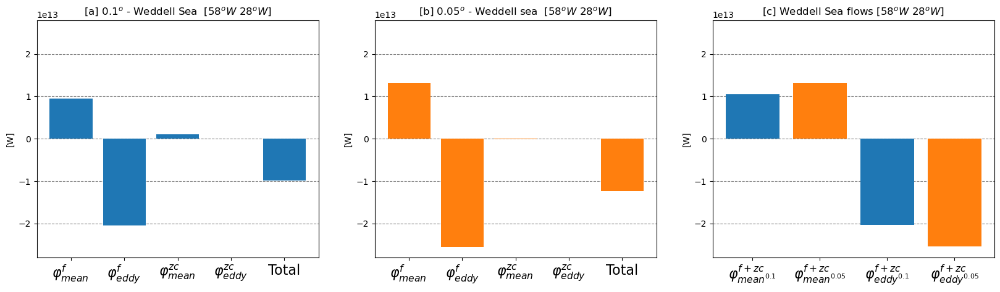

In [96]:
plt.figure(figsize=(20, 5))

ax =plt.subplot(1,3,1)
vars01=[r"$φ^{f}_{mean}$ ",r"$φ^{f}_{eddy}$ ",r"$φ^{zc}_{mean}$ ",r"$φ^{zc}_{eddy}$",r"Total"]
values01=[WED_phi_f_mean_01, WED_phi_f_eddy_01, WED_phi_zc_mean_01, WED_phi_zc_eddy_01, WED_phi_f_total_01 + WED_phi_zc_total_01]
plt.bar(vars01, values01,color="tab:blue")
plt.xticks(fontsize=16)
plt.title(r"[a] $0.1^{o}$ - Weddell Sea  [$58^{o}W\ 28^{o}W$]")
plt.ylabel(r"[W]"); plt.ylim(-28e12,28e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')

ax = plt.subplot(1,3,2)
vars005=[r"$φ^{f}_{mean}$ ",r"$φ^{f}_{eddy}$ ",r"$φ^{zc}_{mean}$ ",r"$φ^{zc}_{eddy}$",r"Total"]
values005=[WED_phi_f_mean_005, WED_phi_f_eddy_005, WED_phi_zc_mean_005, WED_phi_zc_eddy_005, WED_phi_f_total_005 + WED_phi_zc_total_005]
plt.bar(vars005, values005,color="tab:orange")
plt.xticks(fontsize=16)
plt.title(r"[b] $0.05^{o}$ - Weddell sea  [$58^{o}W\ 28^{o}W$]")
plt.ylabel(r"[W]"); plt.ylim(-28e12,28e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')


ax = plt.subplot(1,3,3)
vars=[r"$φ^{f+zc}_{mean^{0.1}}$",r"$φ^{f+zc}_{mean^{0.05}}$",r"$φ^{f+zc}_{eddy^{0.1}}$",r"$φ^{f+zc}_{eddy^{0.05}}$"]
values=[WED_phi_f_mean_01 + WED_phi_zc_mean_01, WED_phi_f_mean_005 + WED_phi_zc_mean_005 ,WED_phi_f_eddy_01 + WED_phi_zc_eddy_01, WED_phi_f_eddy_005+ WED_phi_zc_eddy_005]
colors=["tab:blue","tab:orange","tab:blue","tab:orange"]
plt.bar(vars, values,color=colors)
plt.xticks(fontsize=16)
plt.title(r"[c] Weddell Sea flows [$58^{o}W\ 28^{o}W$]")
plt.ylabel(r"[W]"); plt.ylim(-28e12,28e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')

plt.savefig(figdir+'RES_WEDDEL_Budget.png',dpi=300,bbox_inches='tight')

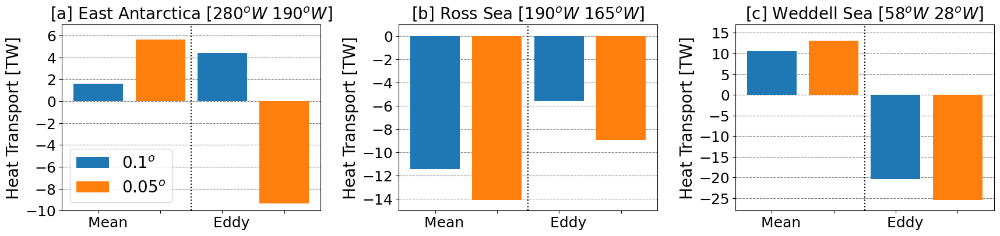

In [126]:
plt.figure(figsize=(20,4))

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.3,
                    hspace=0.4)

ax = plt.subplot(1,3,1)
#vars=[r"$φ^{f+zc}_{mean^{0.1}}$",r"$φ^{f+zc}_{mean^{0.05}}$",r"$φ^{f+zc}_{eddy^{0.1}}$",r"$φ^{f+zc}_{eddy^{0.05}}$"]

vars=['    Mean','','    Eddy',' ']
values=[(phi_f_mean_01+phi_zc_mean_01)/1e12, (phi_f_mean_005+phi_zc_mean_005)/1e12 ,(phi_f_eddy_01+phi_zc_eddy_01)/1e12, (phi_f_eddy_005+phi_zc_eddy_005)/1e12]
colors=["tab:blue","tab:orange","tab:blue","tab:orange"]
plt.bar(vars, values,color=colors,label=[r'$0.1^o$',r'$0.05^o$','',''])
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.title(r"[a] East Antarctica [$280^{o}W\ 190^{o}W $]",fontsize=20)
plt.ylabel(r"Heat Transport [TW]",fontsize=20); plt.ylim(-10,7)
plt.plot([1.5,1.5],[-10,7],':',color='black')
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')
plt.legend(fontsize=20)

ax = plt.subplot(1,3,2)
#vars=[r"$φ^{f+zc}_{mean^{0.1}}$",r"$φ^{f+zc}_{mean^{0.05}}$",r"$φ^{f+zc}_{eddy^{0.1}}$",r"$φ^{f+zc}_{eddy^{0.05}}$"]
vars=['    Mean','','    Eddy',' ']
values=[(ROSS_phi_f_mean_01 + ROSS_phi_zc_mean_01)/1e12, (ROSS_phi_f_mean_005 + ROSS_phi_zc_mean_005)/1e12,(ROSS_phi_f_eddy_01 + ROSS_phi_zc_eddy_01)/1e12, (ROSS_phi_f_eddy_005+ ROSS_phi_zc_eddy_005)/1e12]
colors=["tab:blue","tab:orange","tab:blue","tab:orange"]
plt.bar(vars, values,color=colors)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.plot([1.5,1.5],[-15,1],':',color='black')
plt.title(r"[b] Ross Sea [$190^{o}W\ 165^{o}W$]",fontsize=20)
plt.ylabel(r"Heat Transport [TW]",fontsize=20);  plt.ylim(-15,1)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')


ax3 = plt.subplot(1,3,3)
#vars=[r"$φ^{f+zc}_{mean^{0.1}}$",r"$φ^{f+zc}_{mean^{0.05}}$",r"$φ^{f+zc}_{eddy^{0.1}}$",r"$φ^{f+zc}_{eddy^{0.05}}$"]
vars=['    Mean','','    Eddy',' ']
values=[(WED_phi_f_mean_01 + WED_phi_zc_mean_01)/1e12,(WED_phi_f_mean_005 + WED_phi_zc_mean_005)/1e12 ,(WED_phi_f_eddy_01 + WED_phi_zc_eddy_01)/1e12, (WED_phi_f_eddy_005+ WED_phi_zc_eddy_005)/1e12]
colors=["tab:blue","tab:orange","tab:blue","tab:orange"]
plt.bar(vars, values,color=colors)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.plot([1.5,1.5],[-28,17],':',color='black')
plt.title(r"[c] Weddell Sea [$58^{o}W\ 28^{o}W$]",fontsize=20)
plt.ylabel(r"Heat Transport [TW]",fontsize=20);  plt.ylim(-28,17)
ax3.set_axisbelow(True)
ax3.yaxis.grid(color='gray', linestyle='dashed')

### Part 5 

In [98]:
90 - 360, 105-360

(-270, -255)

In [99]:
# full region - 90E to 114E
# 96 E to 105E: 96
# mean terms
#panan01
R1_phi_f_mean_01= (clim_panan01.binned_cross_slope_heat_trans.mean('month').sum('z_l')*p01_factor).sel(lon_bin_midpoints=slice(-270,-255)).sum('lon_bin_midpoints')
R1_phi_zc_mean_01= (clim_panan01.zonal_convergence.mean('month').sum('z_l')*p01_factor).sel(lon_bin_midpoints=slice(-270,-255)).sum('lon_bin_midpoints')
#panan005
R1_phi_f_mean_005= (clim_panan005.binned_cross_slope_heat_trans.mean('month').sum('z_l')*p005_factor).sel(lon_bin_midpoints=slice(-270,-255)).sum('lon_bin_midpoints')
R1_phi_zc_mean_005= (clim_panan005.zonal_convergence.mean('month').sum('z_l')*p005_factor).sel(lon_bin_midpoints=slice(-270,-255)).sum('lon_bin_midpoints')

In [100]:
# total terms
#panan01
R1_phi_f_total_01 = (p01_HT.binned_cross_slope_heat_trans.sum('z_l').resample(time='1M').mean().mean('time')*p01_factor).sel(lon_bin_midpoints=slice(-270,-255)).sum('lon_bin_midpoints')
R1_phi_zc_total_01 = (p01_HT.zonal_convergence.sum('z_l').resample(time='1M').mean().mean('time')*p01_factor).sel(lon_bin_midpoints=slice(-270,-255)).sum('lon_bin_midpoints')

#panan005
R1_phi_f_total_005 = (p005_HT.binned_cross_slope_heat_trans.sum('z_l').resample(time='1M').mean().mean('time')*p005_factor).sel(lon_bin_midpoints=slice(-270,-255)).sum('lon_bin_midpoints')
R1_phi_zc_total_005 = (p005_HT.zonal_convergence.sum('z_l').resample(time='1M').mean().mean('time')*p005_factor).sel(lon_bin_midpoints=slice(-270,-255)).sum('lon_bin_midpoints')

In [101]:
# Eddy terms
#panan01
R1_phi_f_eddy_01 =R1_phi_f_total_01 - R1_phi_f_mean_01
R1_phi_zc_eddy_01 = R1_phi_zc_total_01 - R1_phi_zc_mean_01

#panan005
R1_phi_f_eddy_005 = R1_phi_f_total_005 - R1_phi_f_mean_005
R1_phi_zc_eddy_005 = R1_phi_zc_total_005 - R1_phi_zc_mean_005


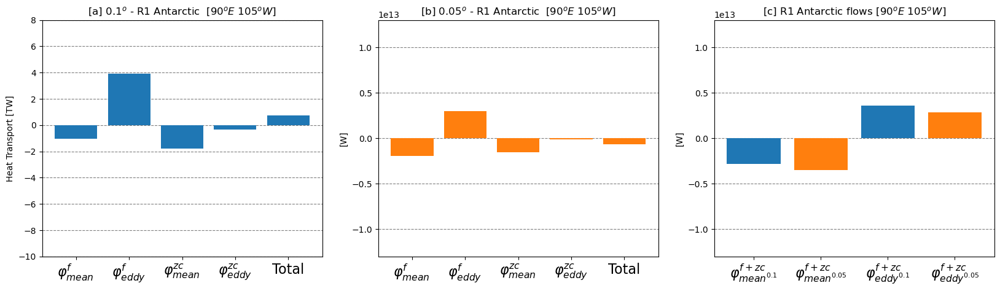

In [102]:
plt.figure(figsize=(20, 5))

ax =plt.subplot(1,3,1)
vars01=[r"$φ^{f}_{mean}$ ",r"$φ^{f}_{eddy}$ ",r"$φ^{zc}_{mean}$ ",r"$φ^{zc}_{eddy}$",r"Total"]
values01=[R1_phi_f_mean_01/1e12, R1_phi_f_eddy_01/1e12, R1_phi_zc_mean_01/1e12, R1_phi_zc_eddy_01/1e12, R1_phi_f_total_01/1e12+ R1_phi_zc_total_01/1e12]
plt.bar(vars01, values01,color="tab:blue")
plt.xticks(fontsize=16)
plt.title(r"[a] $0.1^{o}$ - R1 Antarctic  [$90^{o}E\ 105^{o}W $]")
plt.ylabel(r"Heat Transport [TW]"); plt.ylim(-10,8)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')

ax = plt.subplot(1,3,2)
vars005=[r"$φ^{f}_{mean}$ ",r"$φ^{f}_{eddy}$ ",r"$φ^{zc}_{mean}$ ",r"$φ^{zc}_{eddy}$",r"Total"]
values005=[R1_phi_f_mean_005, R1_phi_f_eddy_005, R1_phi_zc_mean_005, R1_phi_zc_eddy_005, R1_phi_f_total_005+ R1_phi_zc_total_005]
plt.bar(vars005, values005,color="tab:orange")
plt.xticks(fontsize=16)
plt.title(r"[b] $0.05^{o}$ - R1 Antarctic  [$90^{o}E\ 105^{o}W $]")
plt.ylabel(r"[W]"); plt.ylim(-13e12,13e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')


ax = plt.subplot(1,3,3)
vars=[r"$φ^{f+zc}_{mean^{0.1}}$",r"$φ^{f+zc}_{mean^{0.05}}$",r"$φ^{f+zc}_{eddy^{0.1}}$",r"$φ^{f+zc}_{eddy^{0.05}}$"]
values=[R1_phi_f_mean_01+ R1_phi_zc_mean_01, R1_phi_f_mean_005+ R1_phi_zc_mean_005 ,R1_phi_f_eddy_01+ R1_phi_zc_eddy_01, R1_phi_f_eddy_005+ R1_phi_zc_eddy_005]
colors=["tab:blue","tab:orange","tab:blue","tab:orange"]
plt.bar(vars, values,color=colors)
plt.xticks(fontsize=16)
plt.title(r"[c] R1 Antarctic flows [$90^{o}E\ 105^{o}W $]")
plt.ylabel(r"[W]"); plt.ylim(-13e12,13e12)
ax.set_axisbelow(True)
ax.yaxis.grid(color='gray', linestyle='dashed')

plt.savefig(figdir+'RES_R1_Budget.png',dpi=300,bbox_inches='tight')

In [103]:
float(R1_phi_zc_mean_005)/1e12

-1.5546492235780627